# CrabNet Bandgap Prediction for Chalcogenide Perovskites

This notebook implements the **composition-based bandgap prediction** described in
Section 3.3 of the manuscript. We use [CrabNet v2](https://doi.org/10.1038/s41524-021-00545-1)
(Compositionally-Restricted Attention-Based Network) with **Pettifor composition
fingerprints** as extended features.

**Training data** — three sources, merged and deduplicated:

| Source | Description | Approx. entries |
|--------|-------------|----------------:|
| Halide perovskites | NOMAD bandgap records (ABX₃, X = halide) | ~51 000 |
| Chalcogenide perovskites | Experimentally reported (ABX₃, X = S, Se) | 17 |
| Chalcogenide semiconductors | Literature with Chem Data Extractor (non-perovskite chalcogenides) | ~17 800 |

**Key analysis additions**:
- Leave-One-Out Cross-Validation (LOOCV) on the 11 unique chalcogenide perovskite
  formulas to obtain per-compound error estimates.
- Publication-quality parity plot with color coding by data source.
- Ablation studies for data-source contribution and Pettifor features.
- Null-model baselines (median / mean predictor).

---
## 0. Setup

In [1]:
from __future__ import annotations

import warnings
warnings.filterwarnings('ignore')

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# --- Patch SWA for PyTorch >= 2.x compatibility ---
# CrabNet v2.0.8 bundles its own SWA (crabnet.utils.optim.SWA) which lacks
# attributes expected by modern PyTorch optimizers.
from crabnet.utils.optim import SWA  # type: ignore
_original_swa_init = SWA.__init__
def _patched_swa_init(self, *args, **kwargs):
    _original_swa_init(self, *args, **kwargs)
    if not hasattr(self, '_optimizer_step_pre_hooks'):
        self._optimizer_step_pre_hooks = {}
    if not hasattr(self, '_optimizer_step_post_hooks'):
        self._optimizer_step_post_hooks = {}
SWA.__init__ = _patched_swa_init
# ------------------------------------------------

from crabnet.crabnet_ import CrabNet          # type: ignore
from crabnet.utils.data import groupby_formula # type: ignore

from tf_chpvk_pv.config import (
    RAW_DATA_DIR, PROCESSED_DATA_DIR, INTERIM_DATA_DIR,
    TRAINED_MODELS, FIGURES_DIR,
)
from tf_chpvk_pv.modeling.CrabNet.utils import (
    DEVICE,
    get_raw_data,
    save_processed_data,
    get_petiffor_features,
    load_model,
    test_r2_score,
    predict_bandgap,
    get_CrystaLLM_predictions,
    get_SISSO_predictions,
    get_experimental_predictions,
)

RANDOM_SEED = 42
print(f'Device: {DEVICE}')

# Matplotlib defaults for publication figures
mpl.rcParams.update({
    'font.size': 16,
    'axes.labelsize': 16,
    'axes.titlesize': 18,
    'figure.dpi': 150,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
})

2026-02-18 15:35:03.523 | INFO     | tf_chpvk_pv.config:<module>:11 - PROJ_ROOT path is: /home/dagar/TF-ChPVK-PV


2026-02-18 15:35:03.666 | INFO     | tf_chpvk_pv.modeling.CrabNet.utils:<module>:20 - CrabNet device: cuda
Device: cuda


---
## 1. Data Loading & Preprocessing

We load three CSV sources, tag each row with its origin, and apply the following
filters:
1. Drop rows with missing bandgap or formula.
2. Keep only entries with bandgap > 1.0 eV.
3. Remove outliers: entries whose bandgap deviates more than 0.3 eV from the
   median of their formula group.

> **Note:** Outlier removal is applied on the full dataset before splitting, which
> could introduce a minor information leak. This is a deliberate preprocessing
> choice — the medians used for filtering are per-formula statistics that barely
> change when a single entry is held out.

In [2]:
from tf_chpvk_pv.dataset import get_perovskite_data_NOMAD

# Ensure the NOMAD data file exists locally
get_perovskite_data_NOMAD(False)

# Load & clean
df = get_raw_data()
print(f'Cleaned dataset: {df.shape[0]} rows, {df["reduced_formulas"].nunique()} unique formulas')
df.head(3)

Importing existing data... with size: (51123, 3)
The data comes from the following sources:
74.16 % from halide perovskites,
0.0261 % from chalcogenides perovskites,
25.82 % from chalcogenide semiconductors
Cleaned dataset: 50662 rows, 3628 unique formulas


,reduced_formulas,descriptive_formulas,bandgap,source
0,CH6I3NPb,MAPbI3,1.6,pvk
2,CH6I3NPb,MAPbI3,1.5,pvk
3,CH6I3NPb,MAPbI3,1.6,pvk


---
## 2. Formula Grouping & Deduplication

Many formulas appear multiple times with different reported bandgap values.
We group by formula and take the **median** bandgap to obtain one target per
unique composition. The `source` column is preserved on the original DataFrame
for later use in stratified splitting and LOOCV.

In [3]:
# Rename to CrabNet convention
df.rename(columns={'bandgap': 'target', 'reduced_formulas': 'formula'}, inplace=True)

# Group repeated formulas — median target
df_grouped = groupby_formula(df, how='median')

# Attach source information to the grouped frame
for formula in df_grouped['formula']:
    df_grouped.loc[df_grouped['formula'] == formula, 'source'] = (
        df.loc[df['formula'] == formula, 'source'].values[0]
    )

# Source breakdown
src_pct = (df_grouped['source'].value_counts() / len(df_grouped) * 100)
print(f'Unique compositions: {len(df_grouped)}')
for src, pct in src_pct.items():
    print(f'  {src:20s}: {pct:6.2f}%')

save_processed_data(df_grouped)

Unique compositions: 3628
  chalc_semicon       :  56.17%
  pvk                 :  43.52%
  chalcogenides       :   0.30%
2026-02-18 15:35:14.110 | INFO     | tf_chpvk_pv.modeling.CrabNet.utils:save_processed_data:93 - Processed data saved to /home/dagar/TF-ChPVK-PV/data/interim/df_grouped_formula_complete_dataset.csv


---
## 3. Feature Engineering — Pettifor Composition Embedding

We compute a 98-dimensional Pettifor fingerprint for each formula using a
composition-weighted embedding matrix. The data is then split
**80 / 10 / 10** (train / validation / test) with **stratification by source**
to maintain the class balance across splits.

In [4]:
# Drop source before splitting (get_petiffor_features re-adds it internally for stratification)
df_grouped_no_src = df_grouped.drop(columns=['source'])

train_df, val_df, test_df, feature_names = get_petiffor_features(
    df_grouped_no_src, original_df=df, train=True
)

print(f'Train: {len(train_df):>5d}  |  Val: {len(val_df):>5d}  |  Test: {len(test_df):>5d}')
print(f'Pettifor feature columns: {len(feature_names)}')

Train:  2902  |  Val:   363  |  Test:   363
Pettifor feature columns: 98


### Element Prevalence

Visual check of elemental coverage in the training set using
[pymatviz](https://pymatviz.janosh.dev/).

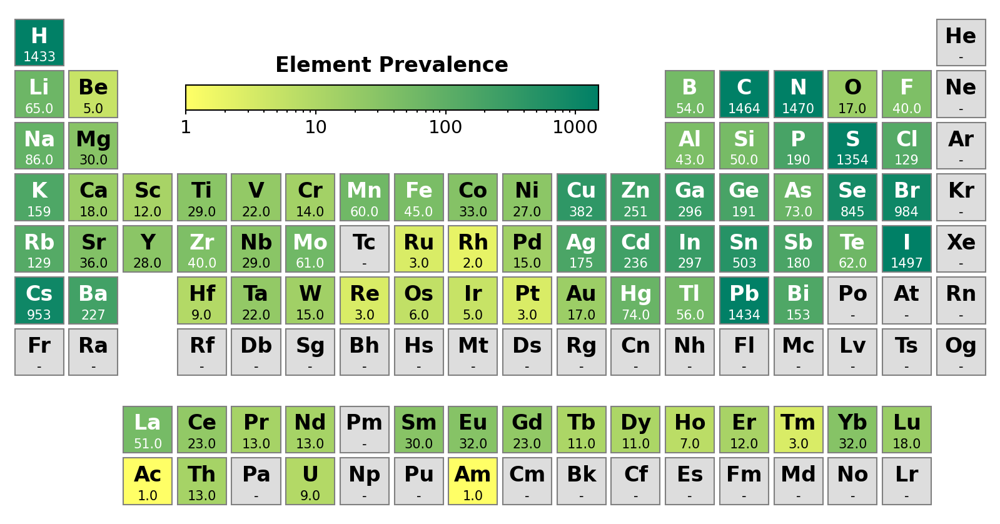

In [5]:
import re
from pymatviz import count_elements, ptable_heatmap  # type: ignore

element_counts = count_elements(
    [re.sub(r'\d+', '', x).replace('.', '') for x in df_grouped['formula']]
)
ptable_heatmap(element_counts, log=True, cbar_title='Element Prevalence')
plt.show()

---
## 4. Model Training

We train CrabNet with the **mat2vec** elemental embedding and the Pettifor
fingerprint columns as `extend_features`. CrabNet uses its default
hyperparameters (3 attention layers, 512 dim, 4 heads, SWA) with
`learningcurve=True` to track training dynamics.


Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2902/2902 [00:00<00:00, 71218.84formulae/s]


skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 5.0), ('I', 3.0), ('N', 2.0), ('C', 1.0), ('Sn

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 238828.60formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.458 val mae: 0.459


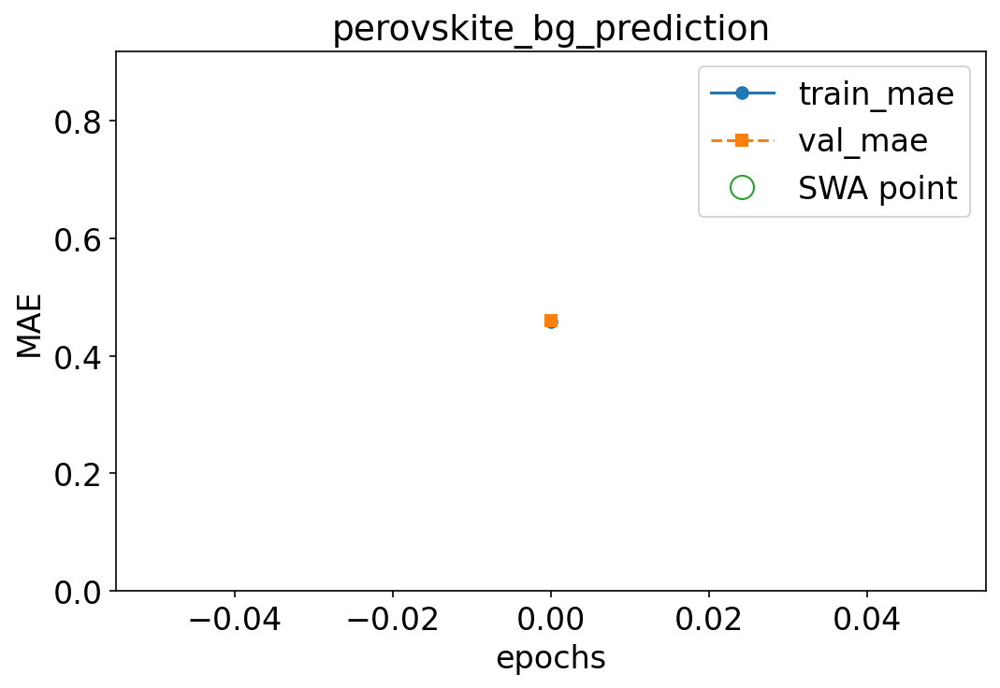

Epoch: 19/300 --- train mae: 0.241 val mae: 0.286


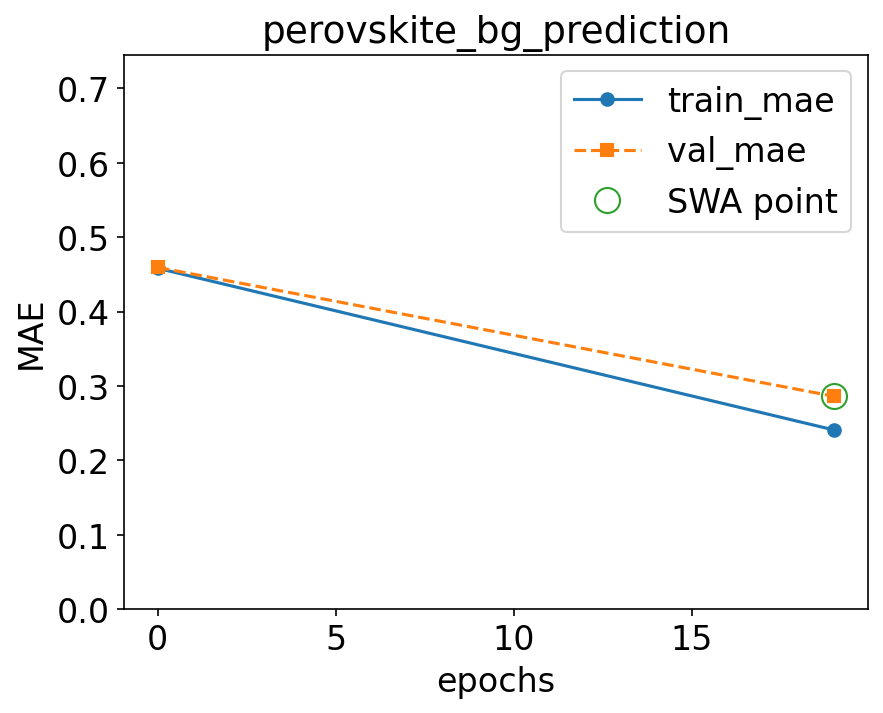

Epoch: 39/300 --- train mae: 0.161 val mae: 0.273


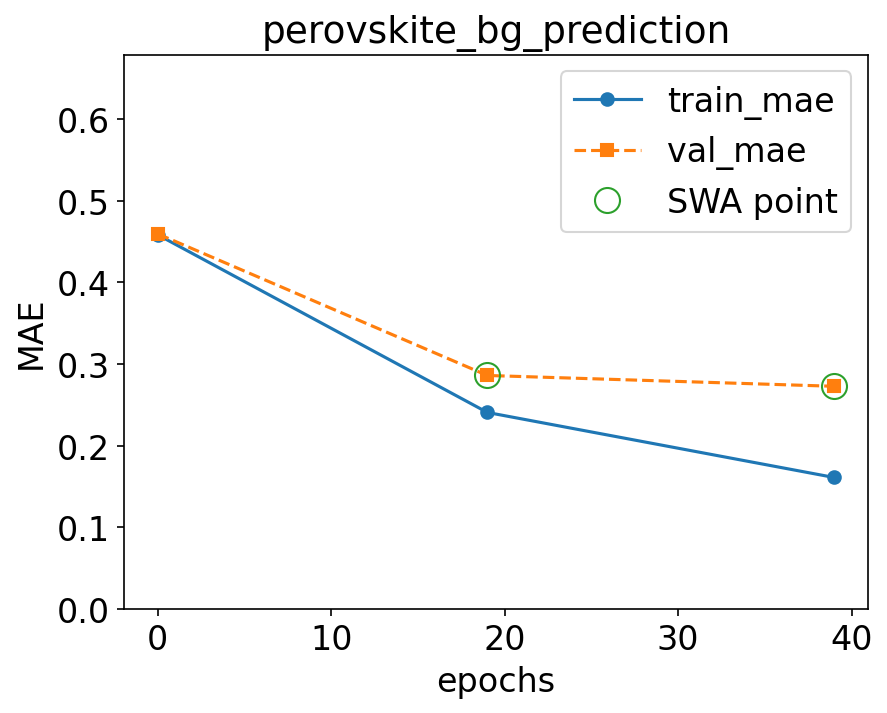

Epoch: 59/300 --- train mae: 0.11 val mae: 0.267


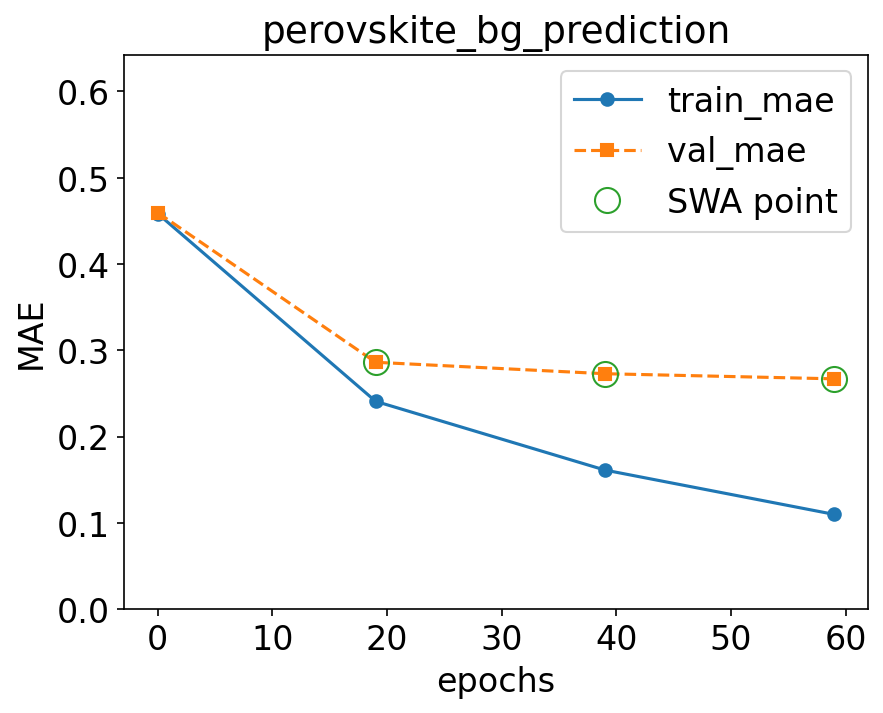

Epoch 79 failed to improve.
Discarded: 1/3 weight updates
Epoch: 79/300 --- train mae: 0.0816 val mae: 0.272


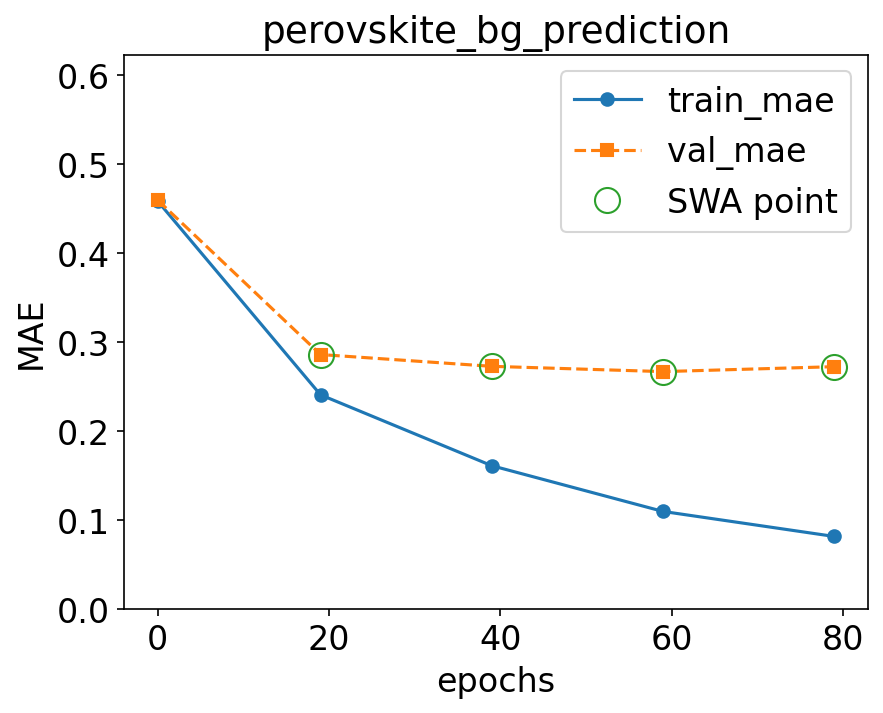

Epoch 99 failed to improve.
Discarded: 2/3 weight updates
Epoch: 99/300 --- train mae: 0.063 val mae: 0.275


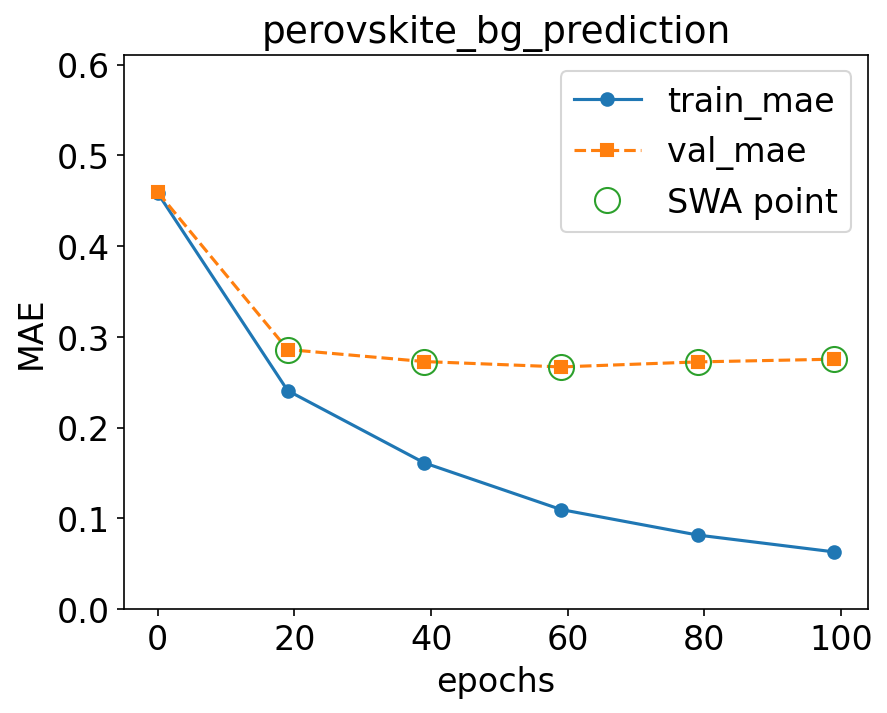

Epoch 119 failed to improve.
Discarded: 3/3 weight updates
Epoch: 119/300 --- train mae: 0.0522 val mae: 0.277


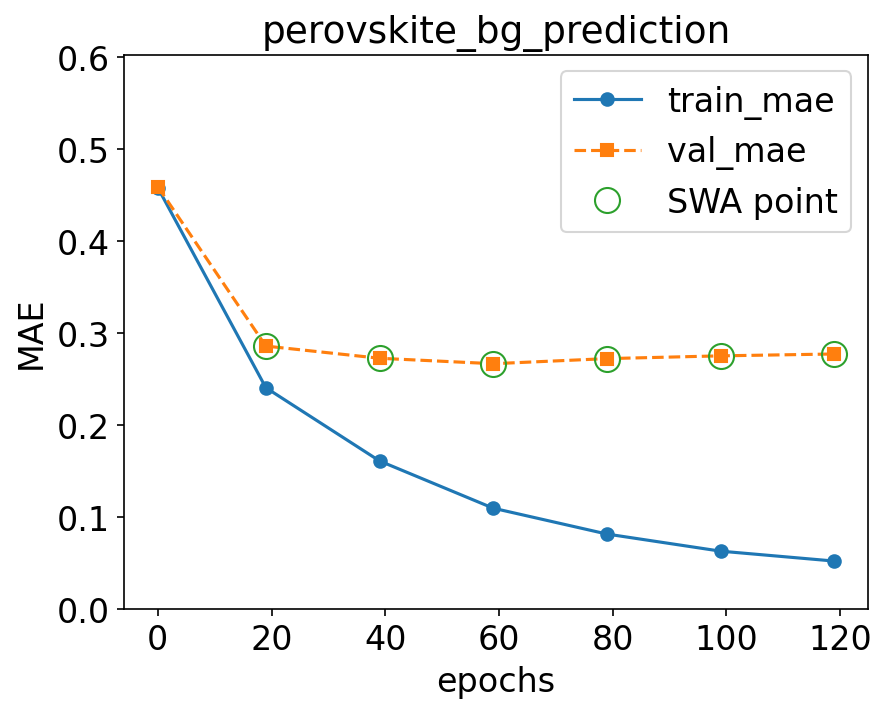

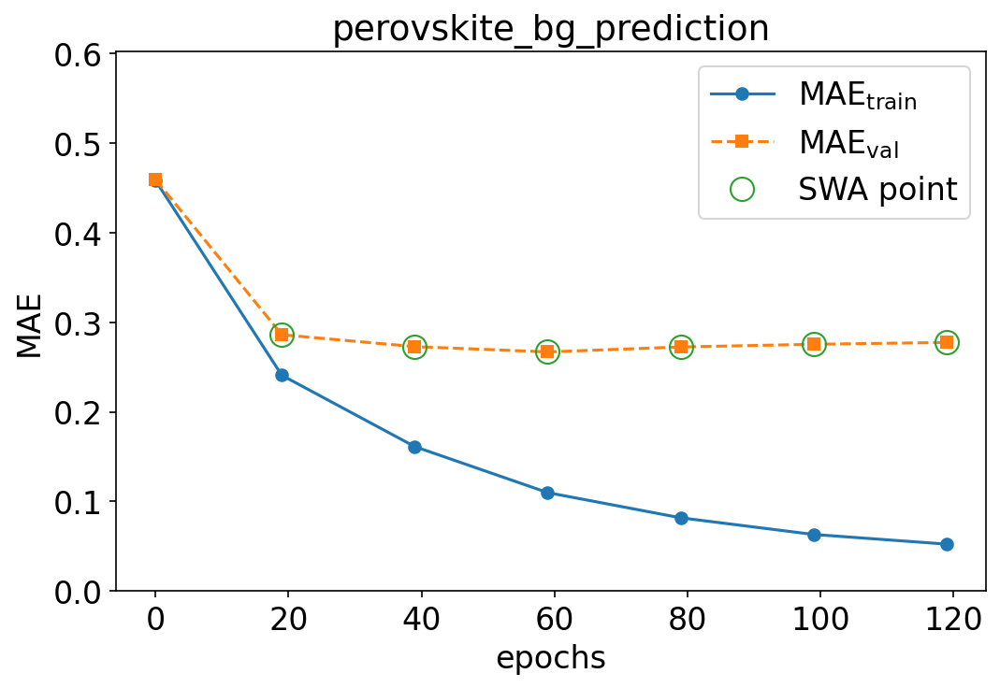

Discarded: 3/3weight updates, early-stopping now
Saving network (perovskite_bg_prediction) to models/trained_models/perovskite_bg_prediction.pth


In [6]:
crabnet_bg = CrabNet(
    mat_prop='bandgap',
    model_name='perovskite_bg_prediction',
    elem_prop='mat2vec',
    learningcurve=True,
    extend_features=feature_names,
)
crabnet_bg.fit(train_df, val_df)

---
## 5. Model Evaluation

We evaluate on the held-out test set, broken down by source to reveal
performance differences across the three data domains.

In [7]:
# --- Collect per-source test metrics ---
# Re-attach source labels to the test set
test_df_src = test_df.copy()
for formula in test_df_src['formula']:
    test_df_src.loc[test_df_src['formula'] == formula, 'source'] = (
        df.loc[df['formula'] == formula, 'source'].values[0]
    )

rows = []
for split_name, split_df in [('train', train_df), ('val', val_df), ('test', test_df)]:
    m = test_r2_score(split_df, feature_names, crabnet_bandgap=crabnet_bg, plot=False)
    rows.append({'split': split_name, 'n': len(split_df),
                 'R²': m['r2'], 'MAE (eV)': m['mae'], 'RMSE (eV)': np.sqrt(m['mse'])})

# Per-source on test set
for src in ['pvk', 'chalcogenides', 'chalc_semicon']:
    df_src = test_df_src[test_df_src['source'] == src]
    if len(df_src) == 0:
        rows.append({'split': f'test/{src}', 'n': 0, 'R²': None, 'MAE (eV)': None, 'RMSE (eV)': None})
        continue
    m = test_r2_score(df_src, feature_names, crabnet_bandgap=crabnet_bg, plot=False)
    rows.append({'split': f'test/{src}', 'n': len(df_src),
                 'R²': m['r2'], 'MAE (eV)': m['mae'], 'RMSE (eV)': np.sqrt(m['mse'])})

metrics_table = pd.DataFrame(rows)
metrics_table.style.format({'R²': '{:.3f}', 'MAE (eV)': '{:.3f}', 'RMSE (eV)': '{:.3f}'}, na_rep='—')

Generating EDM: 100%|██████████| 2902/2902 [00:00<00:00, 163113.70formulae/s]


skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 5.0), ('I', 3.0), ('N', 2.0), ('C', 1.0), ('Sn

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 208623.23formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.3928
MSE: 0.2286
MAE: 0.2669 eV


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 193337.44formulae/s]


skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 295.0), ('I', 150.0), ('N', 98.0), ('Pb', 50.0), ('C', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.4226
MSE: 0.2497
MAE: 0.2477 eV


Generating EDM: 100%|██████████| 158/158 [00:00<00:00, 142577.46formulae/s]


skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 295.0), ('I', 150.0), ('N', 98.0), ('Pb', 50.0), ('C', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.6632
MSE: 0.0309
MAE: 0.0895 eV


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9731.56formulae/s]


loading data with up to 9 elements in the formula
R2 score: nan
MSE: 0.0436
MAE: 0.2088 eV


Generating EDM: 100%|██████████| 204/204 [00:00<00:00, 255414.33formulae/s]

loading data with up to 9 elements in the formula
R2 score: 0.3157
MSE: 0.4201
MAE: 0.3705 eV


,split,n,R²,MAE (eV),RMSE (eV)
0,train,2902,0.835,0.110,0.248
1,val,363,0.393,0.267,0.478
2,test,363,0.423,0.248,0.500
3,test/pvk,158,0.663,0.090,0.176
4,test/chalcogenides,1,—,0.209,0.209
5,test/chalc_semicon,204,0.316,0.370,0.648


---
## 6. Leave-One-Out Cross-Validation — Chalcogenide Perovskites

With only **8 unique chalcogenide perovskite formulas**, a standard random
split places 0–1 compounds in the test set, making per-compound error
estimation unreliable. We therefore apply **LOOCV**: for each of the 8
formulas, we hold it out, retrain CrabNet on the remaining ~3 600 compounds
(including all halide perovskites and chalcogenide semiconductors), and
predict the held-out compound.

This provides the most honest estimate of how well the model extrapolates
to *unseen* chalcogenide perovskites — the key claim of the paper.

In [8]:
# Identify unique chalcogenide perovskite formulas in the grouped data
chalc_mask = df_grouped['source'] == 'chalcogenides'
df_chalc_grouped = df_grouped.loc[chalc_mask, ['formula', 'target']].copy()

# Remove BaTiS3 and CaZrS3 — not clearly perovskite-type structures
df_chalc_grouped = df_chalc_grouped[~df_chalc_grouped['formula'].isin(['BaTiS3', 'CaZrS3'])]

chalc_formulas = df_chalc_grouped['formula'].values
chalc_targets  = df_chalc_grouped['target'].values

# Compute experimental std dev per formula from the raw chalcogenide CSV
df_raw_chalc = pd.read_csv(RAW_DATA_DIR / 'chalcogenides_bandgap_devices.csv')
expt_stats = df_raw_chalc.groupby('reduced_formulas')['bandgap'].agg(['median', 'std', 'count'])
expt_stats['std'] = expt_stats['std'].fillna(0.0)  # single-entry formulas → std = 0

chalc_expt_std = np.array([
    expt_stats.loc[f, 'std'] if f in expt_stats.index else 0.0
    for f in chalc_formulas
])

print(f'Chalcogenide perovskite formulas for LOOCV: {len(chalc_formulas)}')
for f, t, s in zip(chalc_formulas, chalc_targets, chalc_expt_std):
    n = int(expt_stats.loc[f, 'count']) if f in expt_stats.index else 0
    print(f'  {f:30s}  Eg = {t:.2f} ± {s:.3f} eV  (n={n})')

Chalcogenide perovskite formulas for LOOCV: 9
  Ba(Zr0.95Ti0.05)S3              Eg = 1.63 ± 0.000 eV  (n=1)
  Ba(Zr0.96Ti0.04)S3              Eg = 1.51 ± 0.000 eV  (n=1)
  BaHfS3                          Eg = 2.12 ± 0.078 eV  (n=2)
  BaZr(S0.6Se0.4)3                Eg = 1.76 ± 0.000 eV  (n=1)
  BaZrS3                          Eg = 1.85 ± 0.083 eV  (n=4)
  LaScS3                          Eg = 2.90 ± 0.000 eV  (n=1)
  LaYS3                           Eg = 2.15 ± 0.212 eV  (n=2)
  SrHfS3                          Eg = 2.37 ± 0.064 eV  (n=2)
  SrZrS3                          Eg = 2.09 ± 0.064 eV  (n=2)


In [9]:
# Load raw chalcogenide data to verify formulas
raw_chalc_path = RAW_DATA_DIR / 'chalcogenides_bandgap_devices.csv'
df_raw_chalc = pd.read_csv(raw_chalc_path)
print(f'\nRaw chalcogenide data: {len(df_raw_chalc)} entries')
print(f'\nUnique formulas in raw data:')
for formula in sorted(df_raw_chalc['reduced_formulas'].unique()):
    entries = df_raw_chalc[df_raw_chalc['reduced_formulas'] == formula]
    print(f'  {formula:30s}  n={len(entries):2d}  Eg range: {entries["bandgap"].min():.2f}–{entries["bandgap"].max():.2f} eV')
    
print(f'\nFormulas in grouped data (source="chalcogenides"):')
for formula in sorted(chalc_formulas):
    print(f'  {formula}')


Raw chalcogenide data: 18 entries

Unique formulas in raw data:
  Ba(Zr0.95Ti0.05)S3              n= 1  Eg range: 1.63–1.63 eV
  Ba(Zr0.96Ti0.04)S3              n= 1  Eg range: 1.51–1.51 eV
  BaHfS3                          n= 2  Eg range: 2.06–2.17 eV
  BaTiS3                          n= 1  Eg range: 1.30–1.30 eV
  BaZr(S0.6Se0.4)3                n= 1  Eg range: 1.76–1.76 eV
  BaZrS3                          n= 4  Eg range: 1.75–1.94 eV
  CaZrS3                          n= 1  Eg range: 1.90–1.90 eV
  LaScS3                          n= 1  Eg range: 2.90–2.90 eV
  LaYS3                           n= 2  Eg range: 2.00–2.30 eV
  SrHfS3                          n= 2  Eg range: 2.32–2.41 eV
  SrZrS3                          n= 2  Eg range: 2.05–2.14 eV

Formulas in grouped data (source="chalcogenides"):
  Ba(Zr0.95Ti0.05)S3
  Ba(Zr0.96Ti0.04)S3
  BaHfS3
  BaZr(S0.6Se0.4)3
  BaZrS3
  LaScS3
  LaYS3
  SrHfS3
  SrZrS3



--- LOOCV fold 1/9: holding out Ba(Zr0.95Ti0.05)S3 ---

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM:   0%|          | 0/2901 [00:00<?, ?formulae/s]

skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 172358.89formulae/s]


loading data with up to 9 elements in the formula
training with batchsize 256 (2**8.000)


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 210294.52formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.462 val mae: 0.463


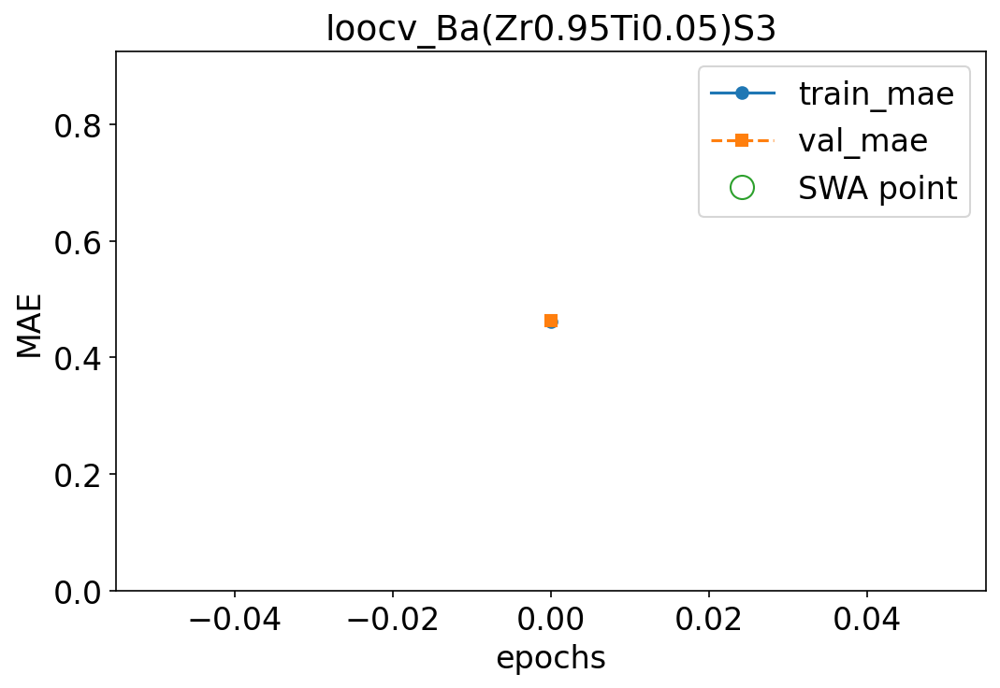

Epoch: 19/300 --- train mae: 0.247 val mae: 0.285


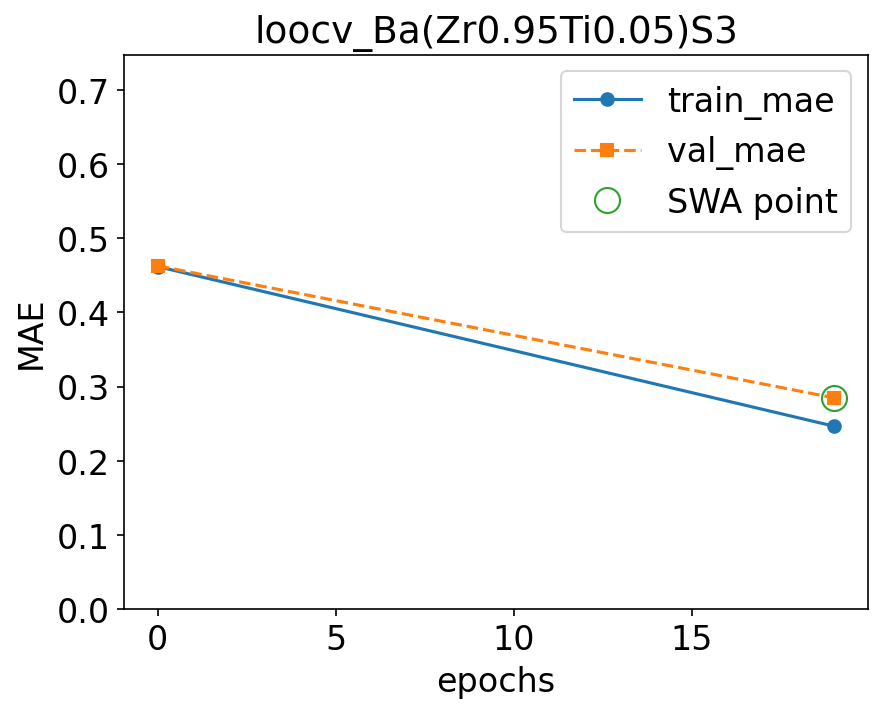

Epoch: 39/300 --- train mae: 0.162 val mae: 0.274


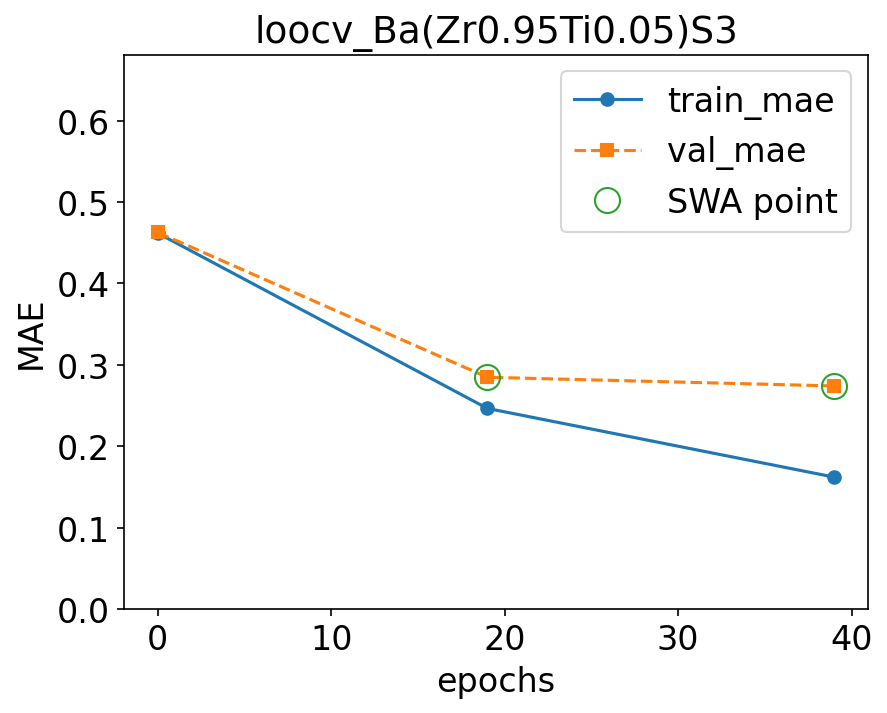

Epoch: 59/300 --- train mae: 0.111 val mae: 0.264


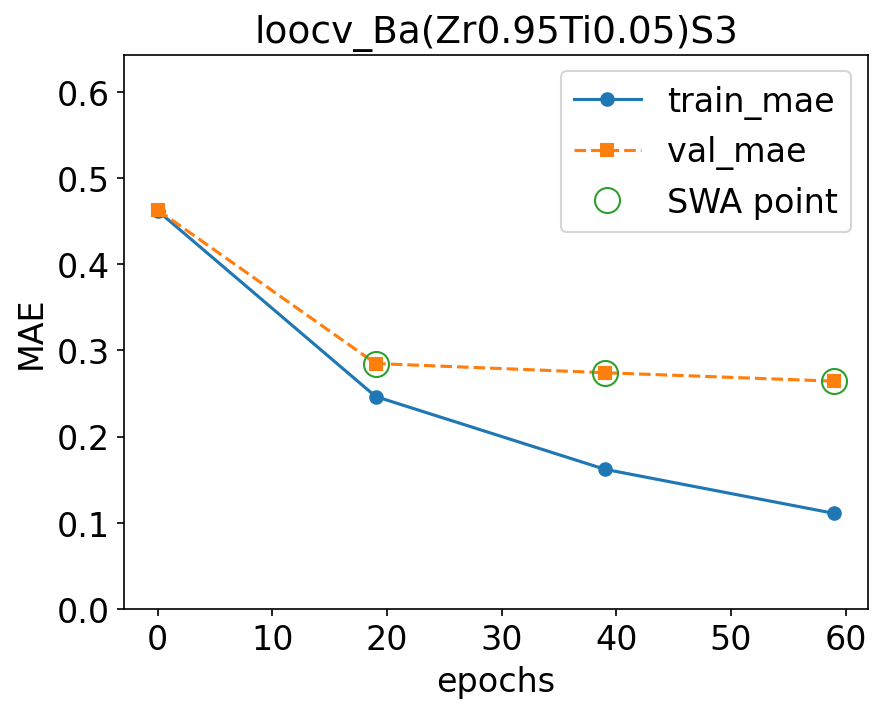

Epoch: 79/300 --- train mae: 0.0802 val mae: 0.267


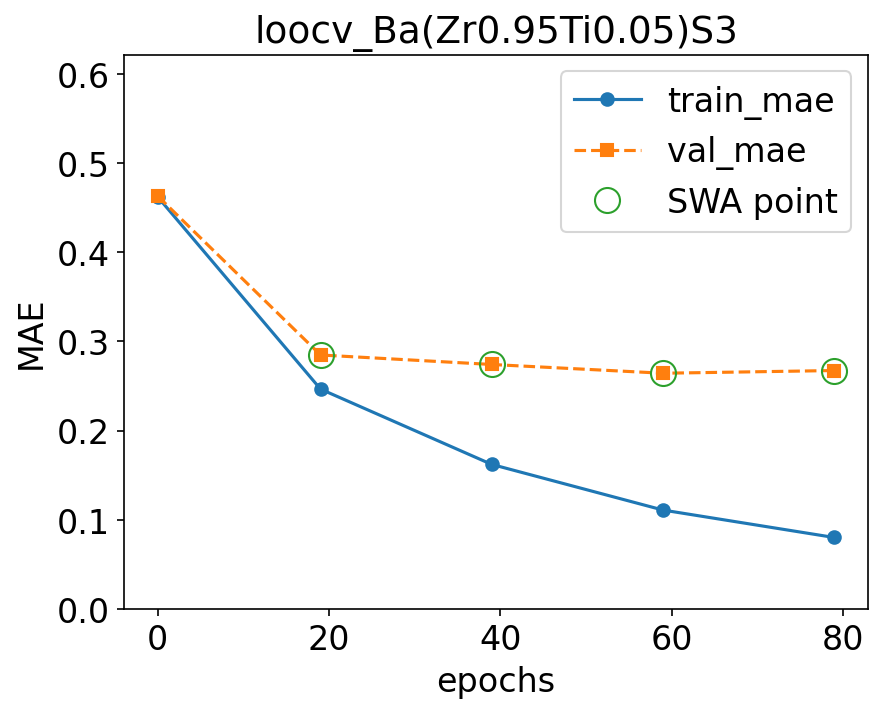

Epoch: 99/300 --- train mae: 0.0613 val mae: 0.26


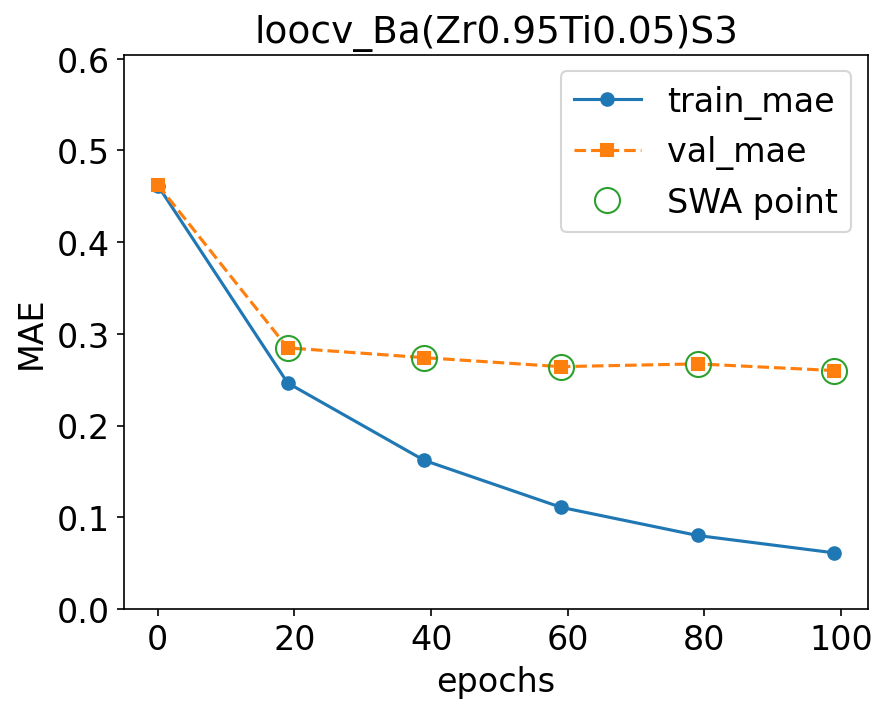

Epoch: 119/300 --- train mae: 0.0487 val mae: 0.259


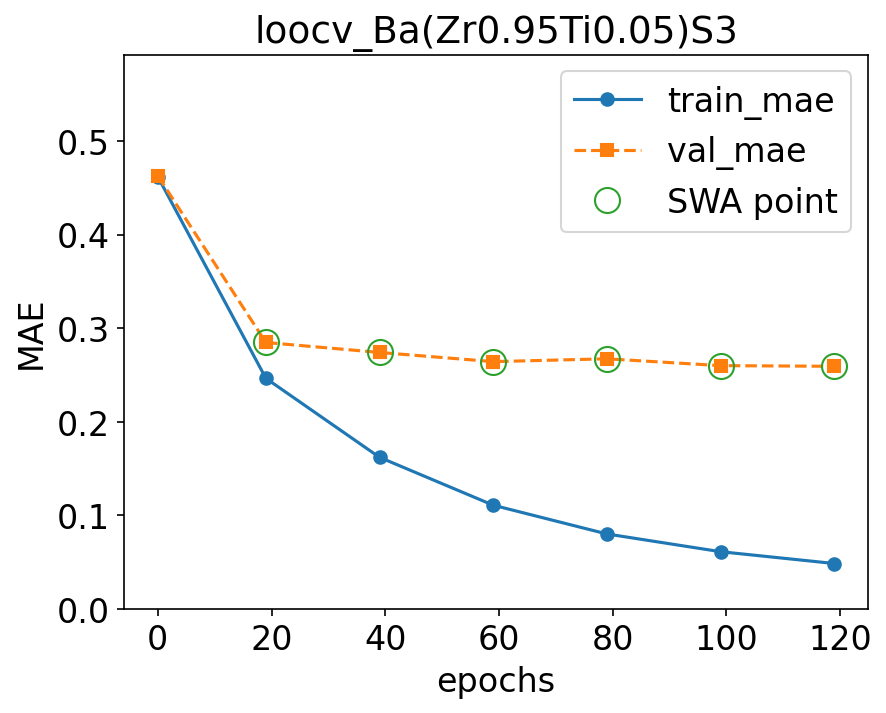

Epoch: 139/300 --- train mae: 0.041 val mae: 0.261


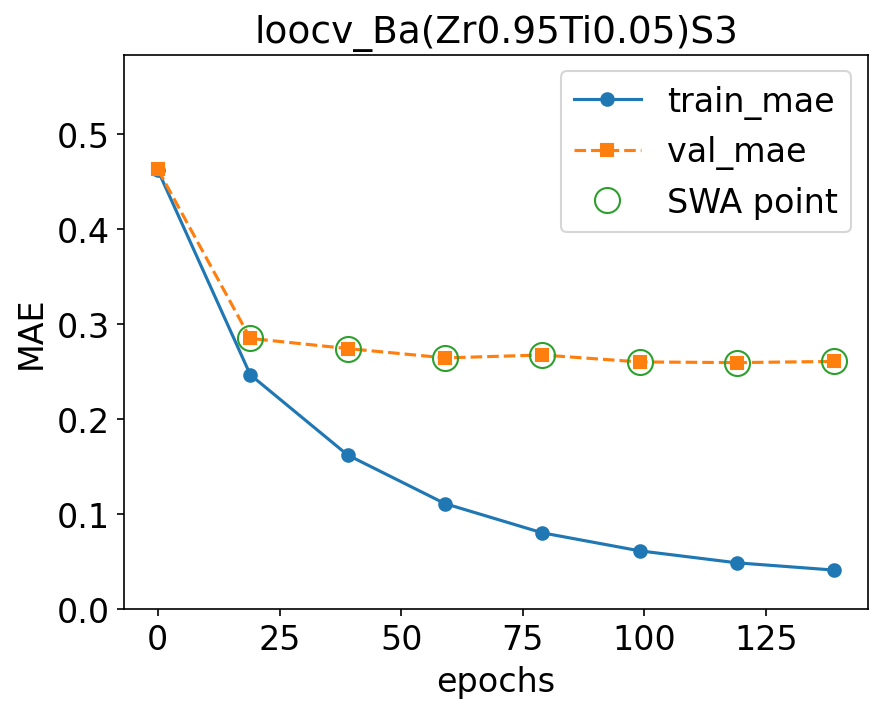

Epoch 159 failed to improve.
Discarded: 1/3 weight updates
Epoch: 159/300 --- train mae: 0.0368 val mae: 0.265


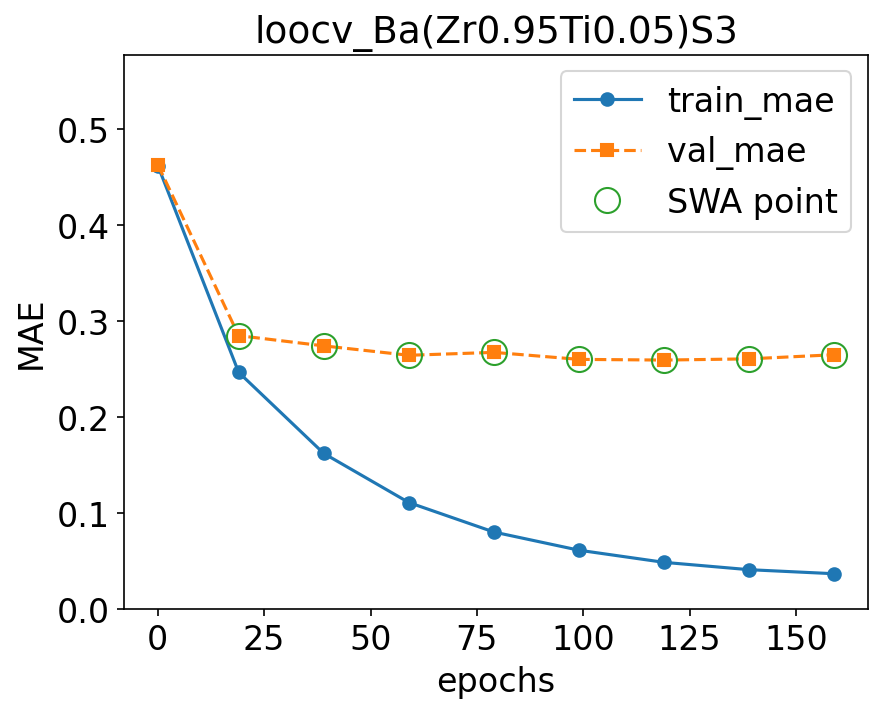

Epoch: 179/300 --- train mae: 0.0338 val mae: 0.26


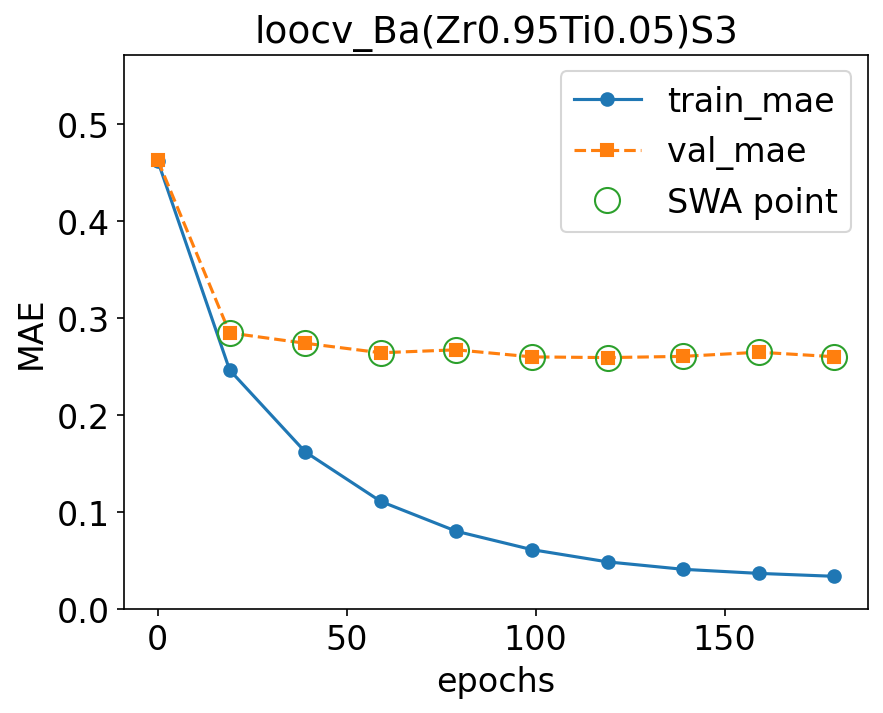

Epoch 199 failed to improve.
Discarded: 2/3 weight updates
Epoch: 199/300 --- train mae: 0.0309 val mae: 0.266


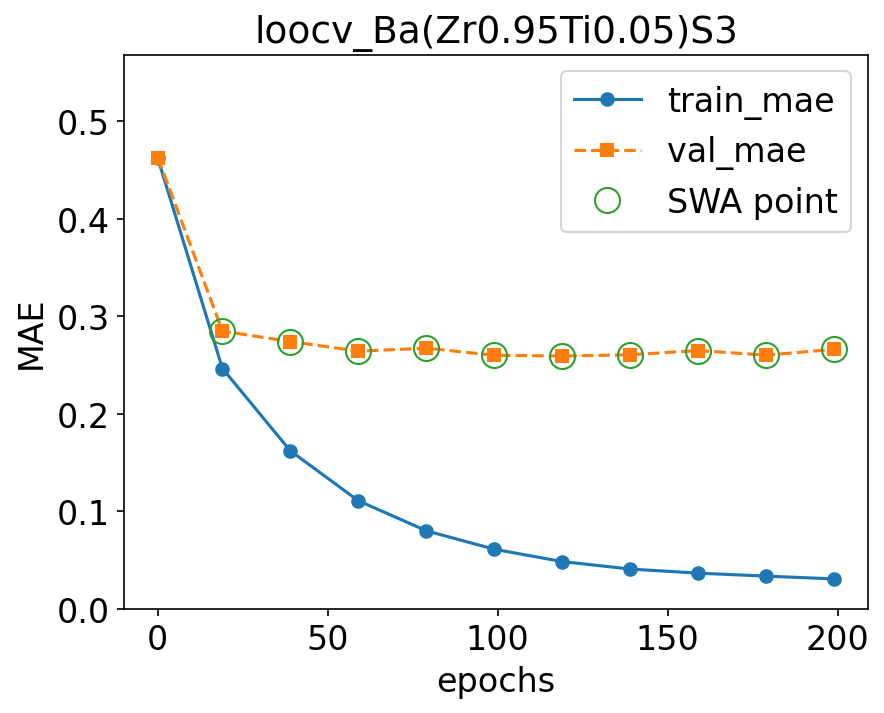

Epoch: 219/300 --- train mae: 0.0296 val mae: 0.259


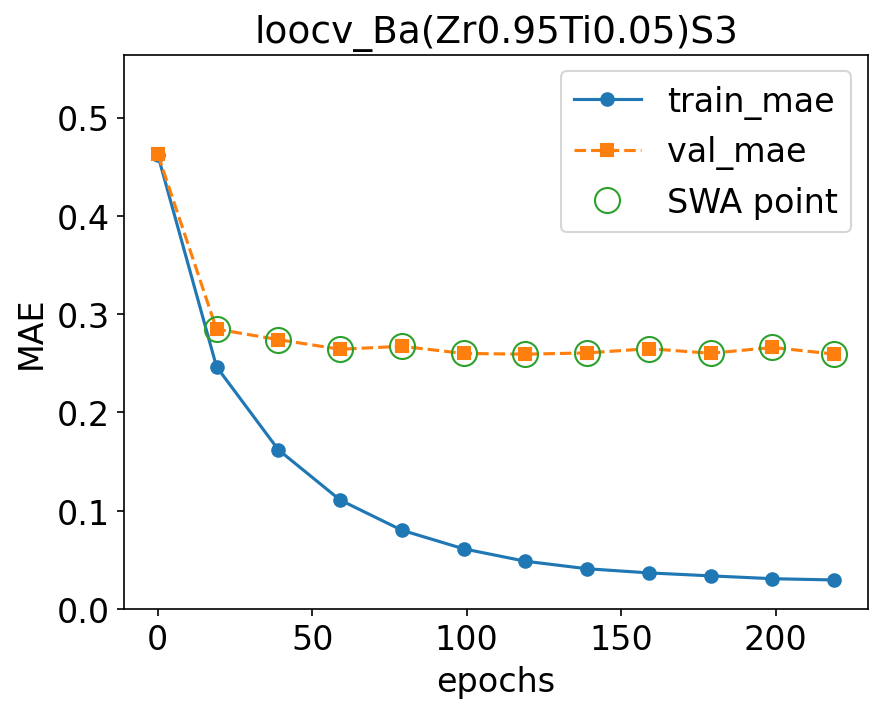

Epoch 239 failed to improve.
Discarded: 3/3 weight updates
Epoch: 239/300 --- train mae: 0.0282 val mae: 0.265


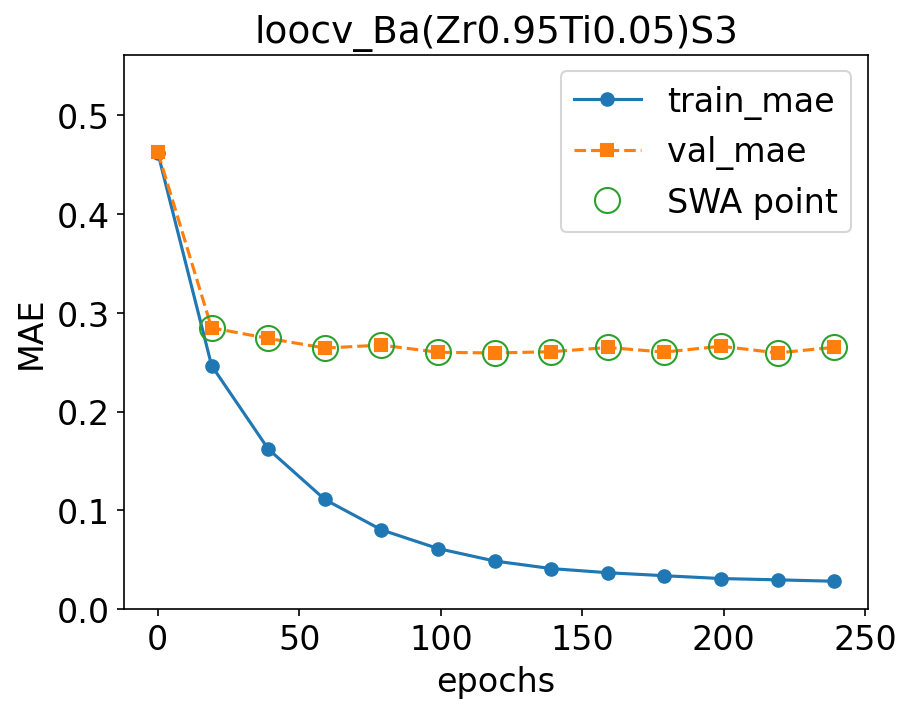

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_Ba(Zr0.95Ti0.05)S3) to models/trained_models/loocv_Ba(Zr0.95Ti0.05)S3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9404.27formulae/s]

loading data with up to 9 elements in the formula
  Actual: 1.63 eV  |  Predicted: 1.66 ± 0.06 eV  |  Residual: +0.03 eV

--- LOOCV fold 2/9: holding out Ba(Zr0.96Ti0.04)S3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 137802.40formulae/s]


skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 144329.54formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.457 val mae: 0.456


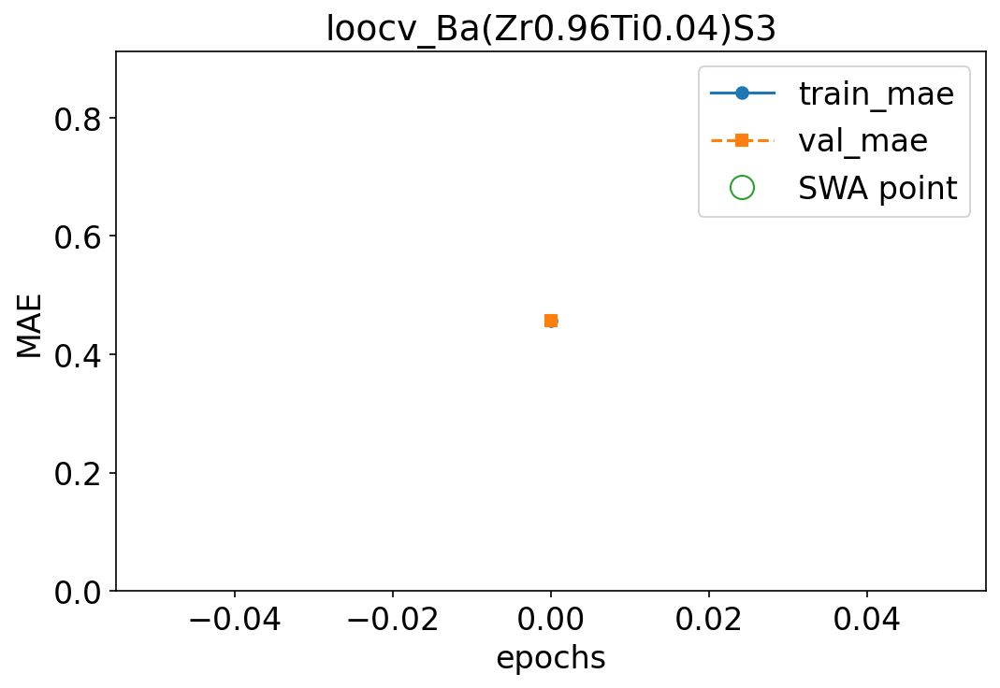

Epoch: 19/300 --- train mae: 0.246 val mae: 0.294


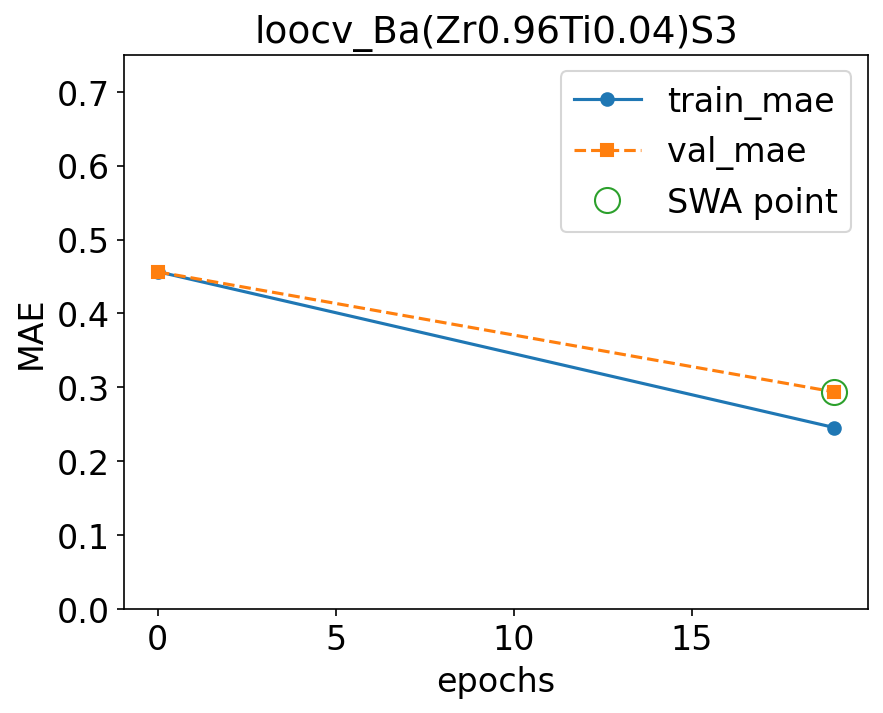

Epoch: 39/300 --- train mae: 0.167 val mae: 0.282


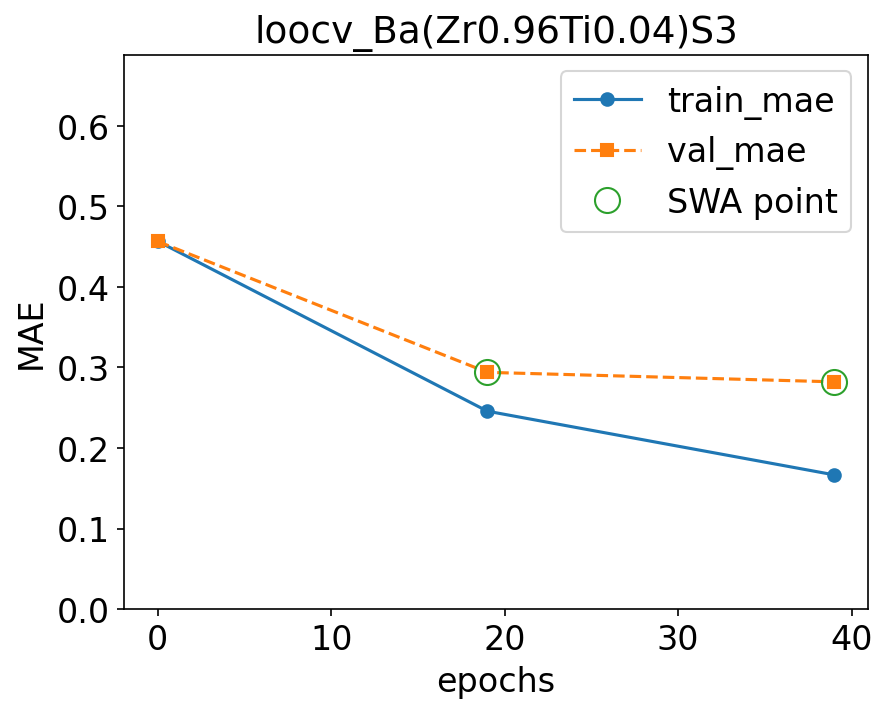

Epoch: 59/300 --- train mae: 0.112 val mae: 0.278


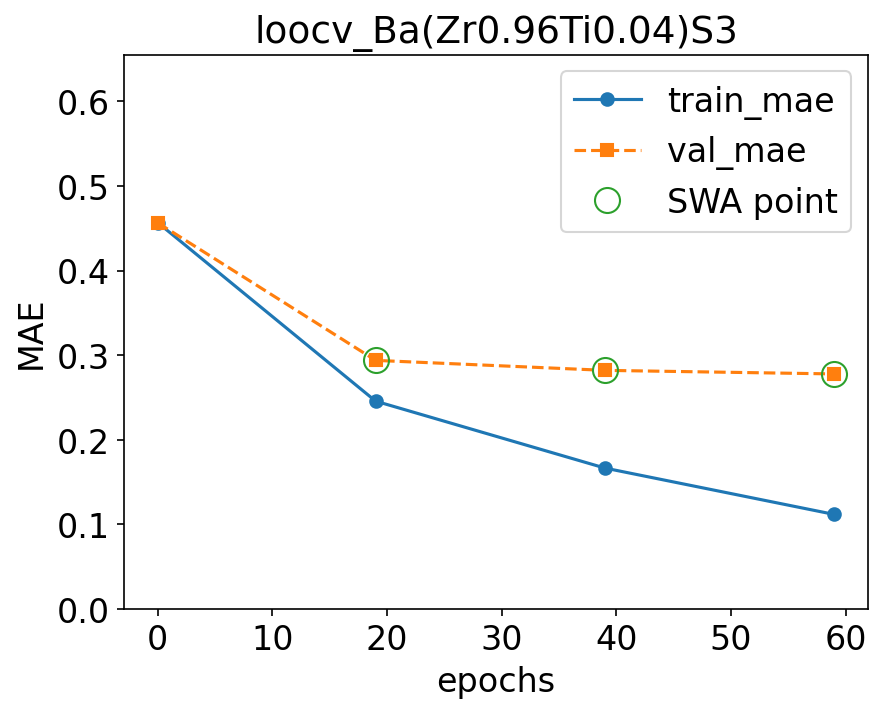

Epoch: 79/300 --- train mae: 0.0799 val mae: 0.272


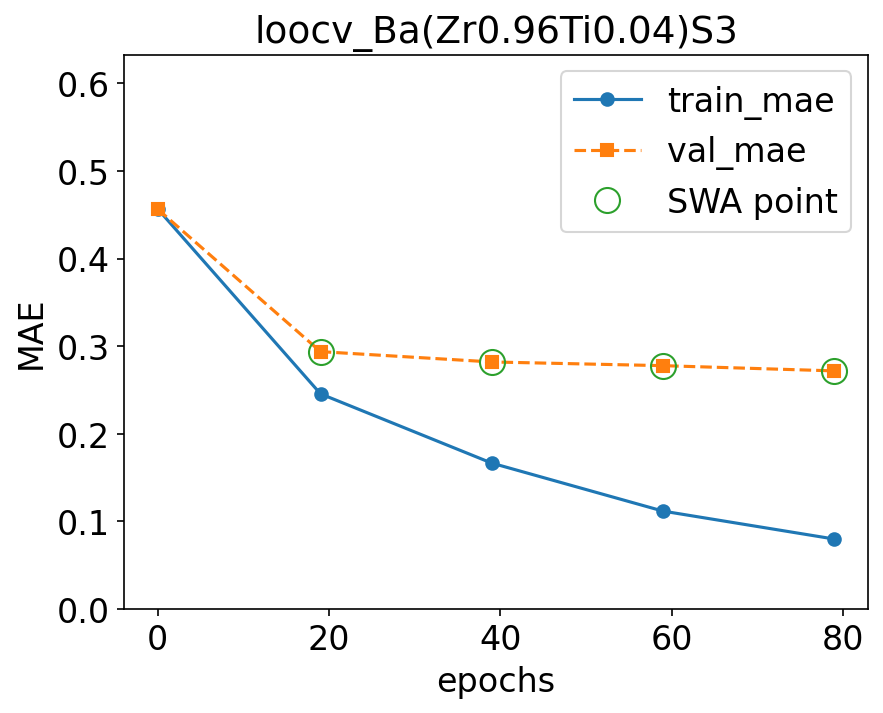

Epoch: 99/300 --- train mae: 0.0612 val mae: 0.268


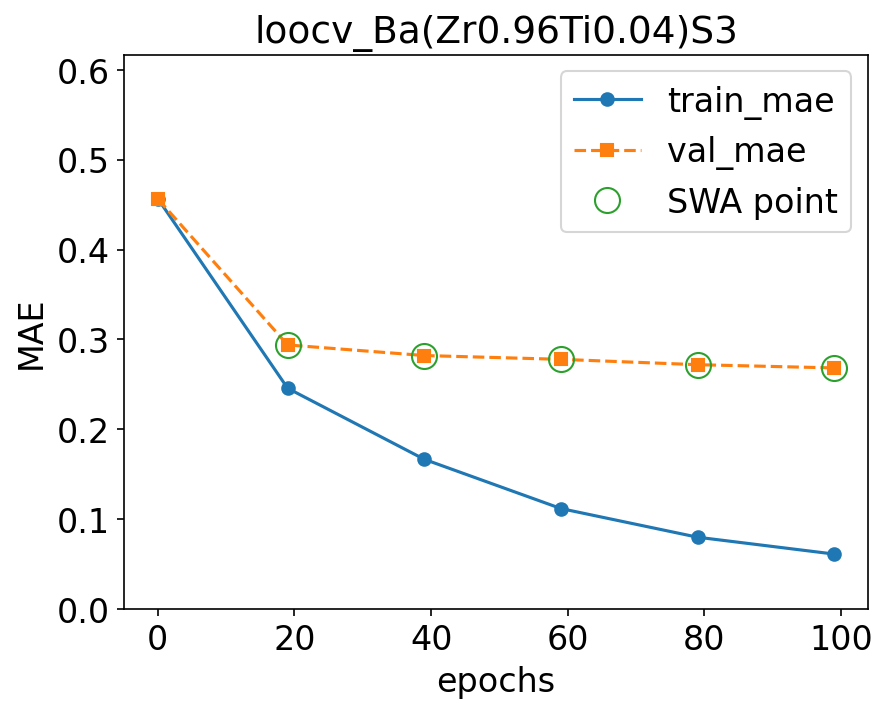

Epoch: 119/300 --- train mae: 0.0508 val mae: 0.268


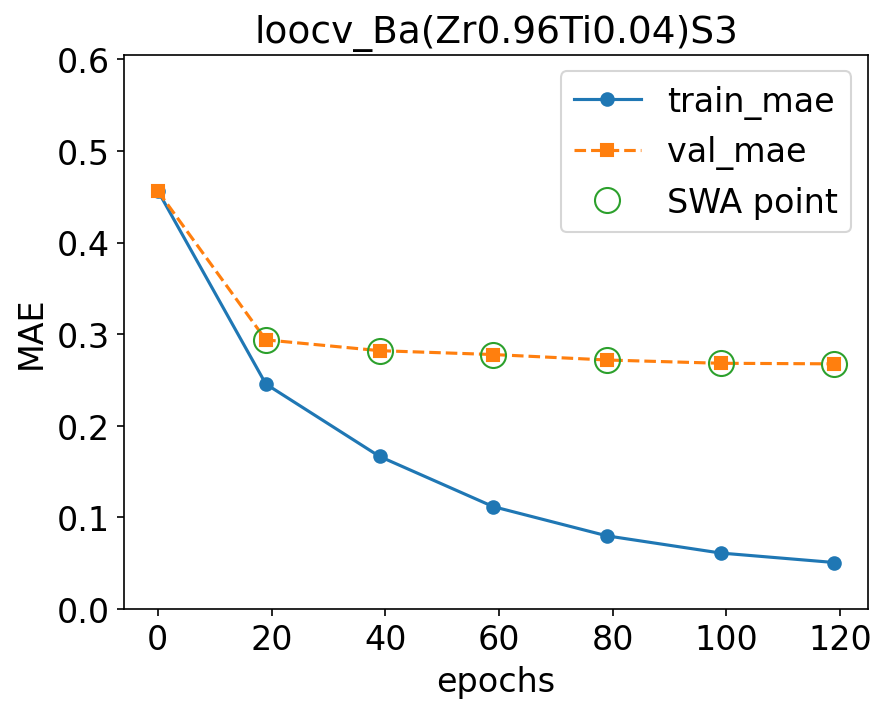

Epoch: 139/300 --- train mae: 0.0417 val mae: 0.266


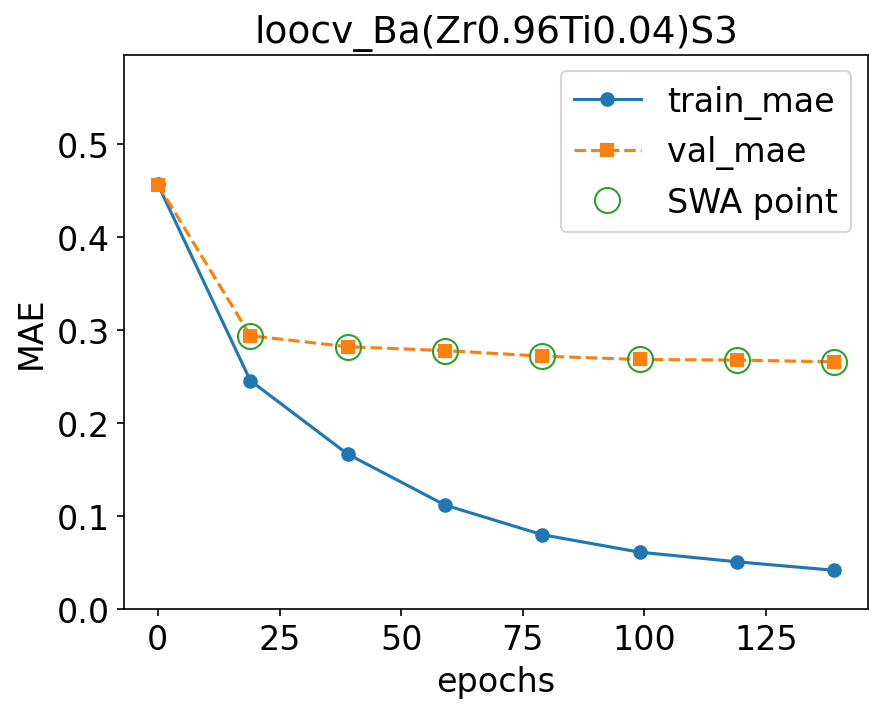

Epoch: 159/300 --- train mae: 0.0371 val mae: 0.264


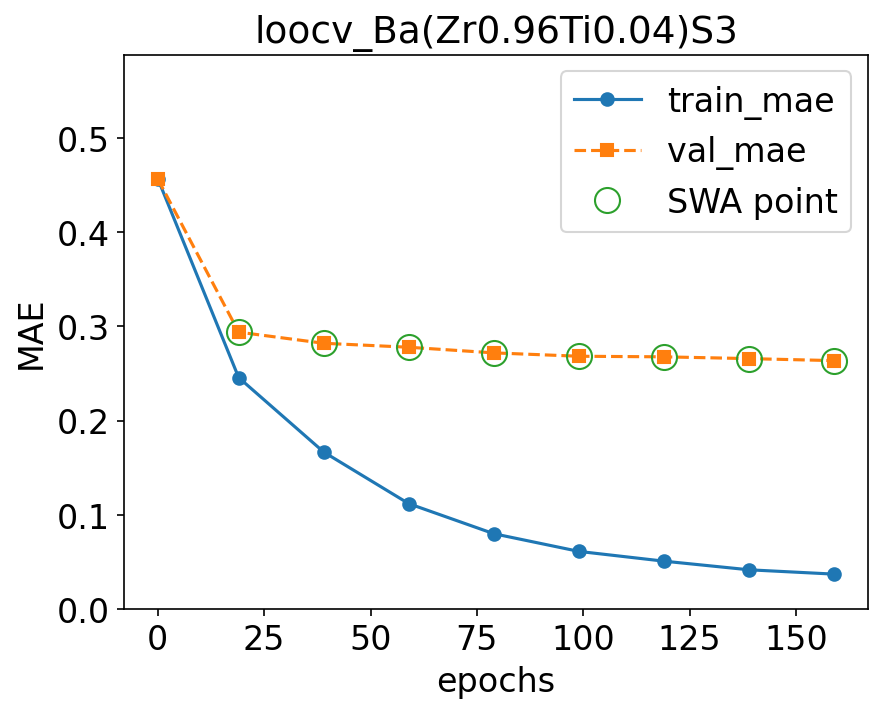

Epoch: 179/300 --- train mae: 0.0328 val mae: 0.266


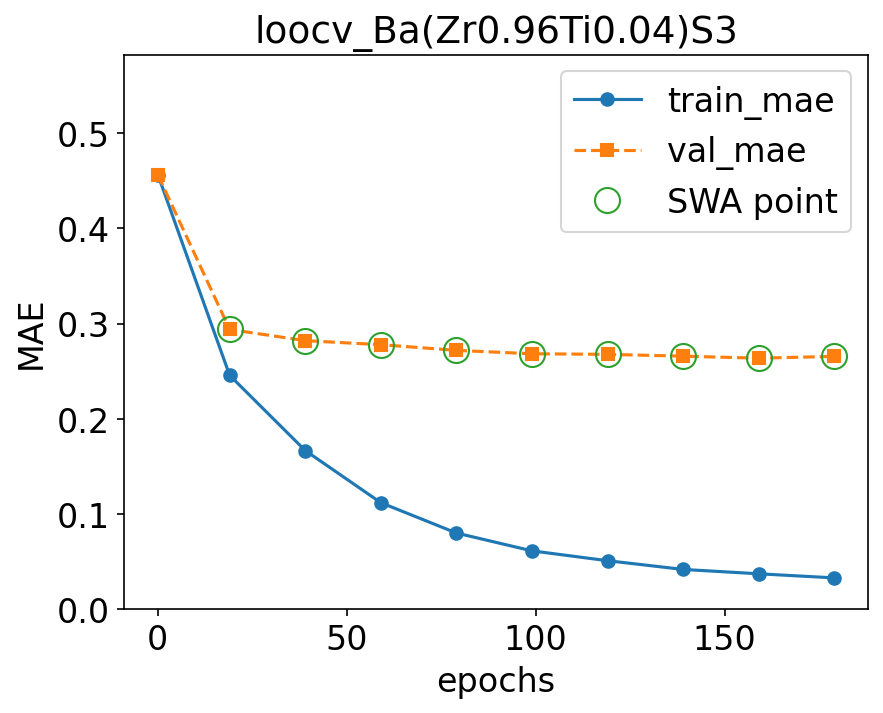

Epoch 199 failed to improve.
Discarded: 1/3 weight updates
Epoch: 199/300 --- train mae: 0.0308 val mae: 0.271


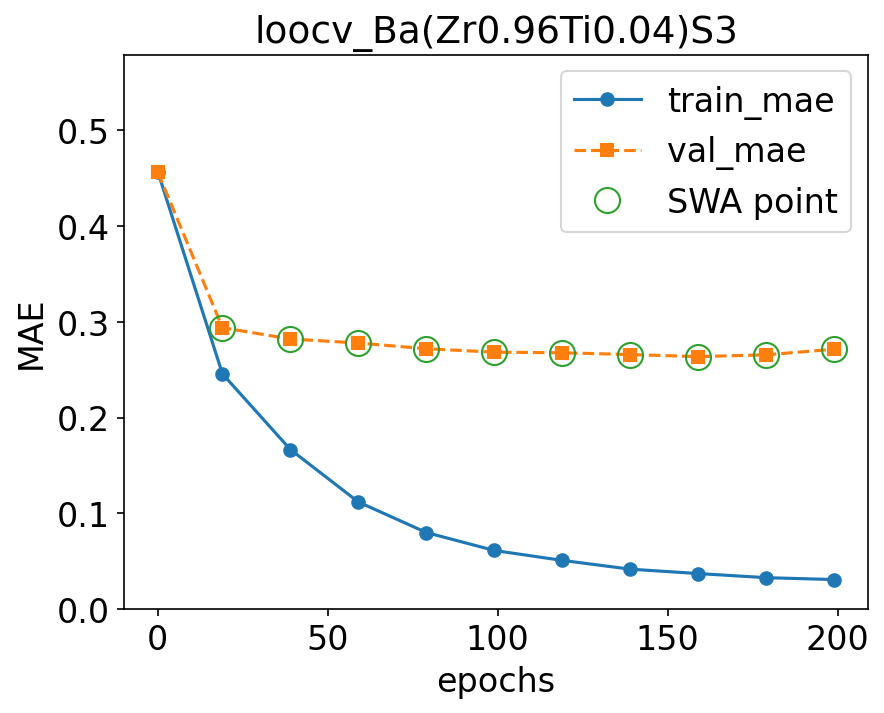

Epoch: 219/300 --- train mae: 0.0284 val mae: 0.265


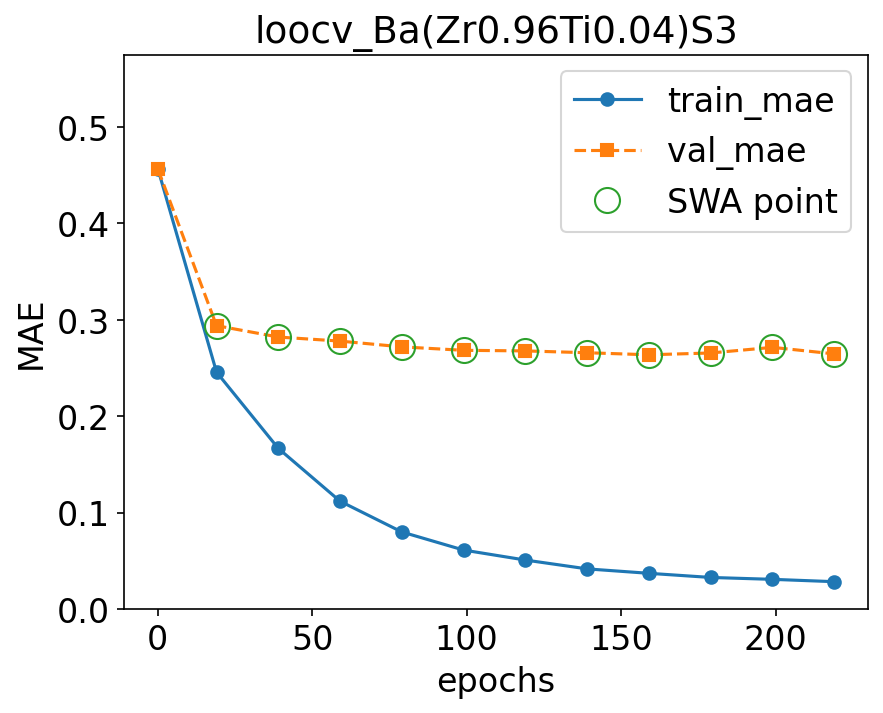

Epoch: 239/300 --- train mae: 0.0272 val mae: 0.264


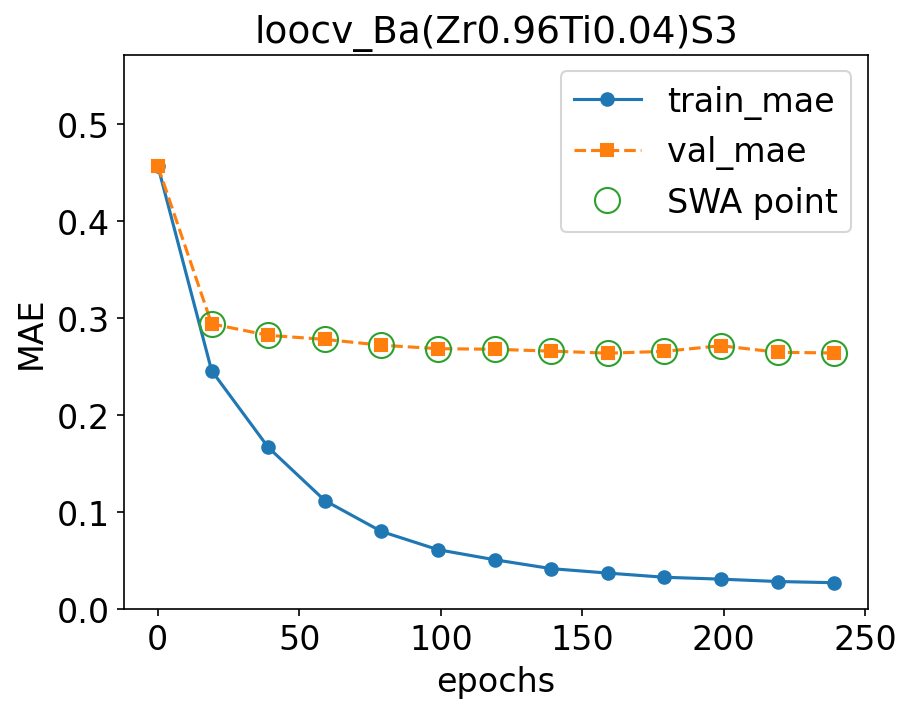

Epoch: 259/300 --- train mae: 0.0268 val mae: 0.265


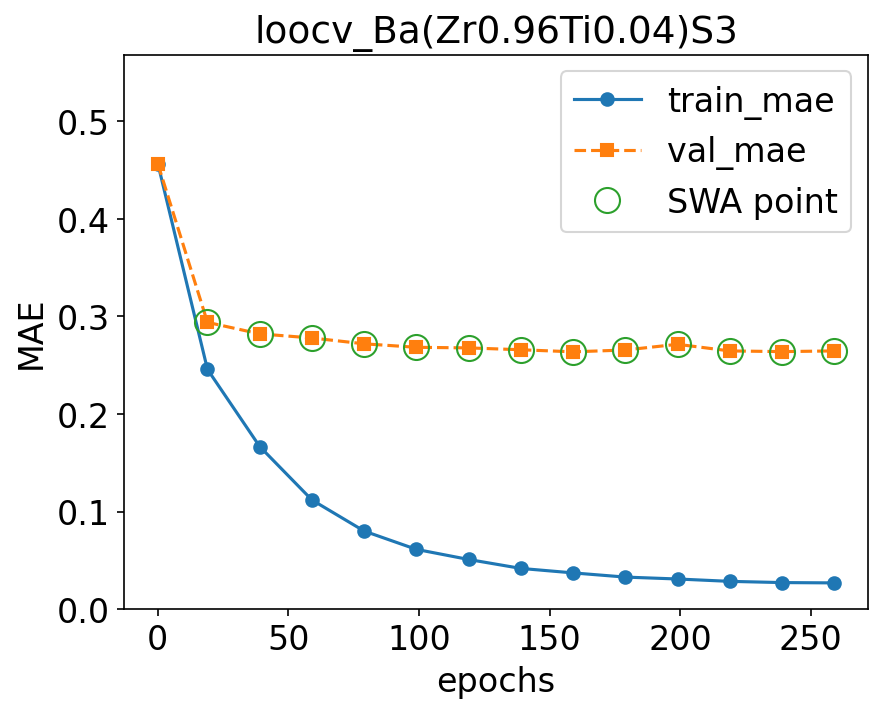

Epoch 279 failed to improve.
Discarded: 2/3 weight updates
Epoch: 279/300 --- train mae: 0.0259 val mae: 0.272


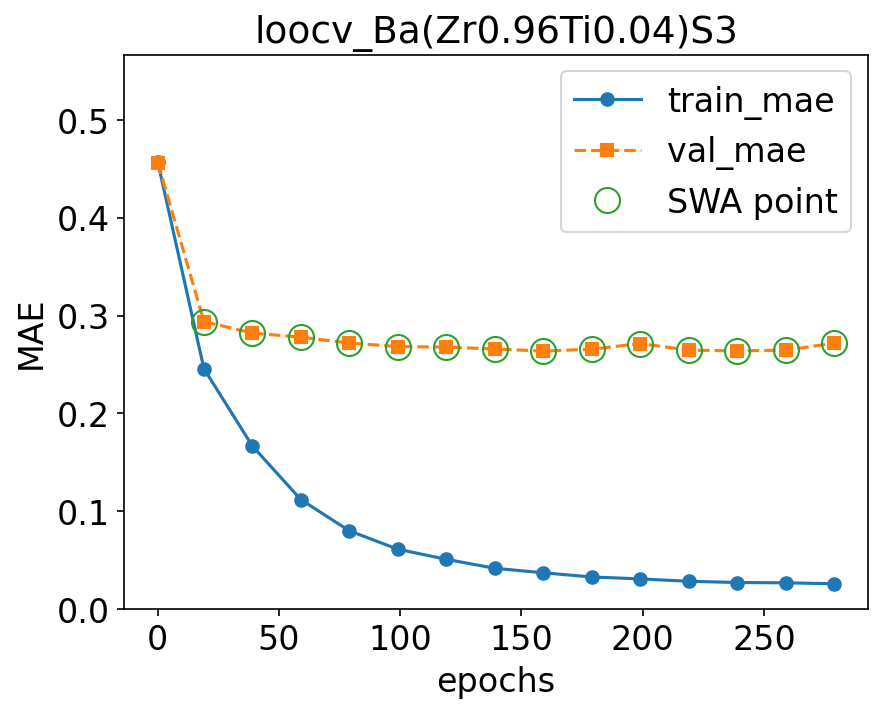

Epoch 299 failed to improve.
Discarded: 3/3 weight updates
Epoch: 299/300 --- train mae: 0.0246 val mae: 0.272


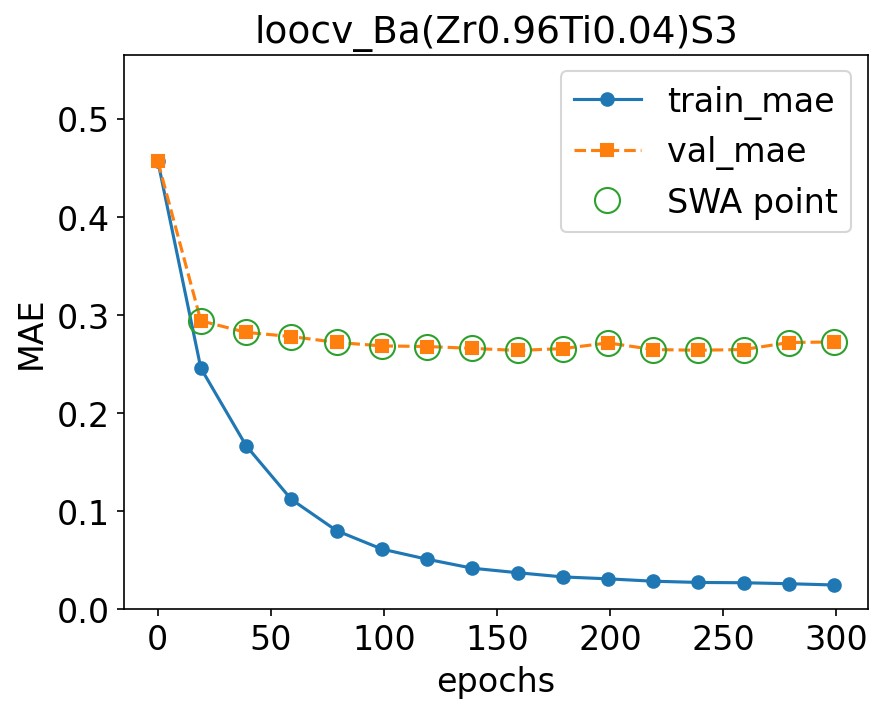

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_Ba(Zr0.96Ti0.04)S3) to models/trained_models/loocv_Ba(Zr0.96Ti0.04)S3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8128.50formulae/s]

loading data with up to 9 elements in the formula
  Actual: 1.51 eV  |  Predicted: 1.66 ± 0.02 eV  |  Residual: +0.15 eV

--- LOOCV fold 3/9: holding out BaHfS3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 104949.85formulae/s]

skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

loading data with up to 9 elements in the formula
training with batchsize 256 (2**8.000)


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 99870.93formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.461 val mae: 0.463


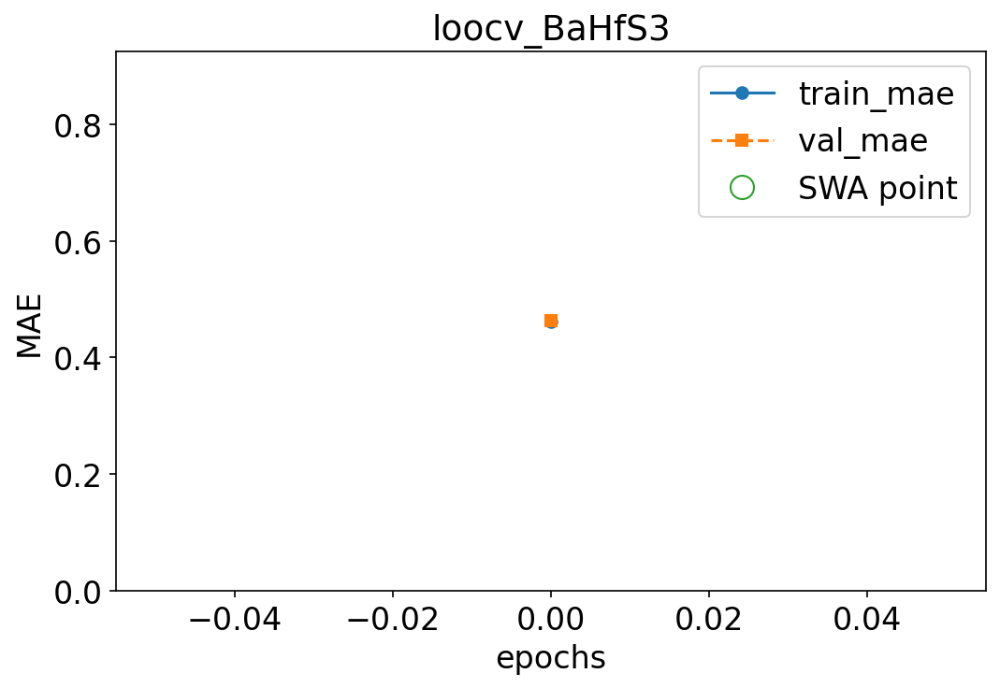

Epoch: 19/300 --- train mae: 0.238 val mae: 0.3


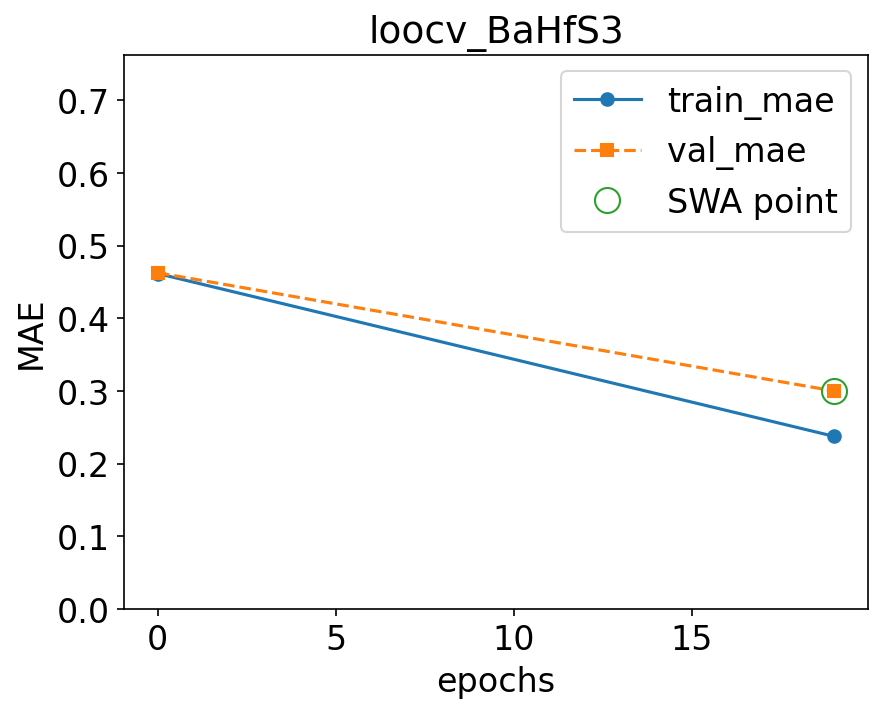

Epoch: 39/300 --- train mae: 0.15 val mae: 0.275


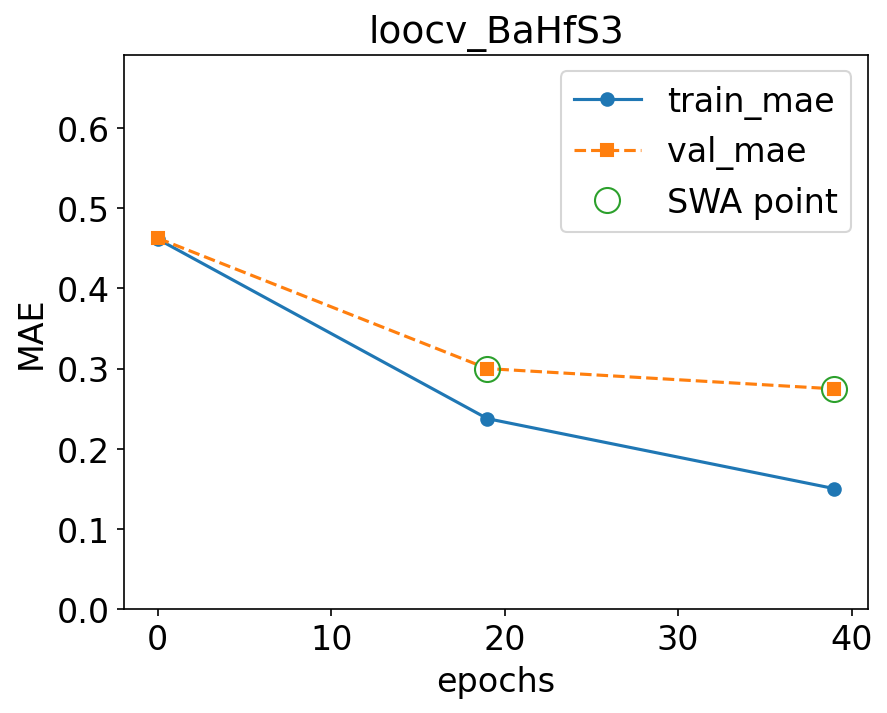

Epoch: 59/300 --- train mae: 0.105 val mae: 0.272


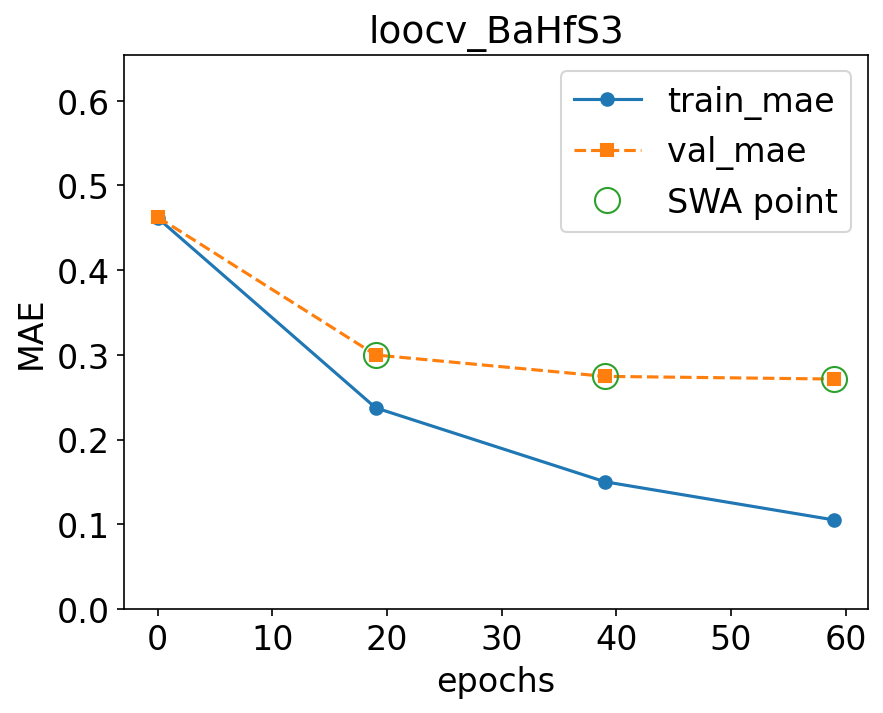

Epoch: 79/300 --- train mae: 0.0771 val mae: 0.273


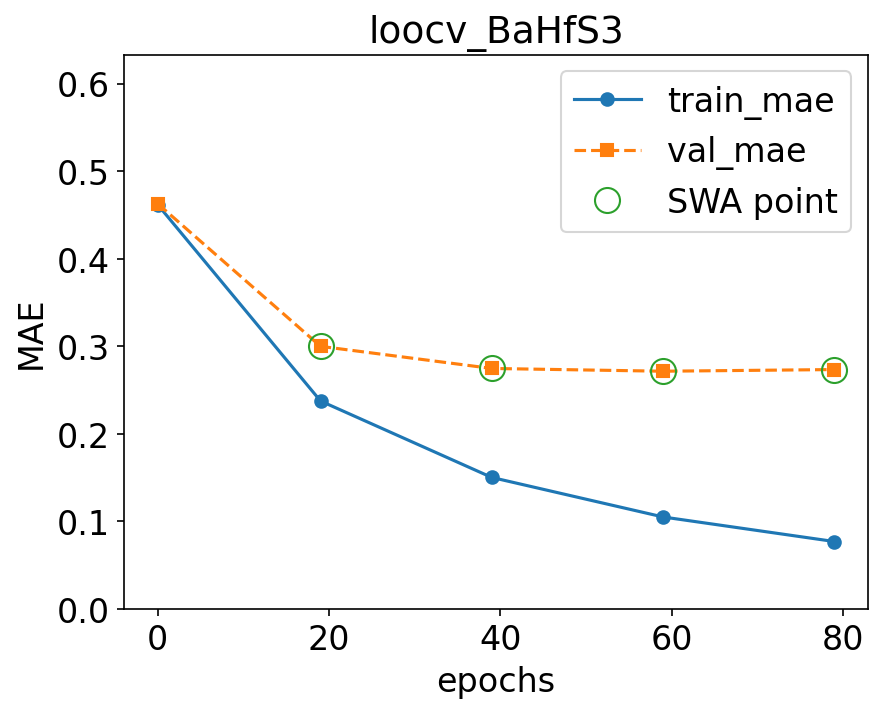

Epoch: 99/300 --- train mae: 0.0594 val mae: 0.266


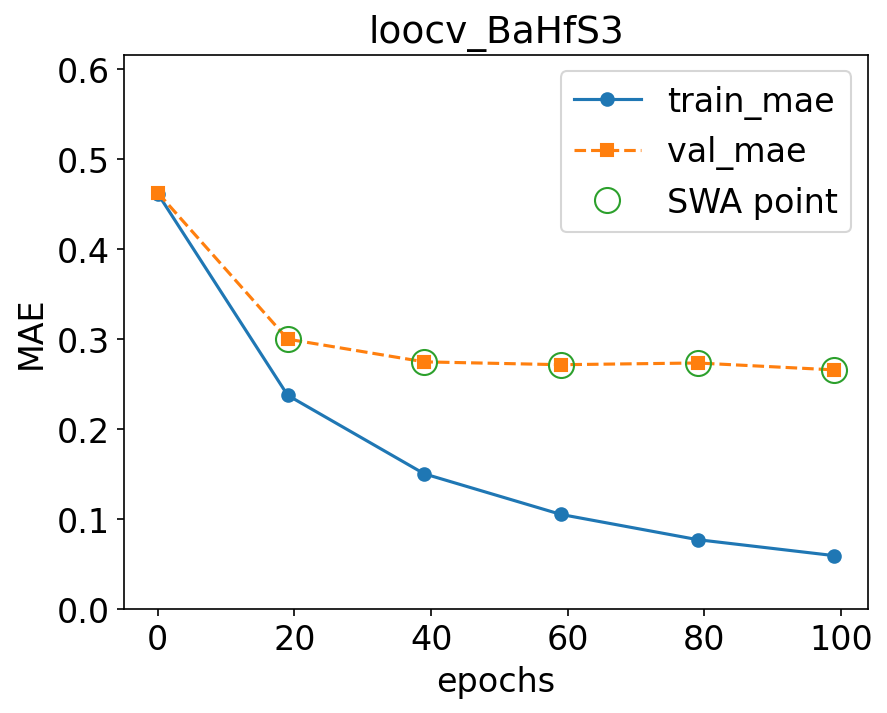

Epoch: 119/300 --- train mae: 0.0507 val mae: 0.268


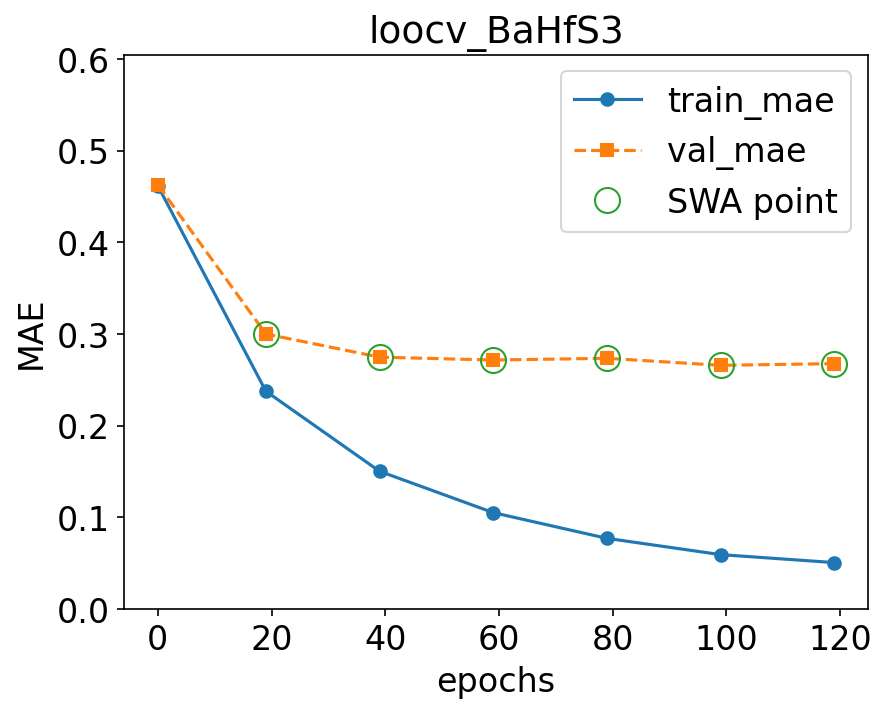

Epoch: 139/300 --- train mae: 0.0423 val mae: 0.266


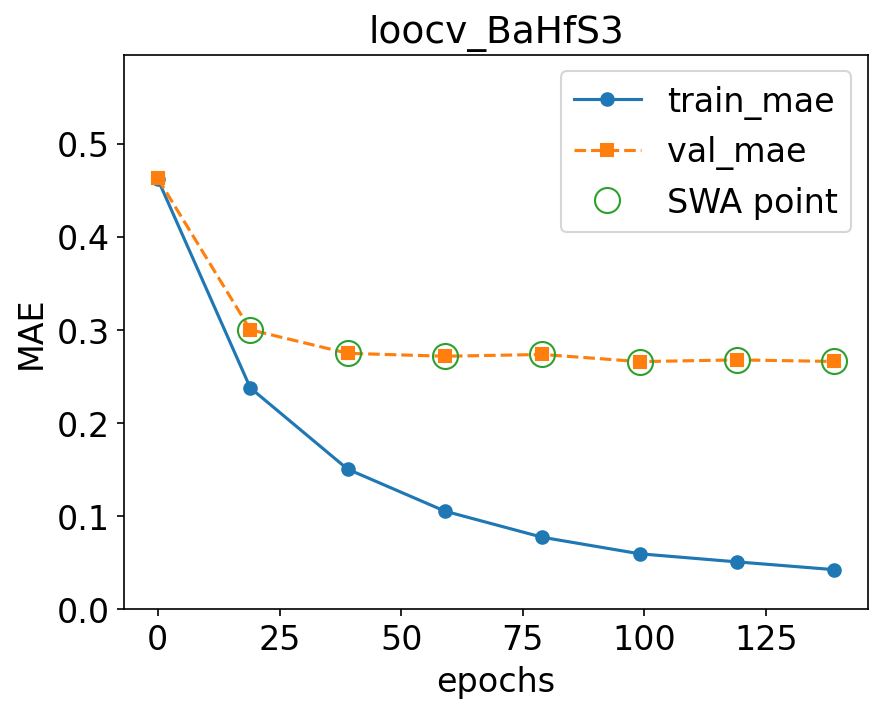

Epoch 159 failed to improve.
Discarded: 1/3 weight updates
Epoch: 159/300 --- train mae: 0.0373 val mae: 0.27


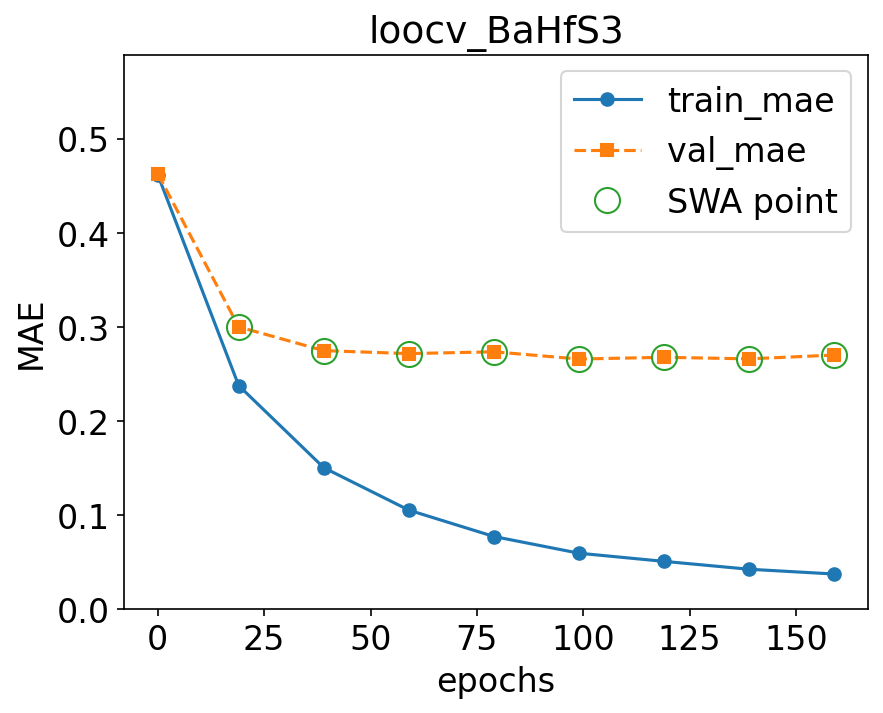

Epoch 179 failed to improve.
Discarded: 2/3 weight updates
Epoch: 179/300 --- train mae: 0.0343 val mae: 0.27


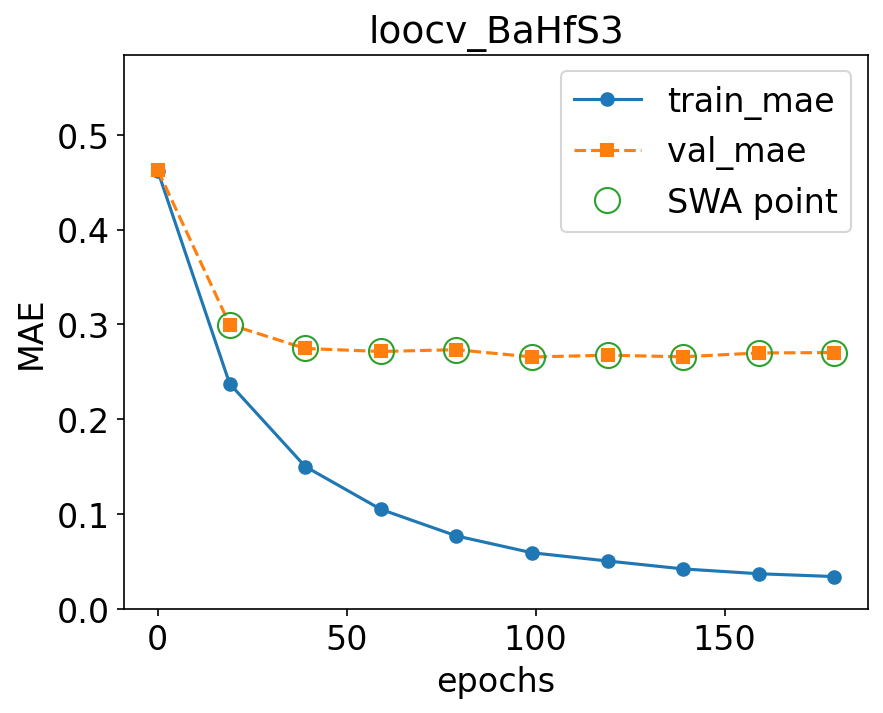

Epoch 199 failed to improve.
Discarded: 3/3 weight updates
Epoch: 199/300 --- train mae: 0.0308 val mae: 0.27


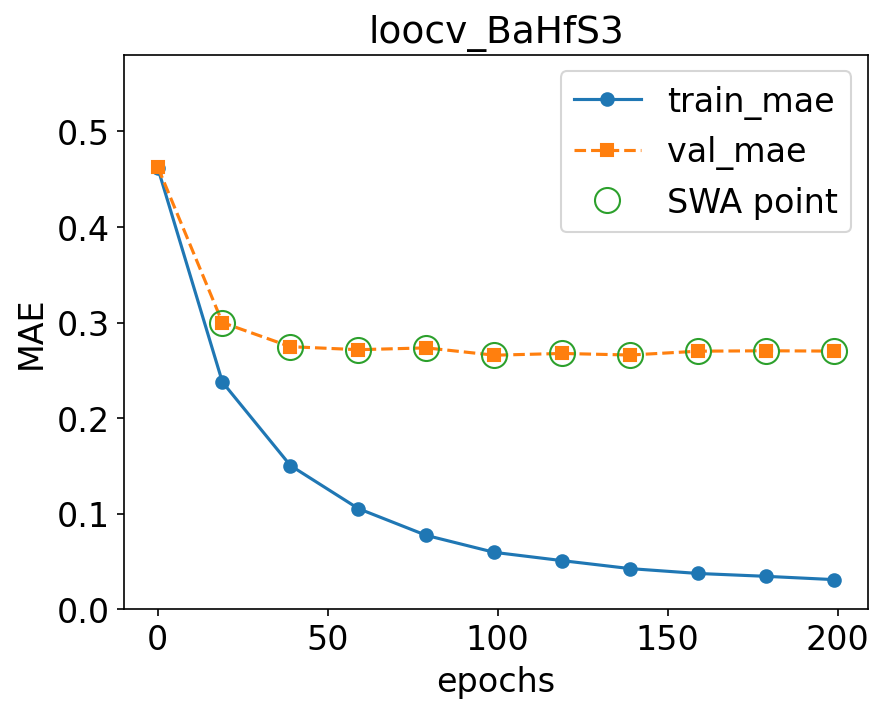

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_BaHfS3) to models/trained_models/loocv_BaHfS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7639.90formulae/s]

loading data with up to 9 elements in the formula
  Actual: 2.12 eV  |  Predicted: 1.67 ± 0.05 eV  |  Residual: -0.45 eV

--- LOOCV fold 4/9: holding out BaZr(S0.6Se0.4)3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM:   0%|          | 0/2901 [00:00<?, ?formulae/s]

skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])


Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 89873.30formulae/s]


skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 5.0), ('I', 3.0), ('N', 2.0), ('C', 1.0), ('Sn', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1054.0), ('I', 600.0), ('N', 391.0), ('C', 230.0), ('Pb', 200.0), ('Cs', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 38.0), ('I', 15.0), ('C', 9.0), ('N', 5.0), ('Pb', 5.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 344.0), ('I', 150.0), ('B', 50.0), ('Pb', 50.0), ('C', 49.0), ('N', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 6.0), ('I', 3.0), ('P', 2.0), ('C', 1.0), ('N', 1.0), ('Pb', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
training with batchsize 256 (2**8.000)


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 32238.60formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.462 val mae: 0.463


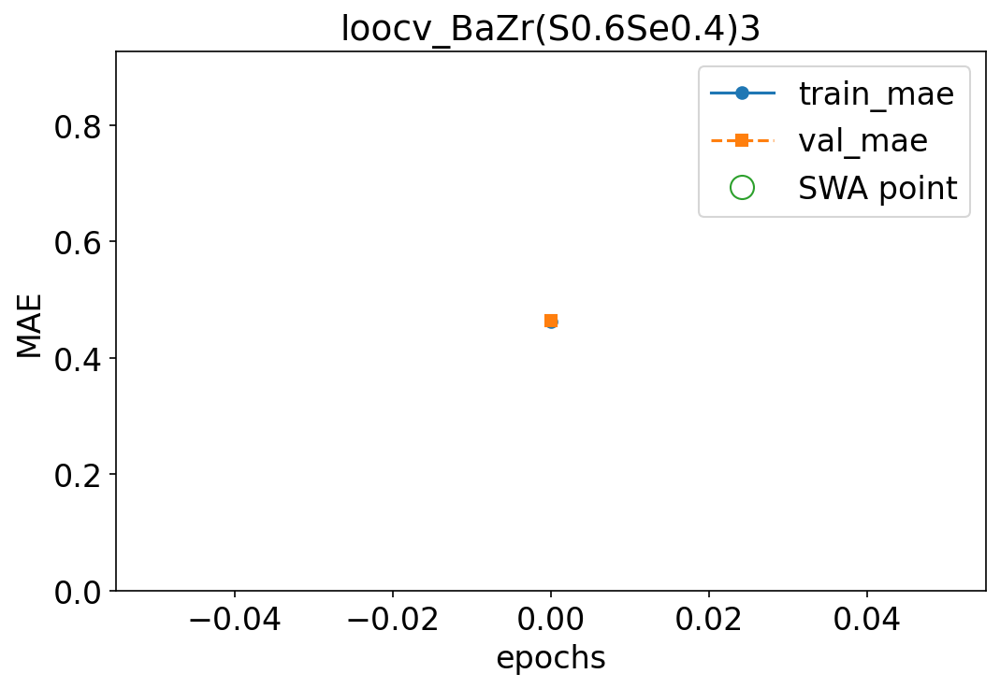

Epoch: 19/300 --- train mae: 0.246 val mae: 0.286


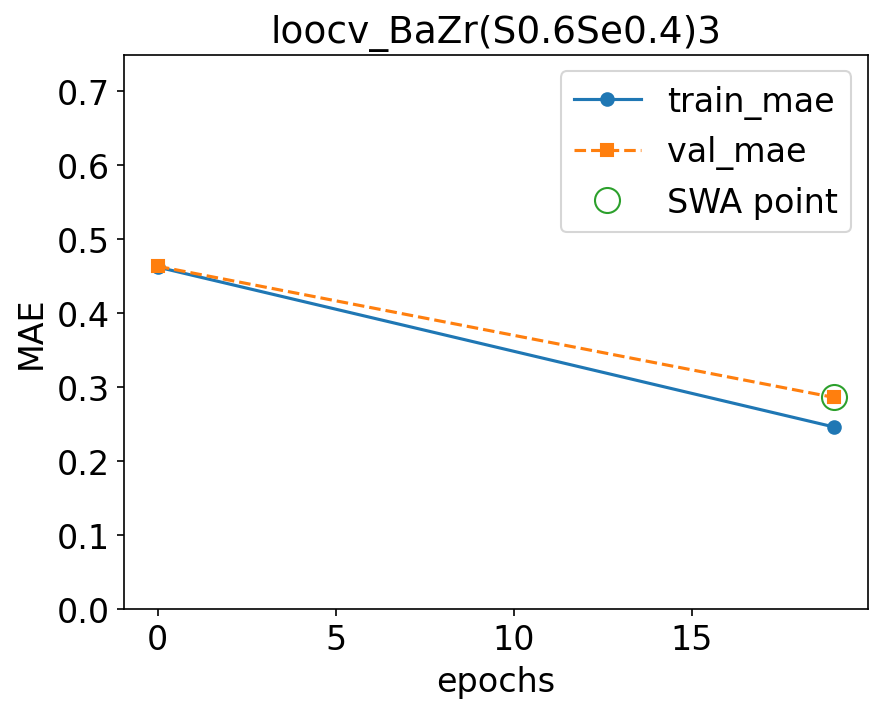

Epoch: 39/300 --- train mae: 0.162 val mae: 0.276


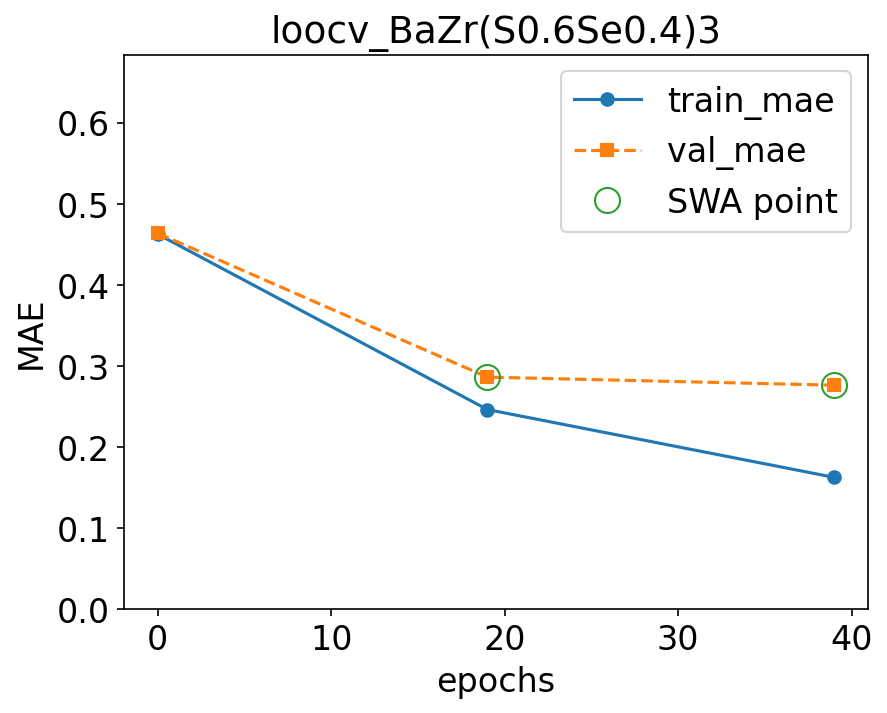

Epoch: 59/300 --- train mae: 0.113 val mae: 0.27


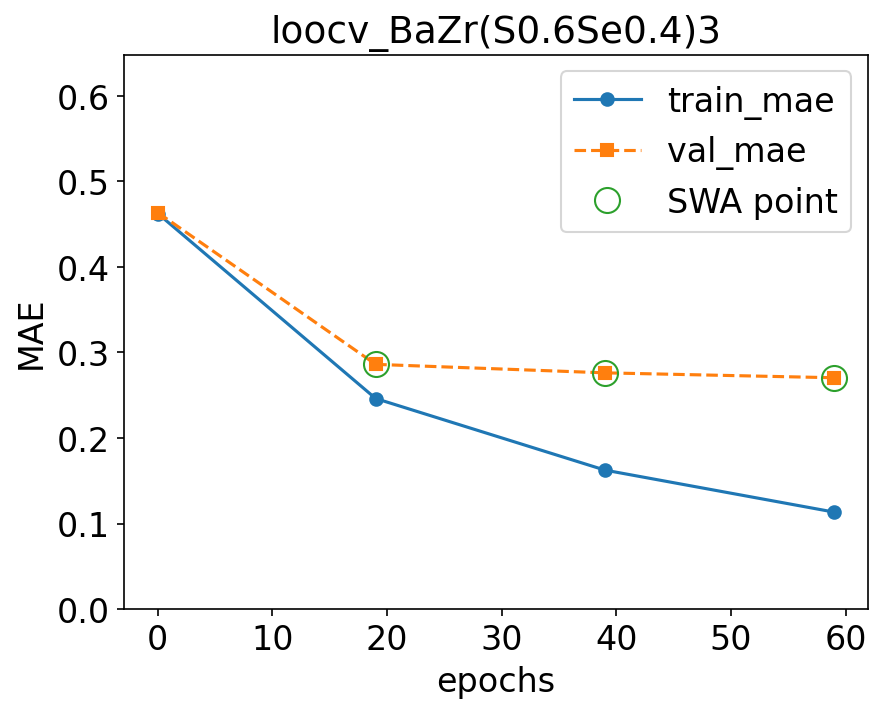

Epoch 79 failed to improve.
Discarded: 1/3 weight updates
Epoch: 79/300 --- train mae: 0.0841 val mae: 0.275


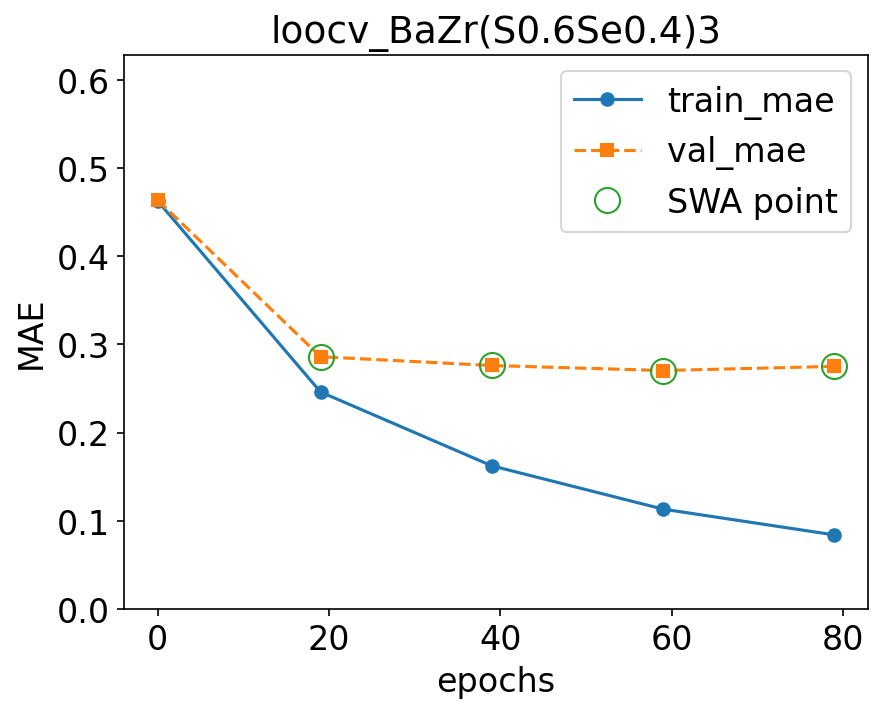

Epoch 99 failed to improve.
Discarded: 2/3 weight updates
Epoch: 99/300 --- train mae: 0.0681 val mae: 0.28


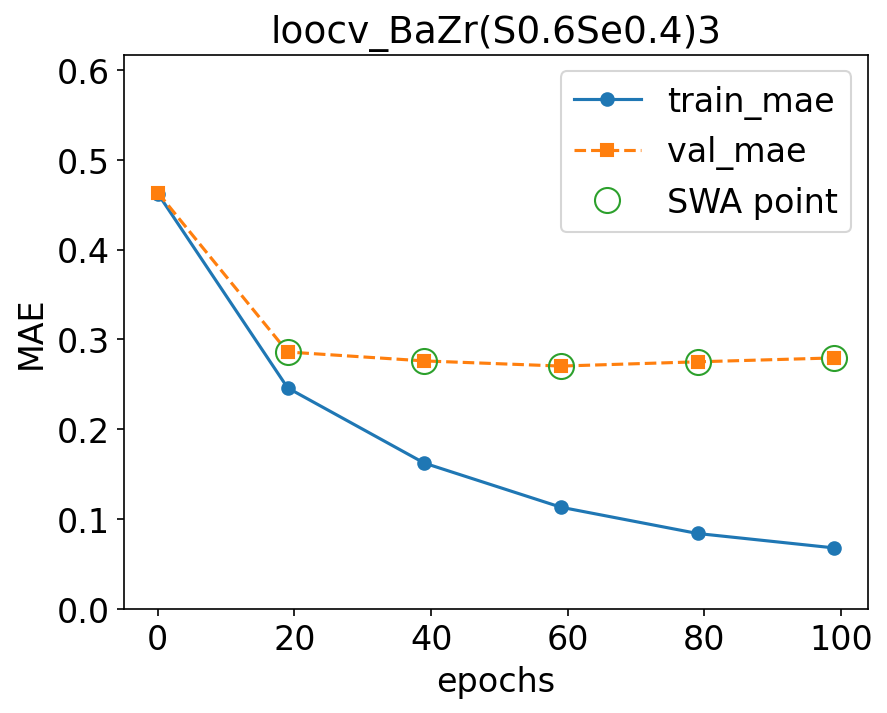

Epoch 119 failed to improve.
Discarded: 3/3 weight updates
Epoch: 119/300 --- train mae: 0.0556 val mae: 0.284


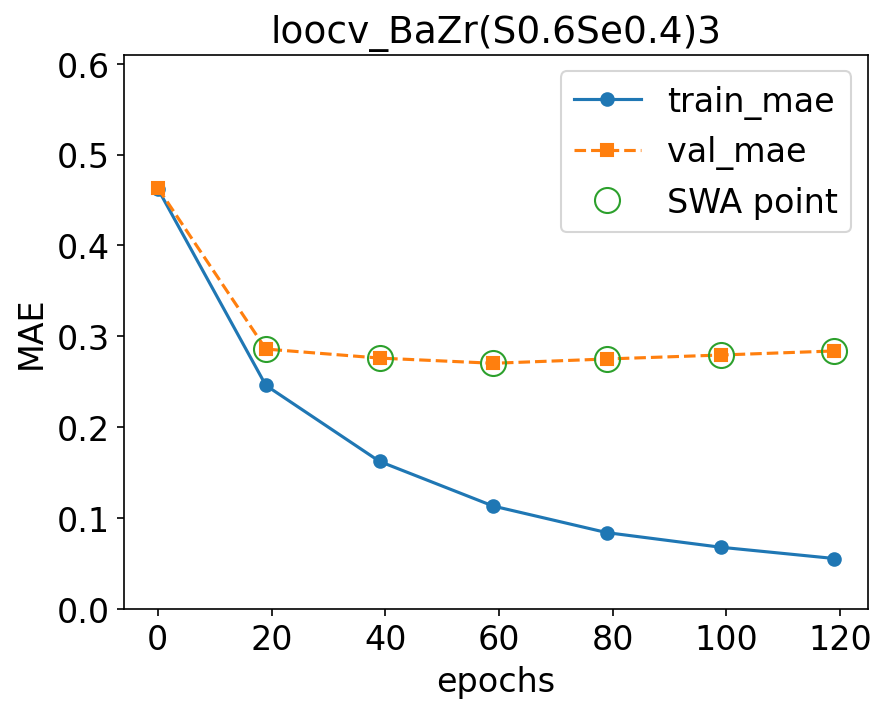

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_BaZr(S0.6Se0.4)3) to models/trained_models/loocv_BaZr(S0.6Se0.4)3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7839.82formulae/s]

loading data with up to 9 elements in the formula
  Actual: 1.76 eV  |  Predicted: 1.75 ± 0.32 eV  |  Residual: -0.01 eV

--- LOOCV fold 5/9: holding out BaZrS3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM:   0%|          | 0/2901 [00:00<?, ?formulae/s]

skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 112946.03formulae/s]


loading data with up to 9 elements in the formula
training with batchsize 256 (2**8.000)


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 72038.44formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.454 val mae: 0.454


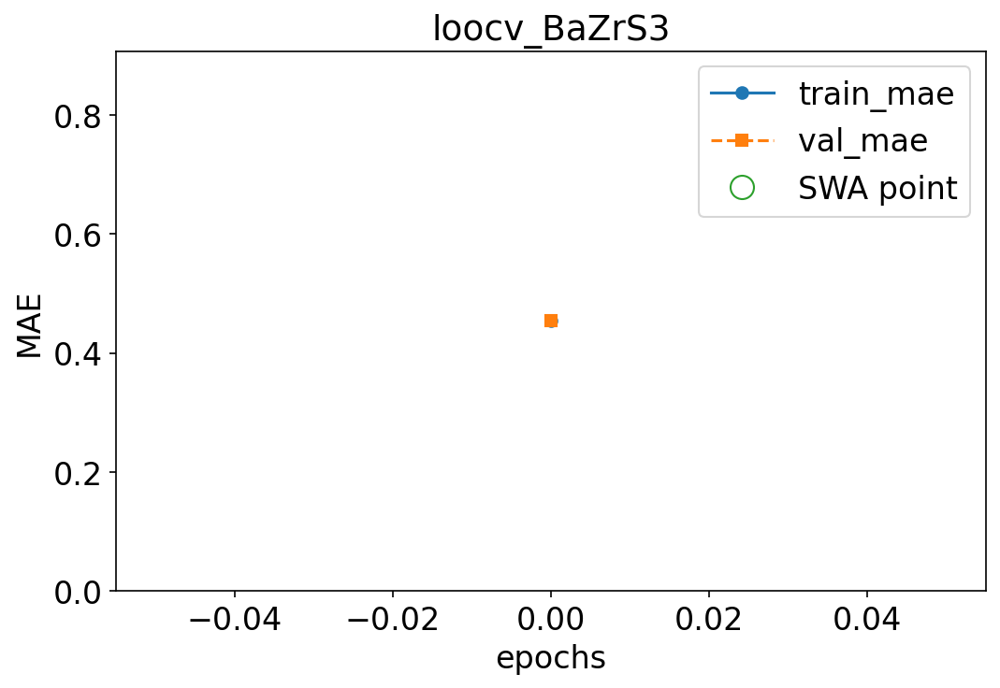

Epoch: 19/300 --- train mae: 0.24 val mae: 0.292


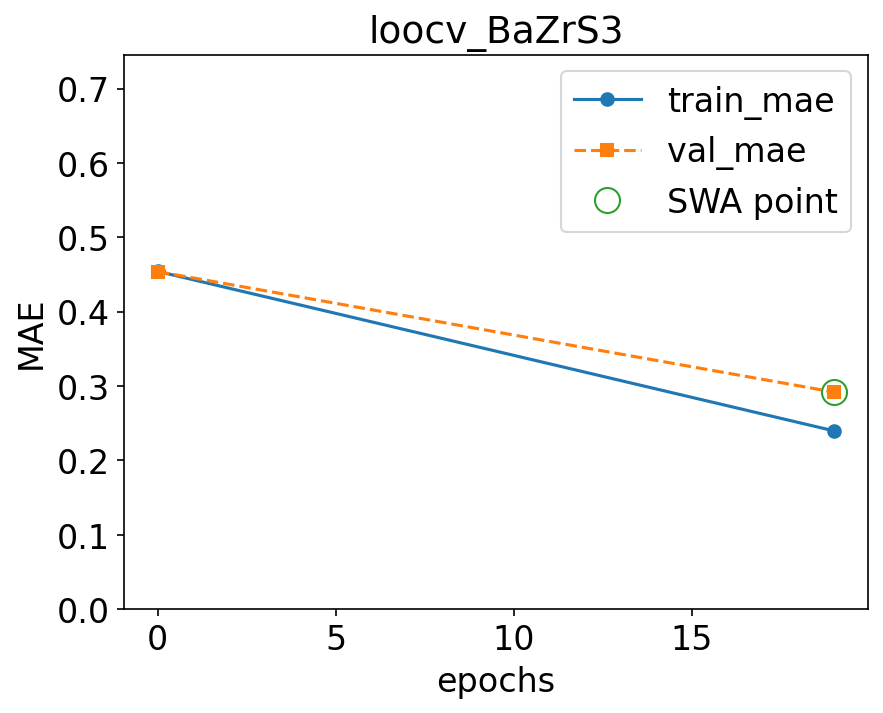

Epoch: 39/300 --- train mae: 0.166 val mae: 0.282


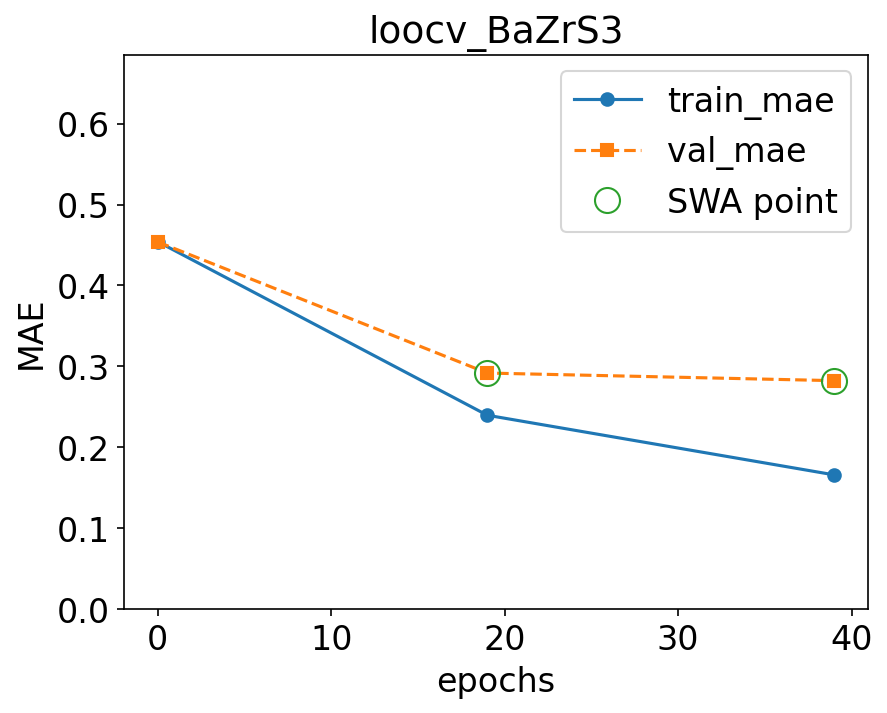

Epoch: 59/300 --- train mae: 0.118 val mae: 0.275


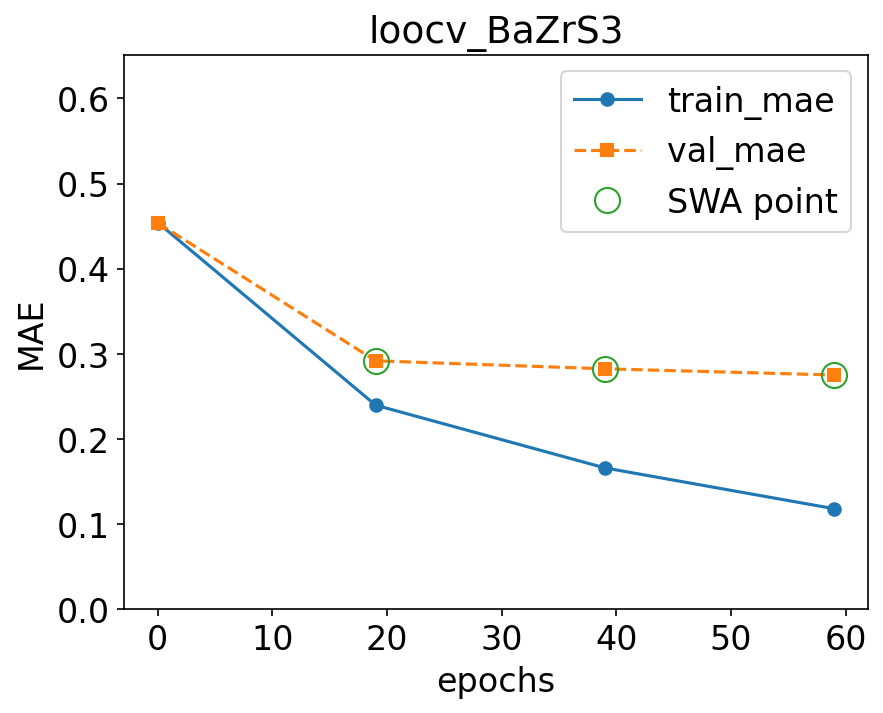

Epoch: 79/300 --- train mae: 0.0857 val mae: 0.277


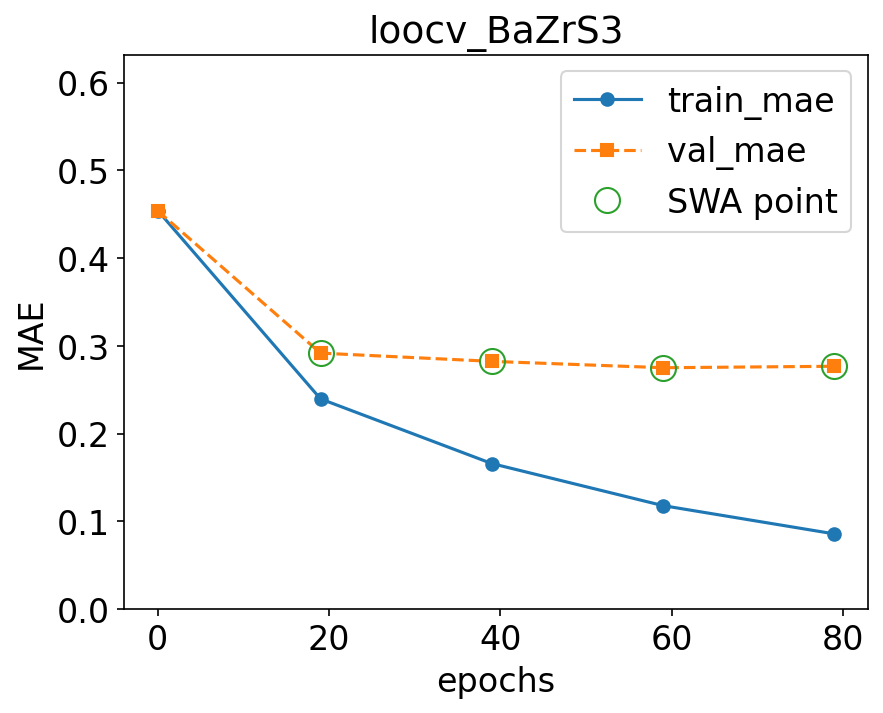

Epoch: 99/300 --- train mae: 0.0643 val mae: 0.275


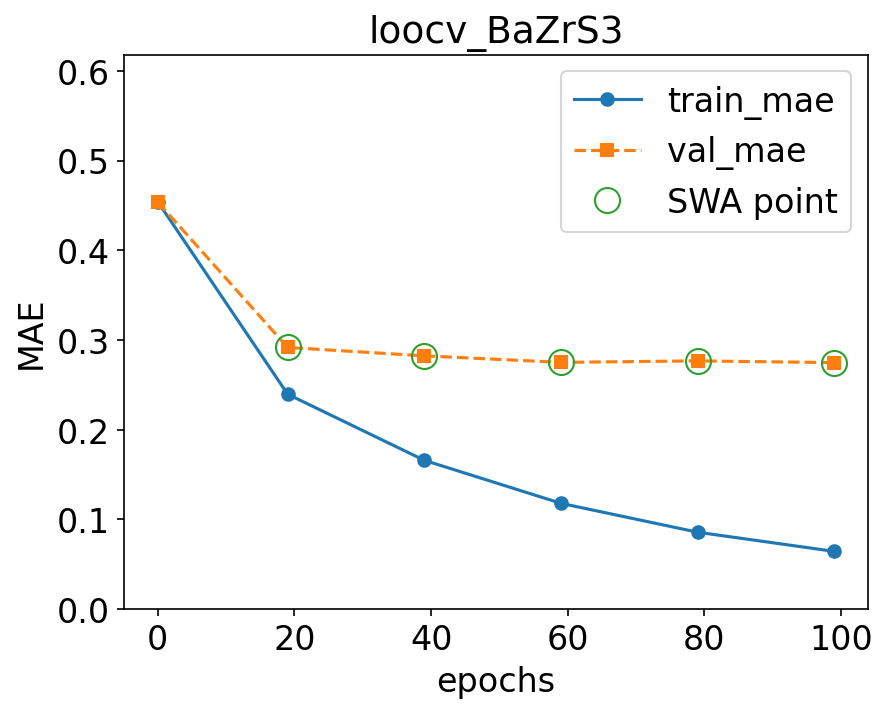

Epoch: 119/300 --- train mae: 0.0535 val mae: 0.273


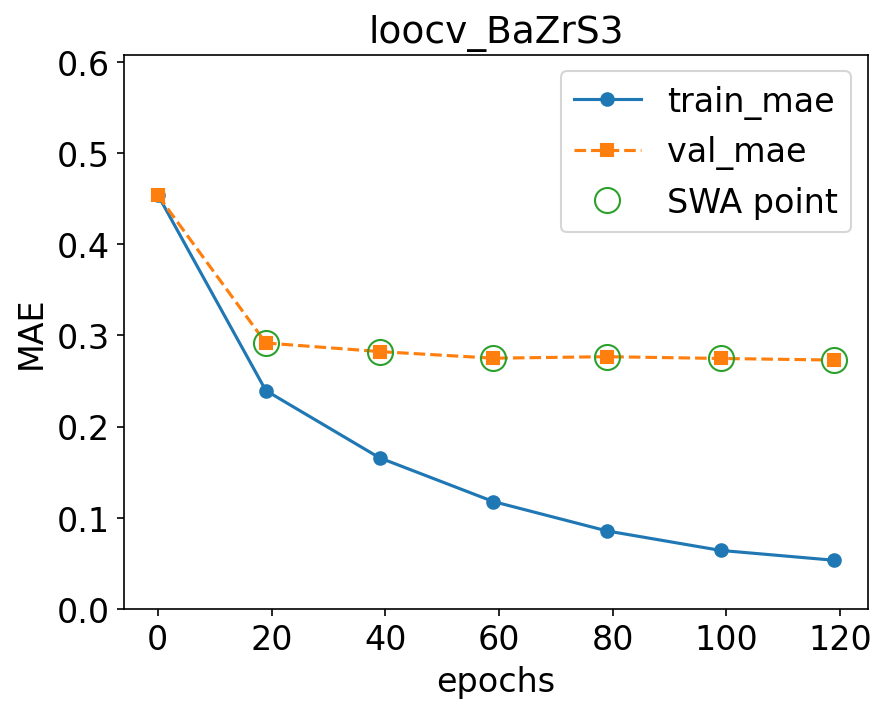

Epoch: 139/300 --- train mae: 0.0458 val mae: 0.274


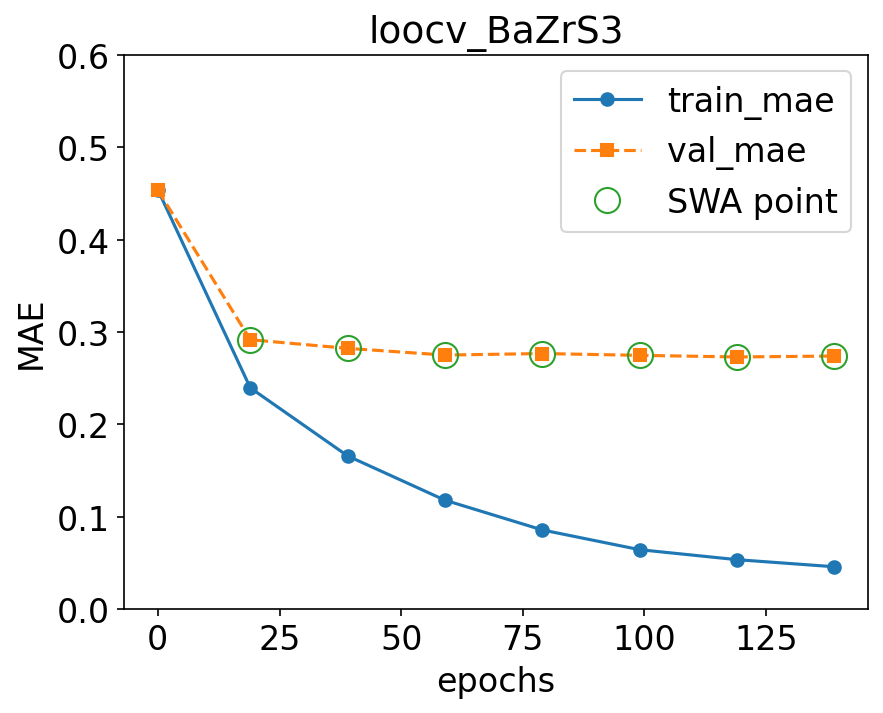

Epoch: 159/300 --- train mae: 0.04 val mae: 0.273


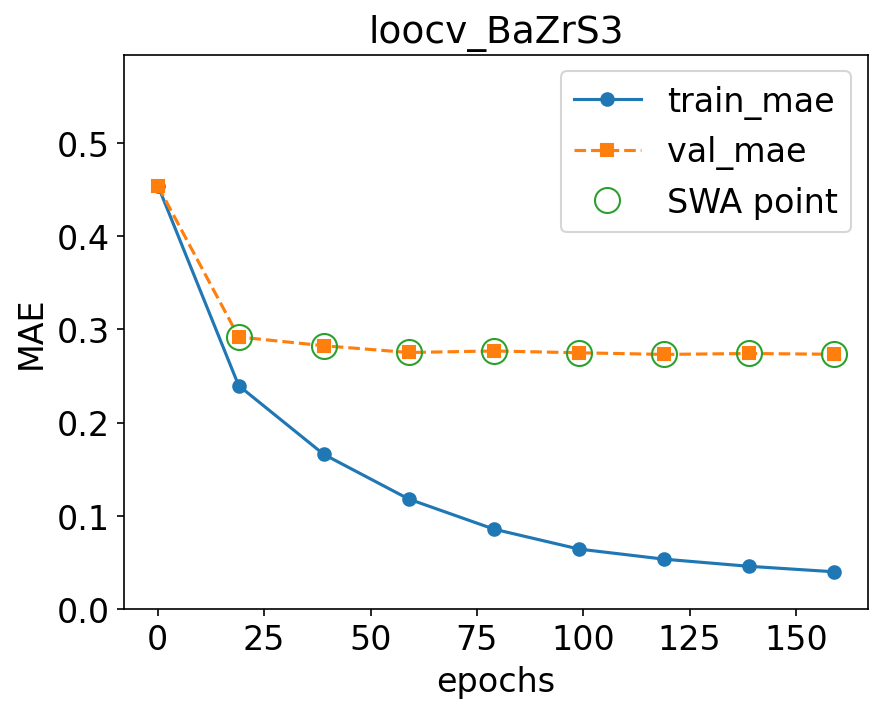

Epoch: 179/300 --- train mae: 0.0351 val mae: 0.274


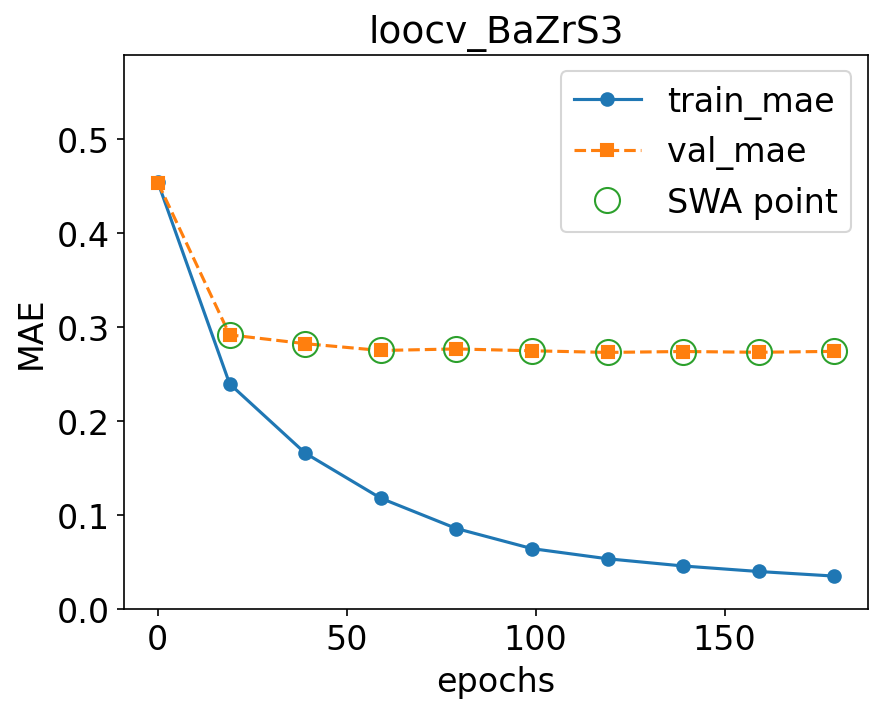

Epoch: 199/300 --- train mae: 0.033 val mae: 0.273


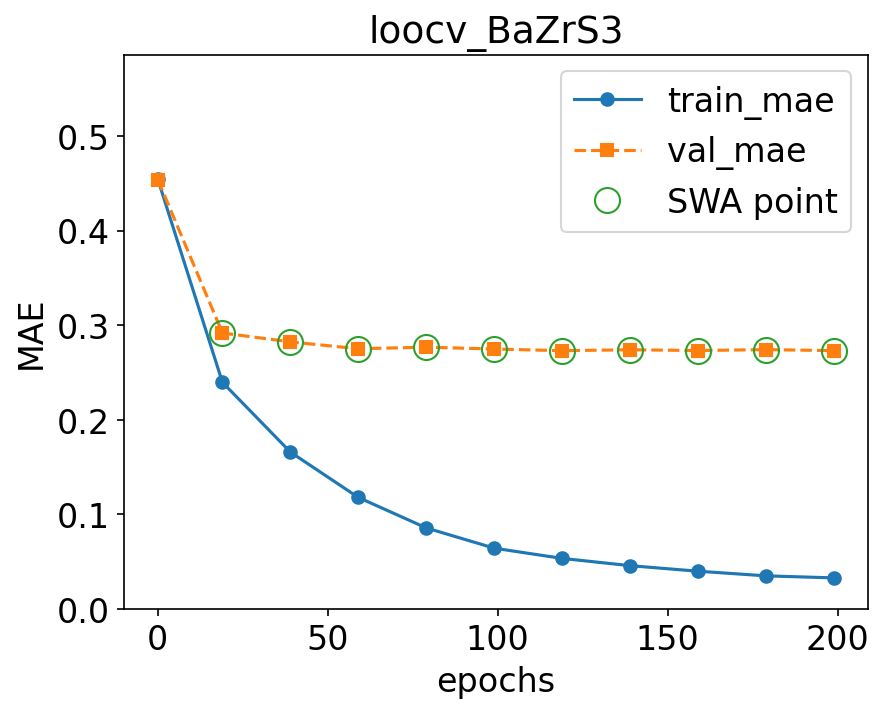

Epoch: 219/300 --- train mae: 0.0315 val mae: 0.274


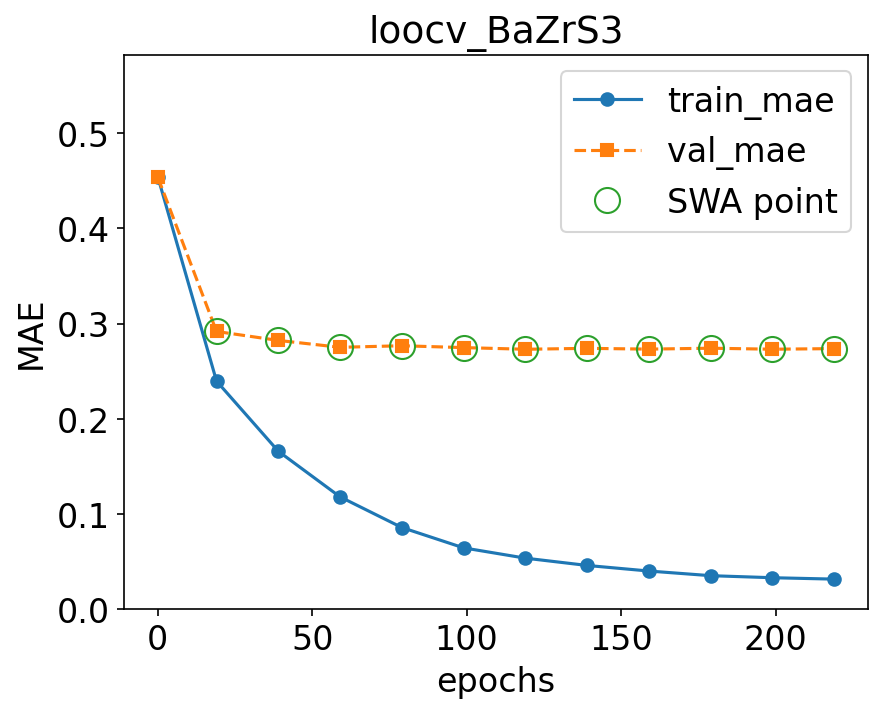

Epoch: 239/300 --- train mae: 0.0287 val mae: 0.269


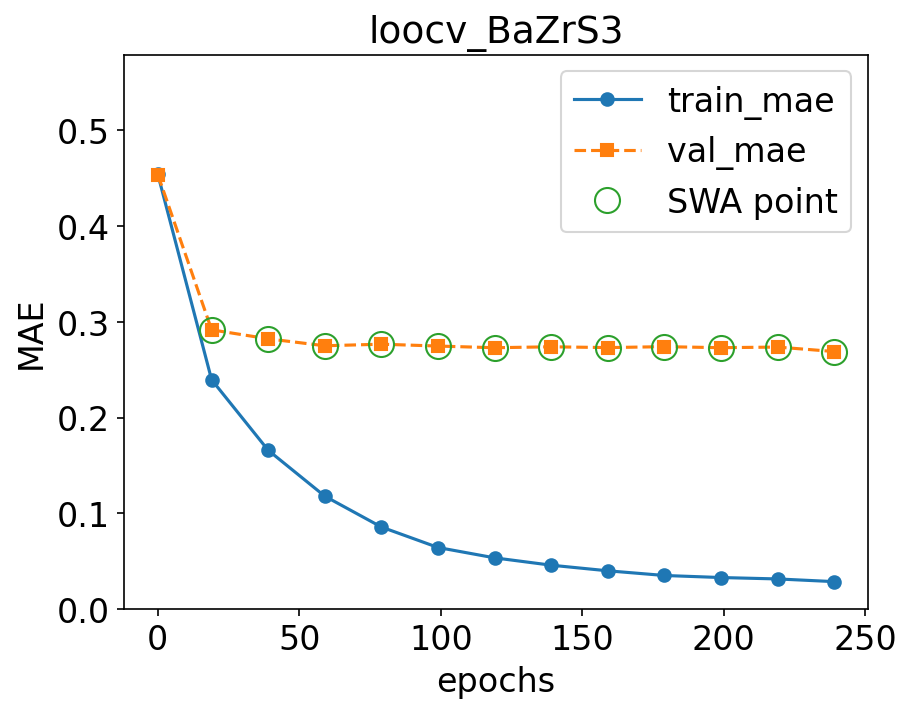

Epoch: 259/300 --- train mae: 0.0273 val mae: 0.265


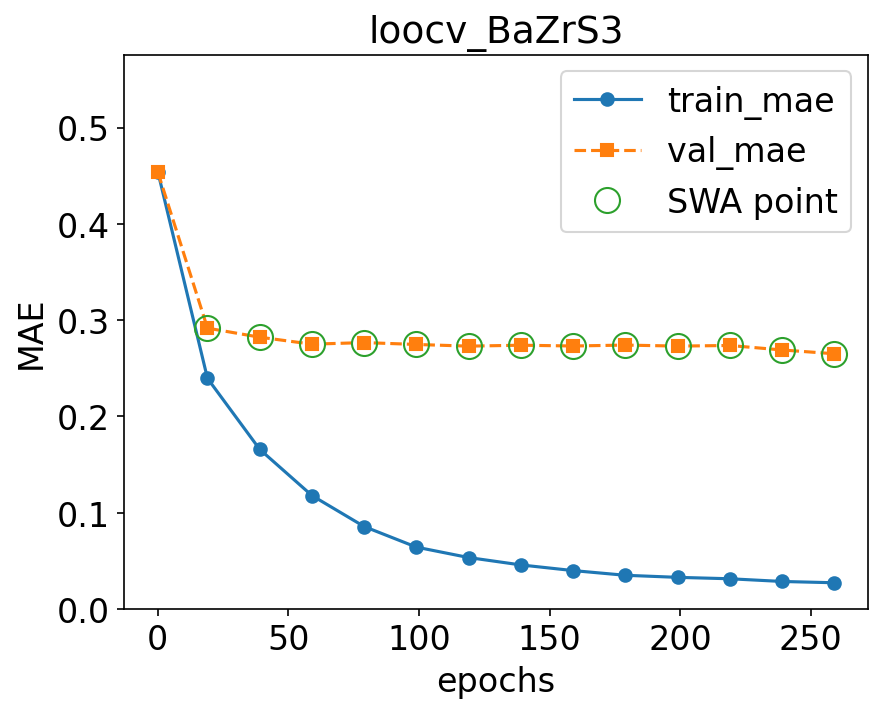

Epoch 279 failed to improve.
Discarded: 1/3 weight updates
Epoch: 279/300 --- train mae: 0.0263 val mae: 0.267


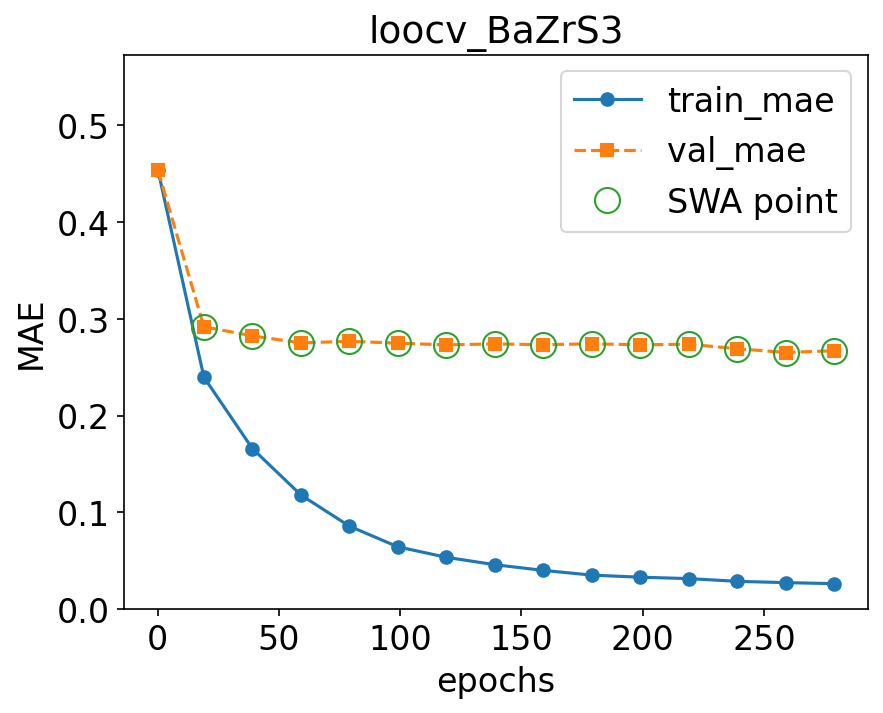

Epoch 299 failed to improve.
Discarded: 2/3 weight updates
Epoch: 299/300 --- train mae: 0.0256 val mae: 0.27


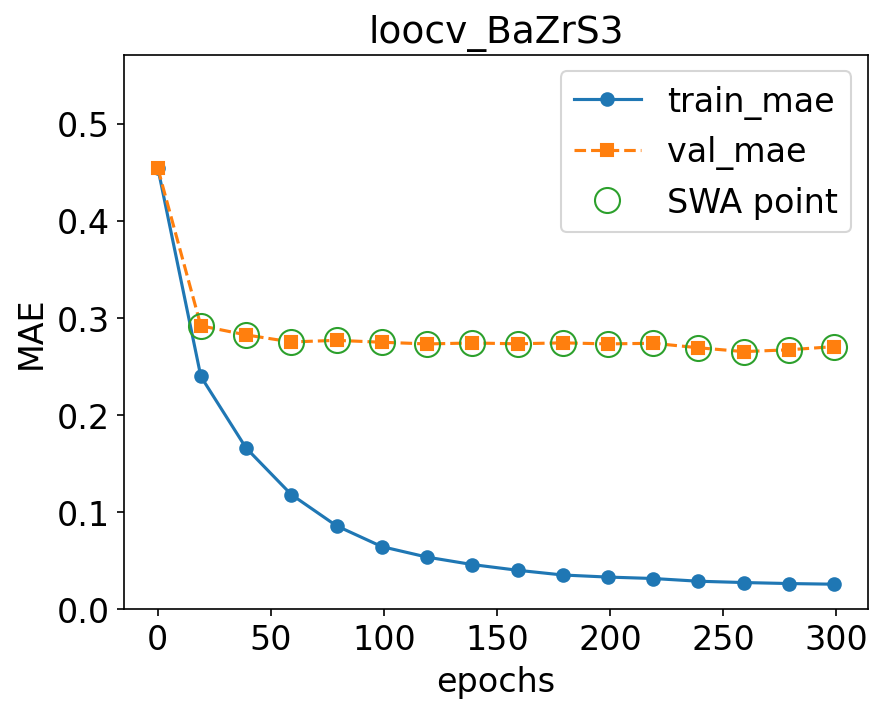

Saving network (loocv_BaZrS3) to models/trained_models/loocv_BaZrS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7810.62formulae/s]

loading data with up to 9 elements in the formula
  Actual: 1.85 eV  |  Predicted: 1.78 ± 0.02 eV  |  Residual: -0.08 eV

--- LOOCV fold 6/9: holding out LaScS3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM:   0%|          | 0/2901 [00:00<?, ?formulae/s]

skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])


Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 54489.04formulae/s]


skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 5.0), ('I', 3.0), ('N', 2.0), ('C', 1.0), ('Sn', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1054.0), ('I', 600.0), ('N', 391.0), ('C', 230.0), ('Pb', 200.0), ('Cs', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 38.0), ('I', 15.0), ('C', 9.0), ('N', 5.0), ('Pb', 5.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 344.0), ('I', 150.0), ('B', 50.0), ('Pb', 50.0), ('C', 49.0), ('N', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 6.0), ('I', 3.0), ('P', 2.0), ('C', 1.0), ('N', 1

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 49069.63formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.464 val mae: 0.466


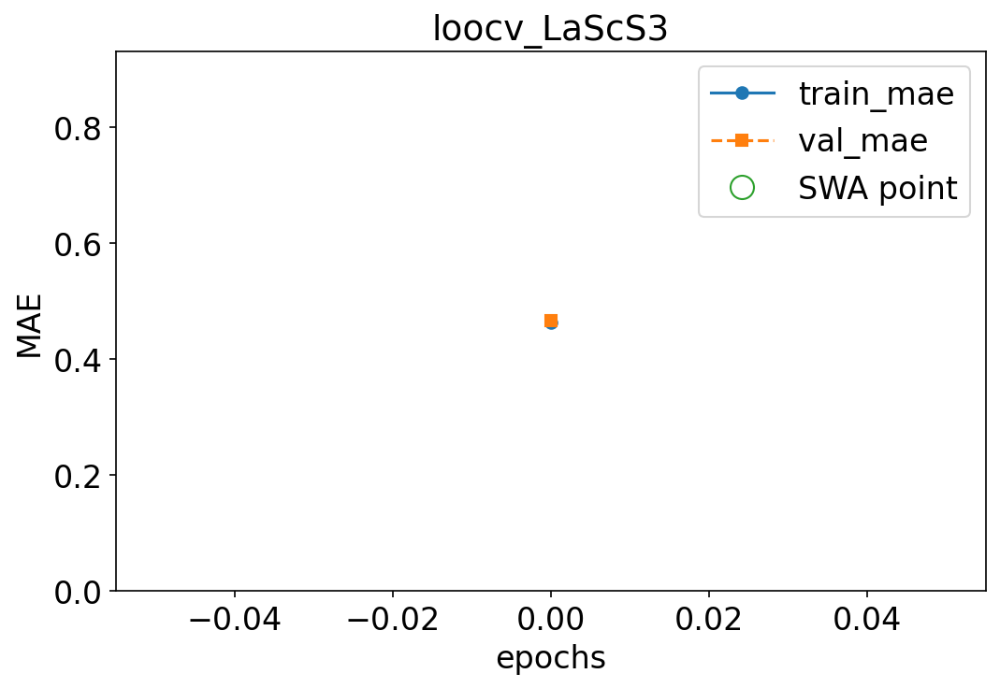

Epoch: 19/300 --- train mae: 0.243 val mae: 0.295


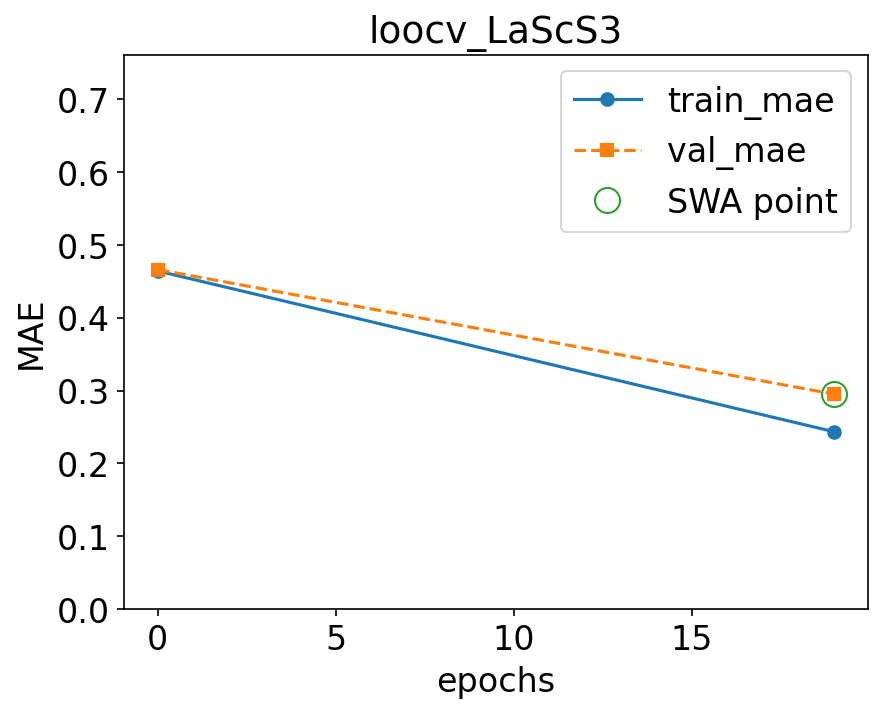

Epoch: 39/300 --- train mae: 0.16 val mae: 0.281


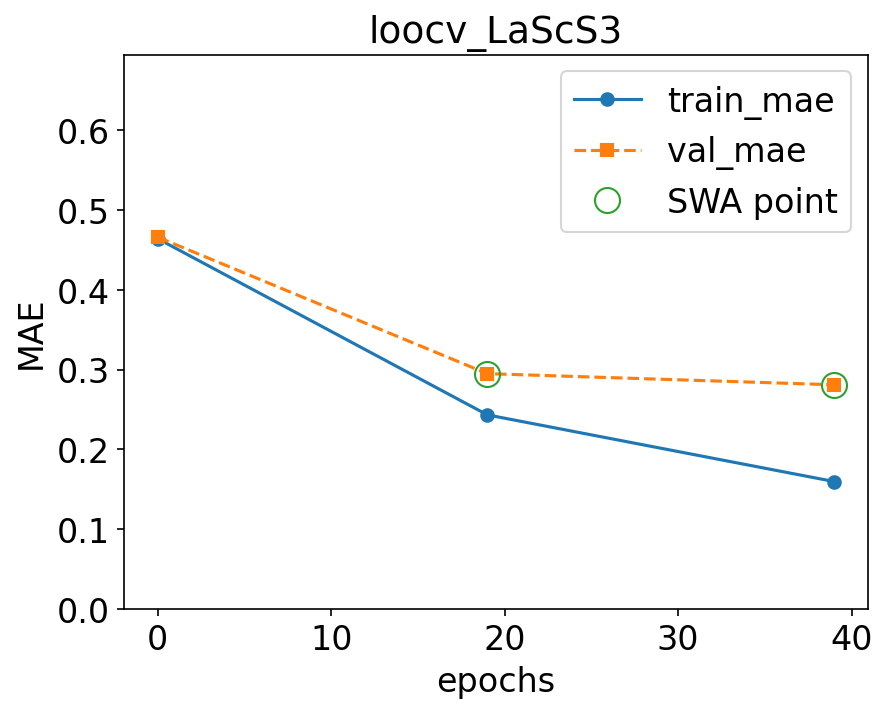

Epoch: 59/300 --- train mae: 0.11 val mae: 0.277


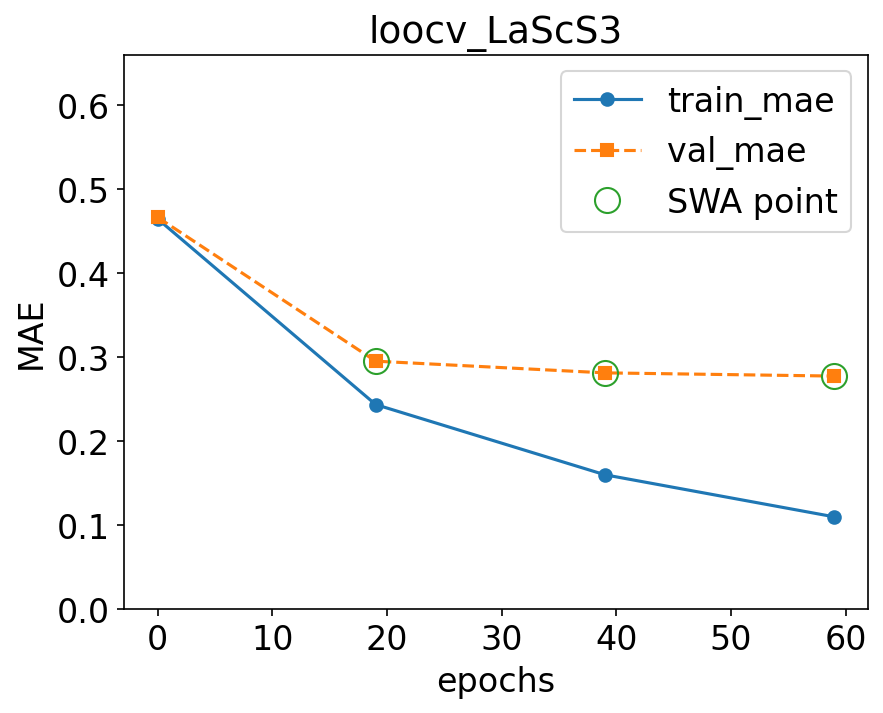

Epoch: 79/300 --- train mae: 0.0799 val mae: 0.272


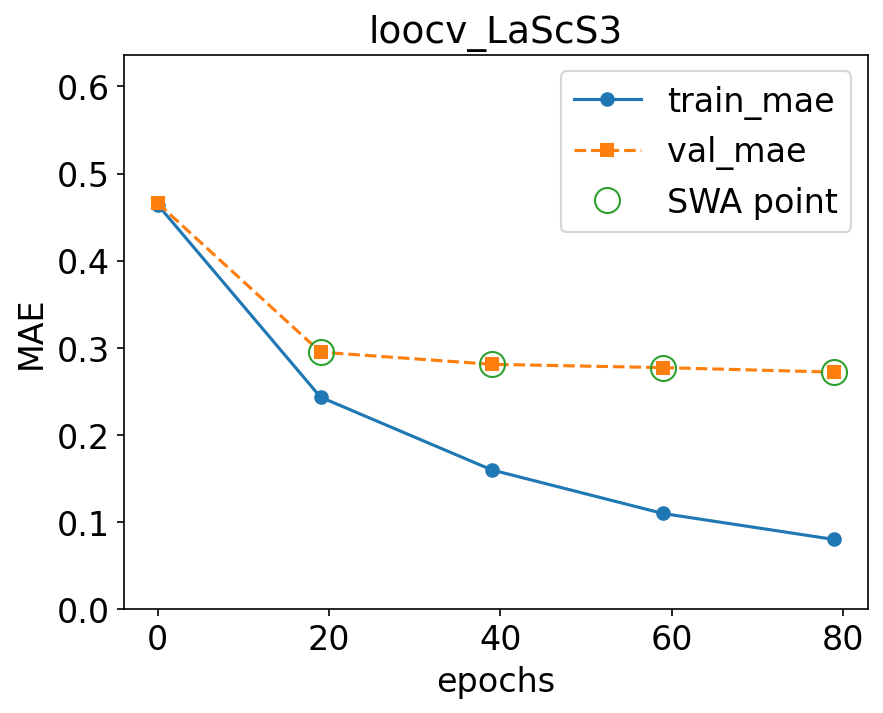

Epoch: 99/300 --- train mae: 0.0604 val mae: 0.269


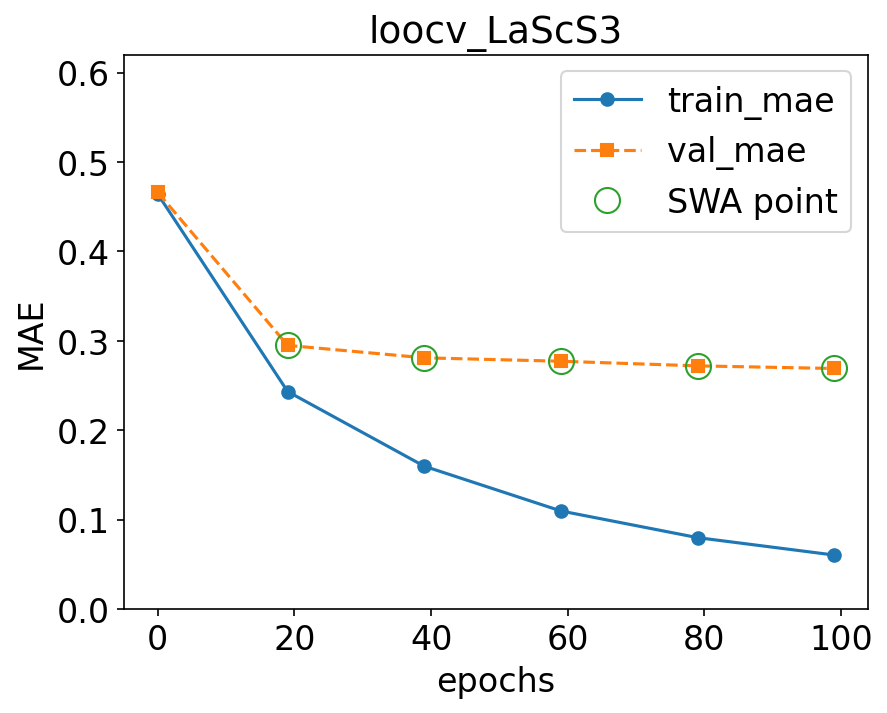

Epoch 119 failed to improve.
Discarded: 1/3 weight updates
Epoch: 119/300 --- train mae: 0.0488 val mae: 0.275


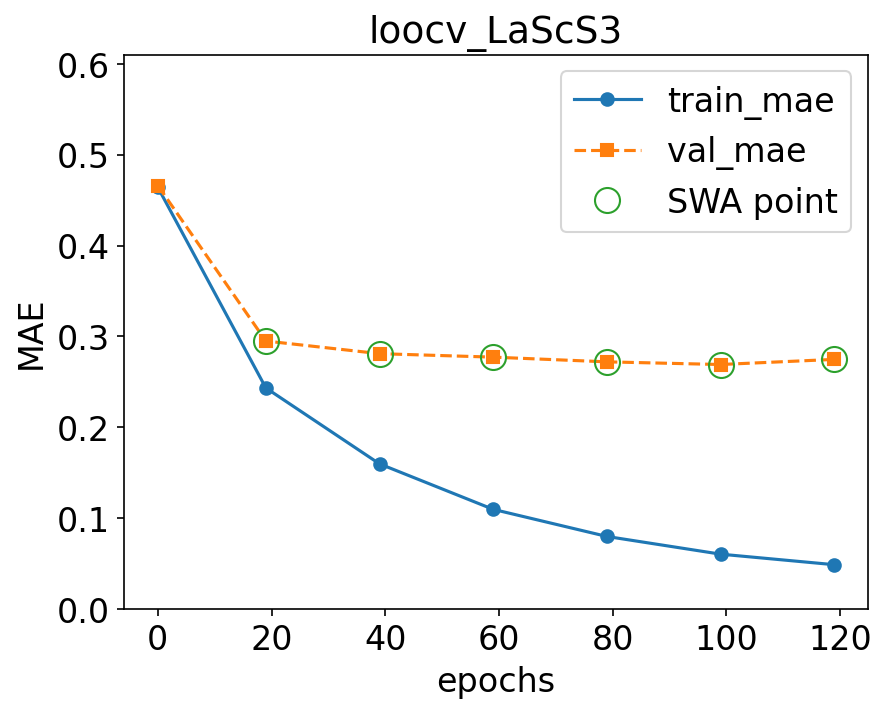

Epoch 139 failed to improve.
Discarded: 2/3 weight updates
Epoch: 139/300 --- train mae: 0.0424 val mae: 0.273


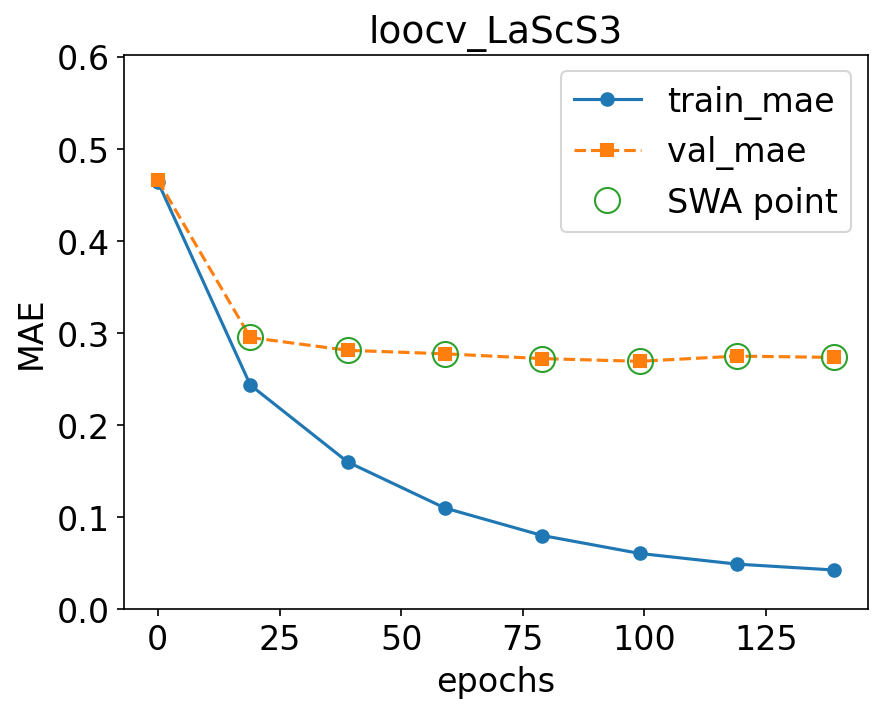

Epoch 159 failed to improve.
Discarded: 3/3 weight updates
Epoch: 159/300 --- train mae: 0.0375 val mae: 0.272


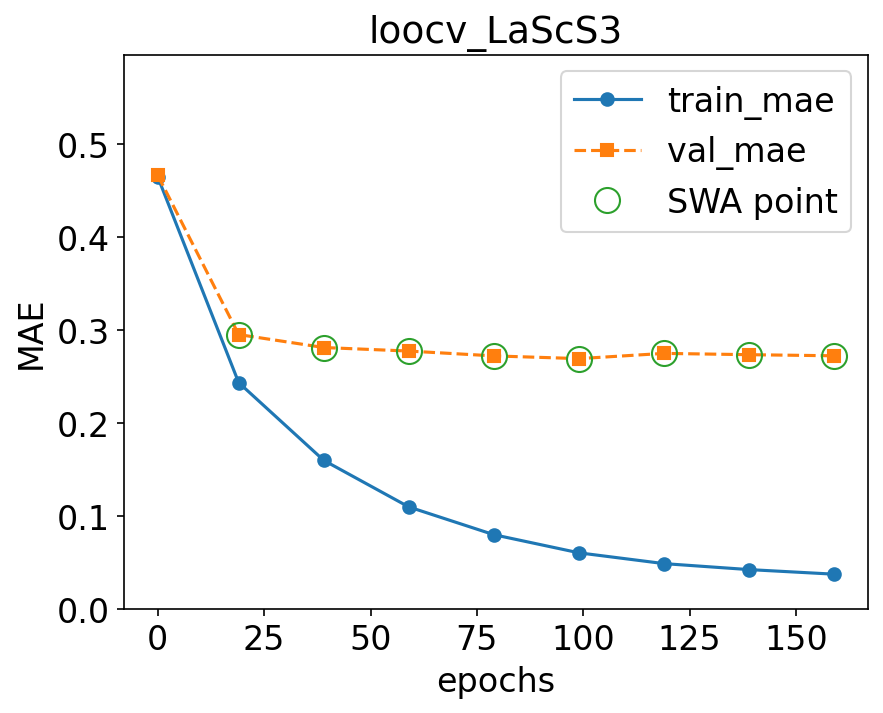

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_LaScS3) to models/trained_models/loocv_LaScS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5660.33formulae/s]

loading data with up to 9 elements in the formula


  Actual: 2.90 eV  |  Predicted: 1.95 ± 0.23 eV  |  Residual: -0.95 eV

--- LOOCV fold 7/9: holding out LaYS3 ---

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 129661.30formulae/s]

skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

loading data with up to 9 elements in the formula
training with batchsize 256 (2**8.000)


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 115878.86formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.455 val mae: 0.455


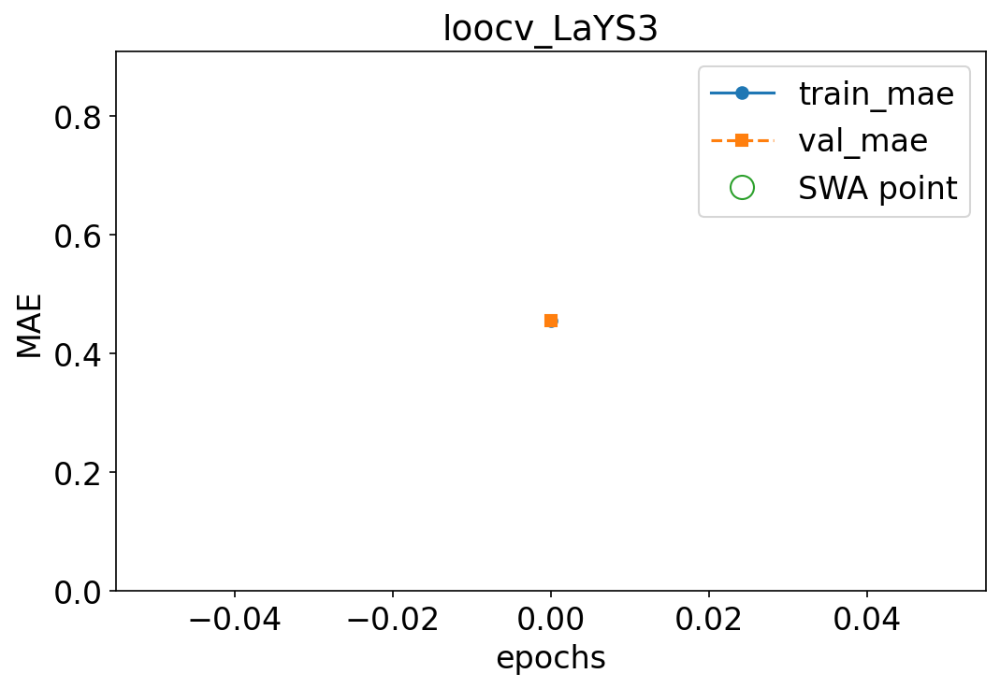

Epoch: 19/300 --- train mae: 0.242 val mae: 0.285


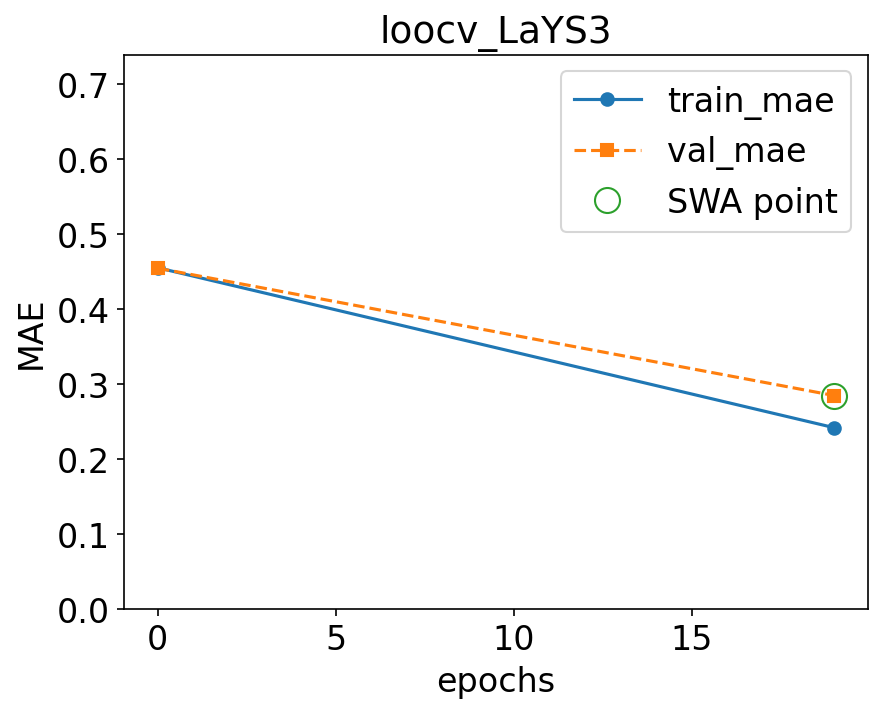

Epoch: 39/300 --- train mae: 0.157 val mae: 0.271


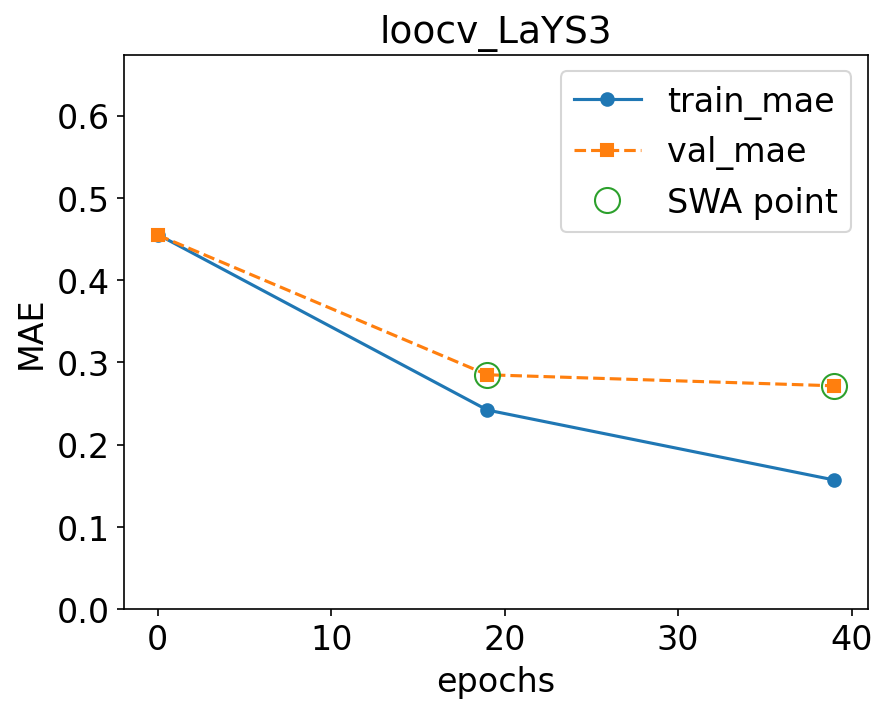

Epoch: 59/300 --- train mae: 0.11 val mae: 0.267


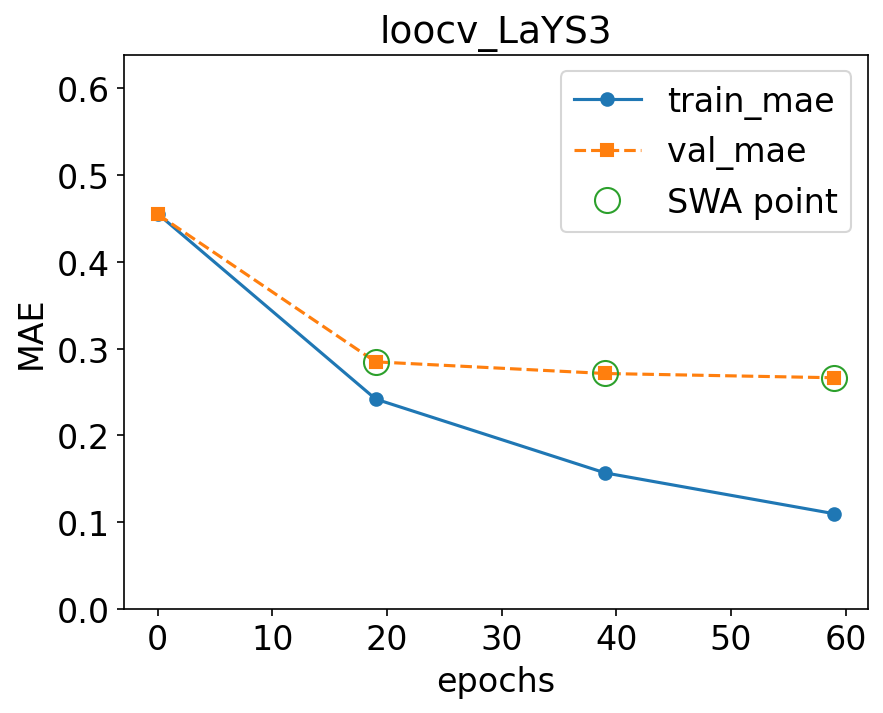

Epoch 79 failed to improve.
Discarded: 1/3 weight updates
Epoch: 79/300 --- train mae: 0.0808 val mae: 0.272


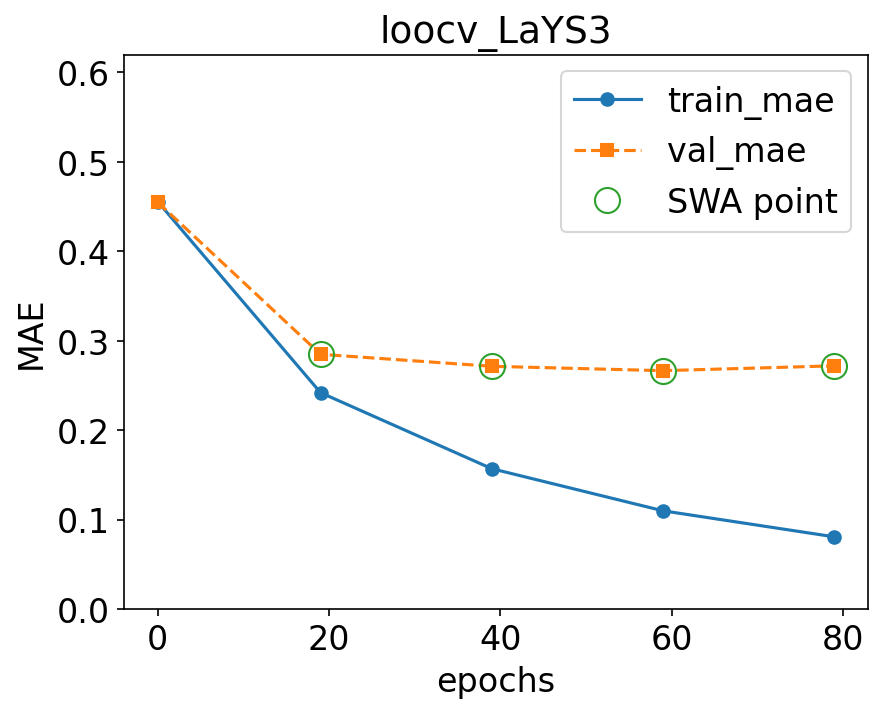

Epoch: 99/300 --- train mae: 0.0631 val mae: 0.264


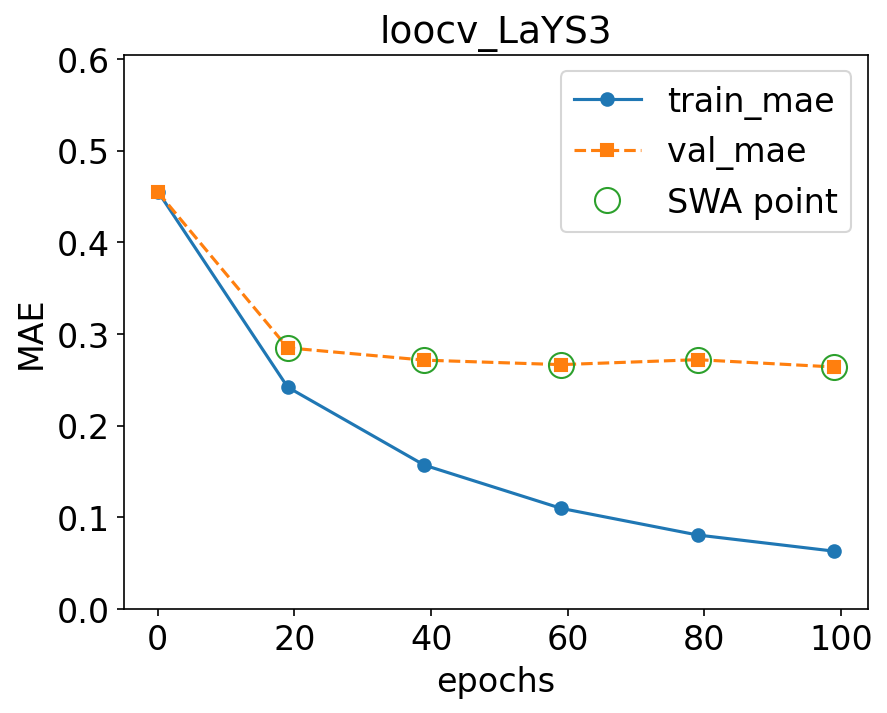

Epoch: 119/300 --- train mae: 0.0505 val mae: 0.265


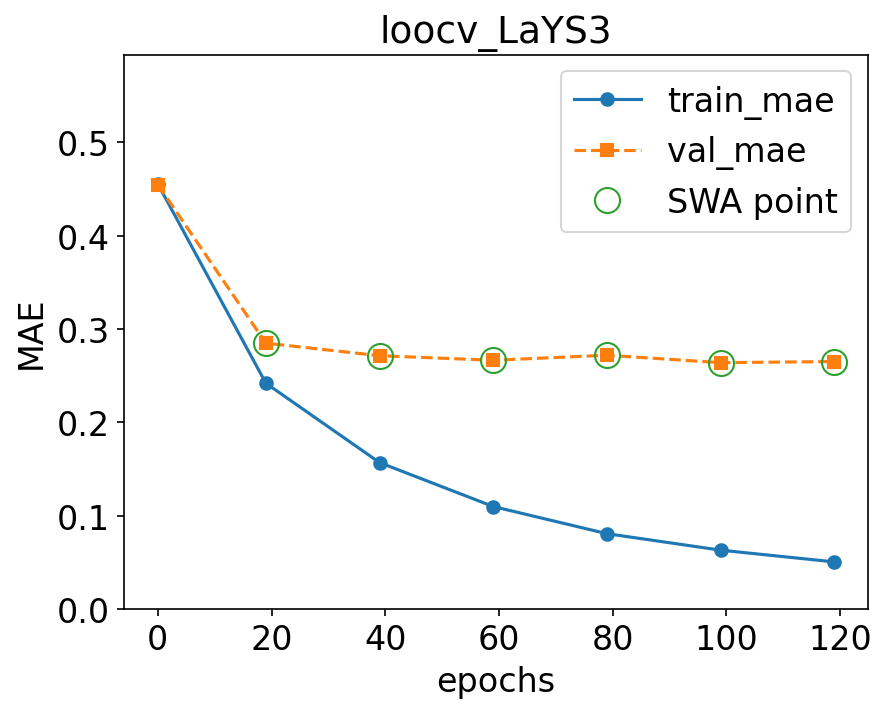

Epoch 139 failed to improve.
Discarded: 2/3 weight updates
Epoch: 139/300 --- train mae: 0.0427 val mae: 0.269


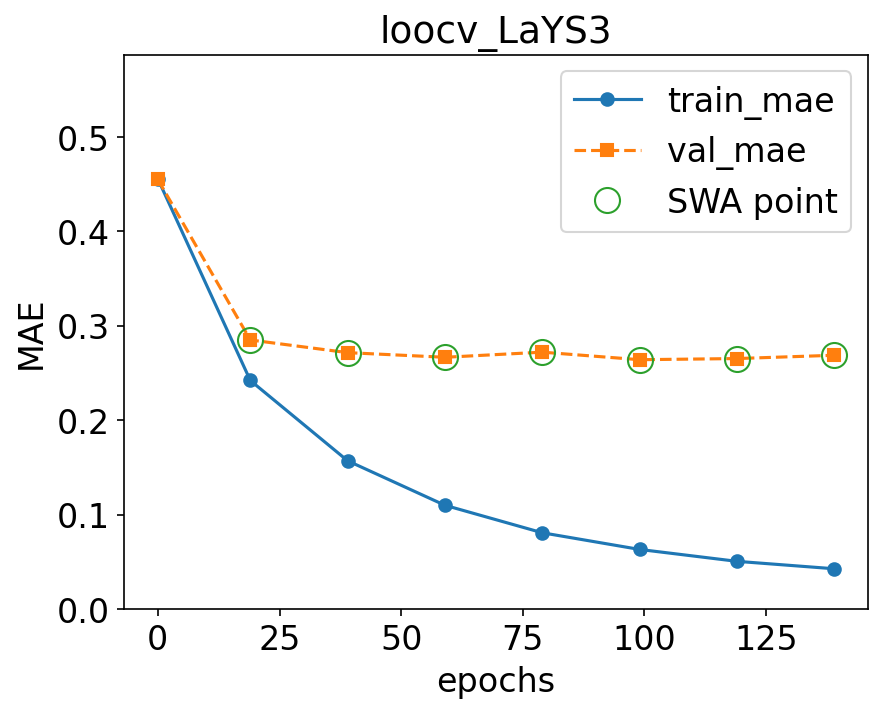

Epoch 159 failed to improve.
Discarded: 3/3 weight updates
Epoch: 159/300 --- train mae: 0.0381 val mae: 0.269


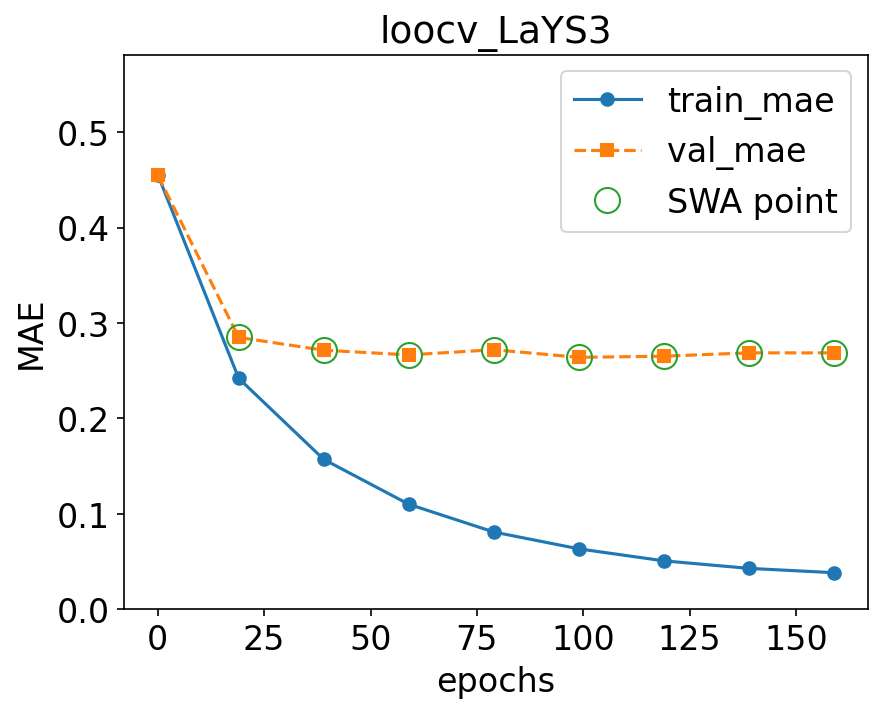

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_LaYS3) to models/trained_models/loocv_LaYS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5216.80formulae/s]

loading data with up to 9 elements in the formula


  Actual: 2.15 eV  |  Predicted: 1.92 ± 0.05 eV  |  Residual: -0.23 eV

--- LOOCV fold 8/9: holding out SrHfS3 ---

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM:   0%|          | 0/2901 [00:00<?, ?formulae/s]

skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 109938.61formulae/s]


skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 6.0), ('I', 3.0), ('P', 2.0), ('C', 1.0), ('N', 1.0), ('Pb', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
training with batchsize 256 (2**8.000)


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 76613.11formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.457 val mae: 0.458


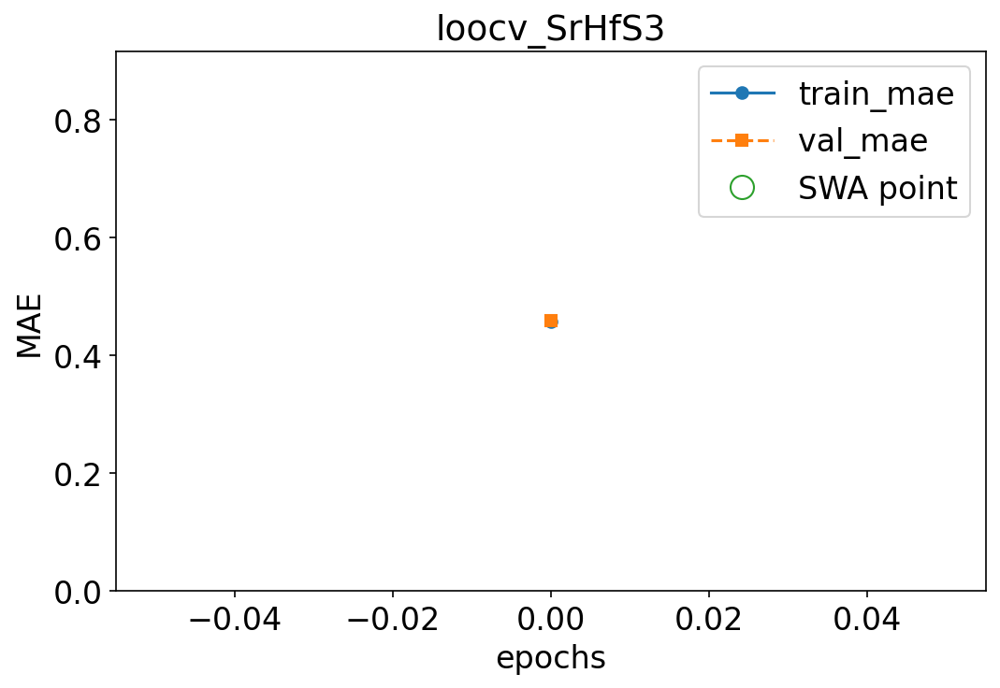

Epoch: 19/300 --- train mae: 0.252 val mae: 0.302


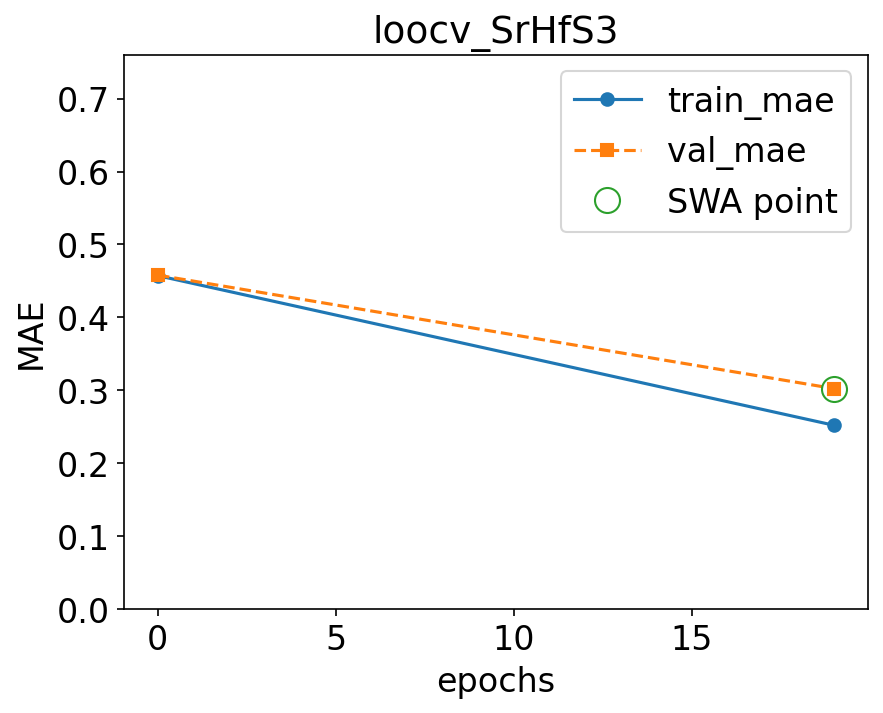

Epoch: 39/300 --- train mae: 0.162 val mae: 0.273


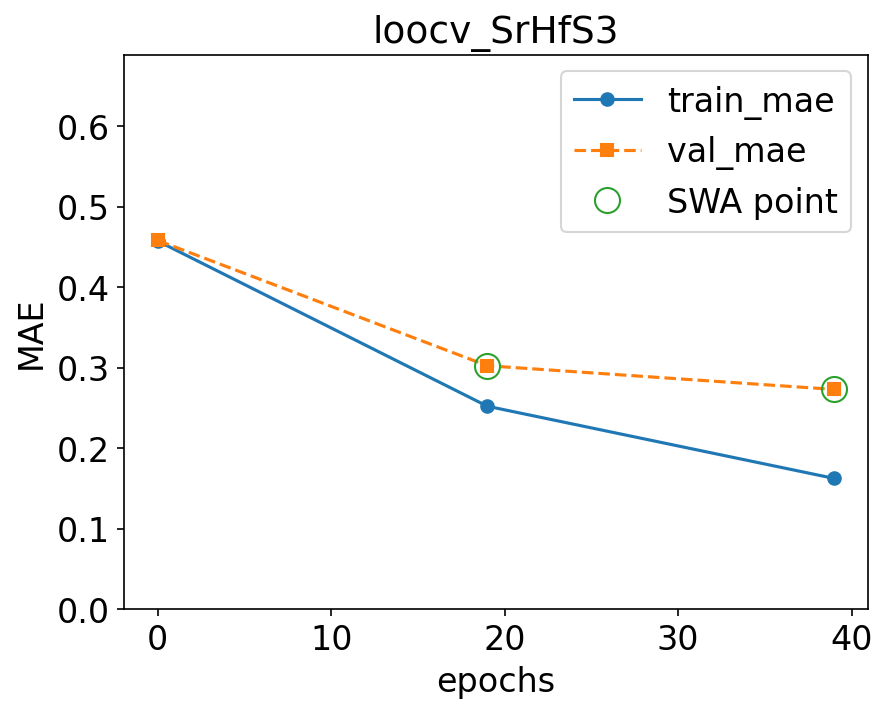

Epoch 59 failed to improve.
Discarded: 1/3 weight updates
Epoch: 59/300 --- train mae: 0.111 val mae: 0.277


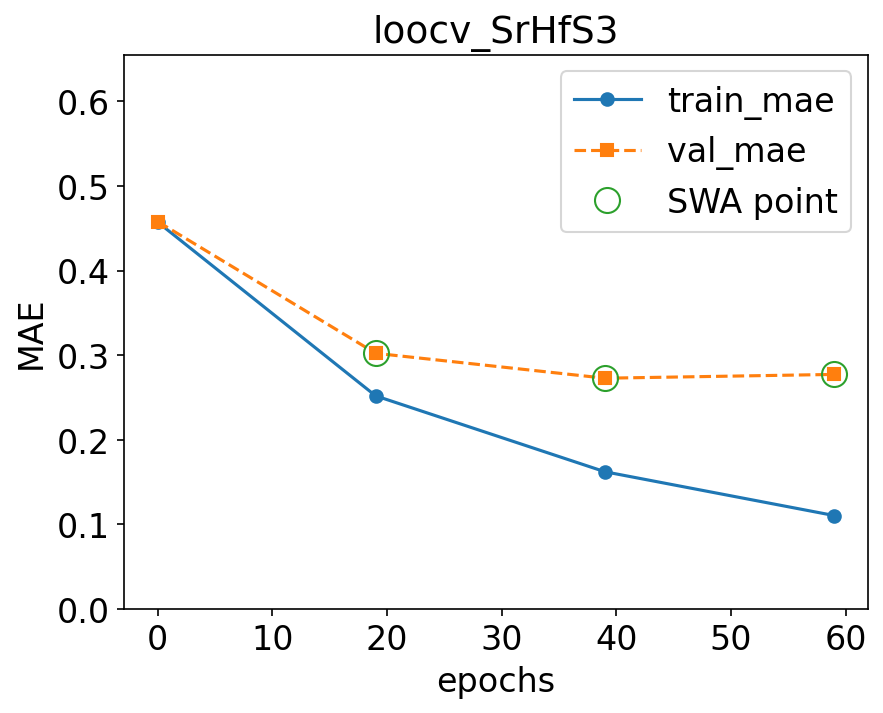

Epoch: 79/300 --- train mae: 0.0813 val mae: 0.267


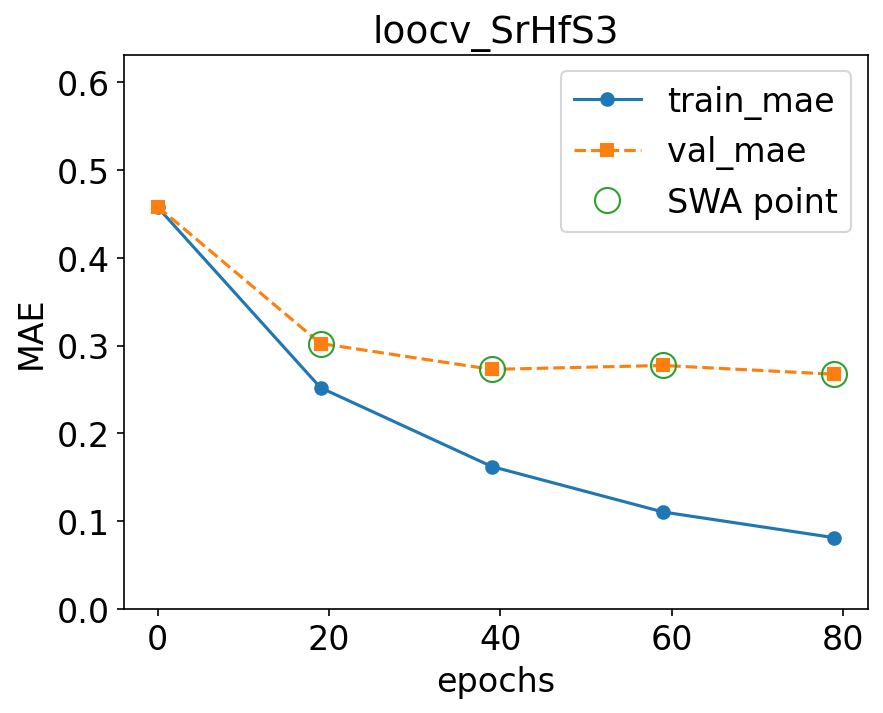

Epoch: 99/300 --- train mae: 0.0628 val mae: 0.27


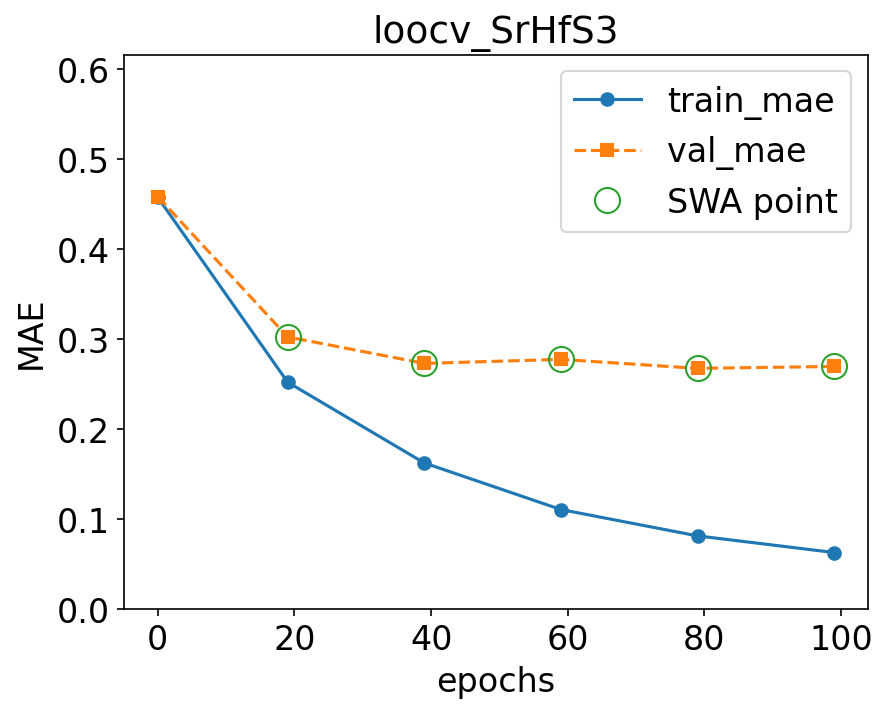

Epoch: 119/300 --- train mae: 0.0524 val mae: 0.269


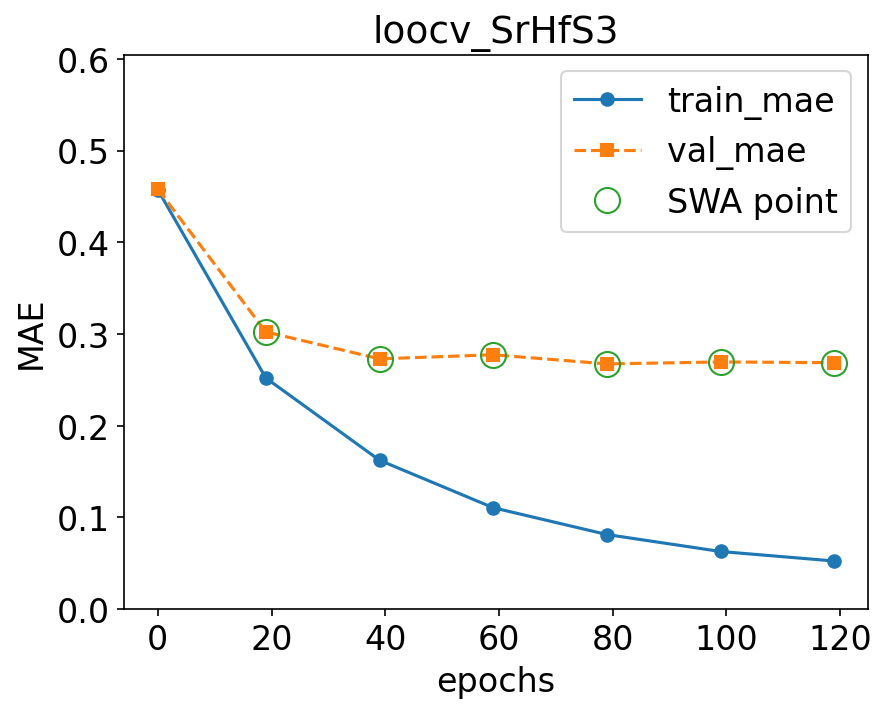

Epoch: 139/300 --- train mae: 0.043 val mae: 0.269


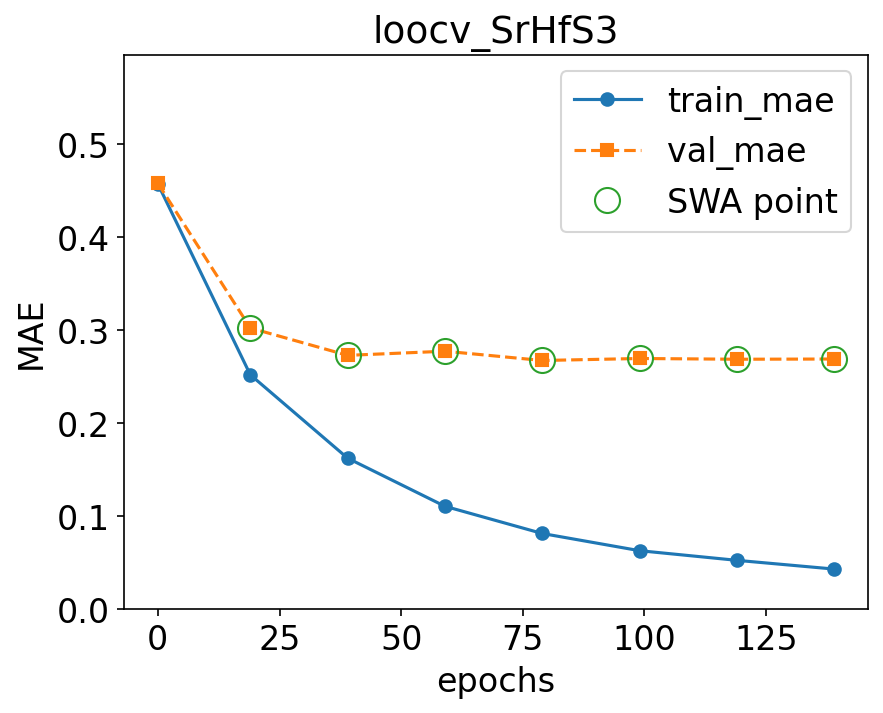

Epoch: 159/300 --- train mae: 0.0381 val mae: 0.268


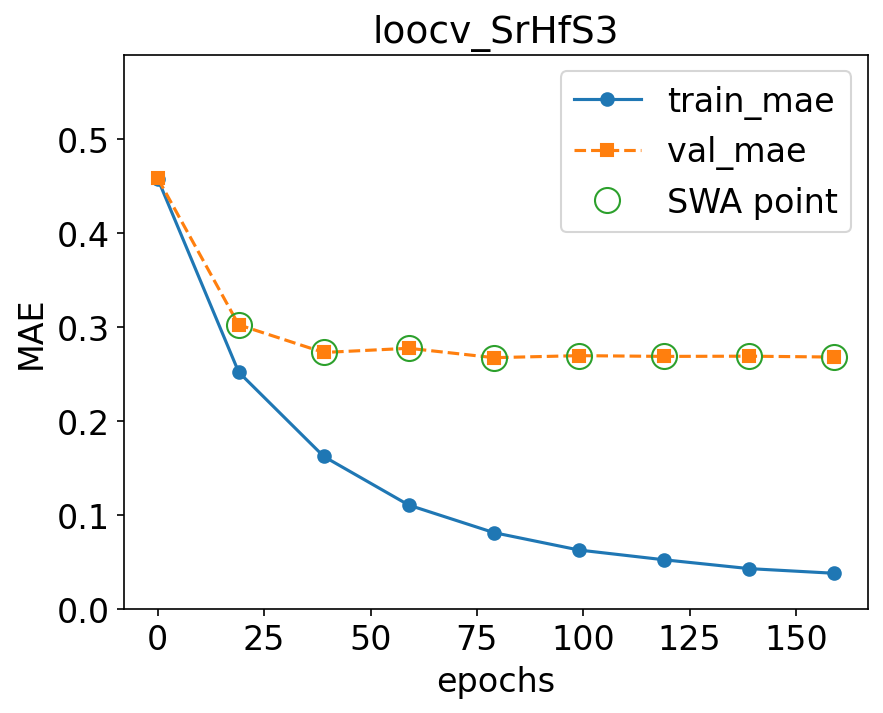

Epoch: 179/300 --- train mae: 0.0336 val mae: 0.268


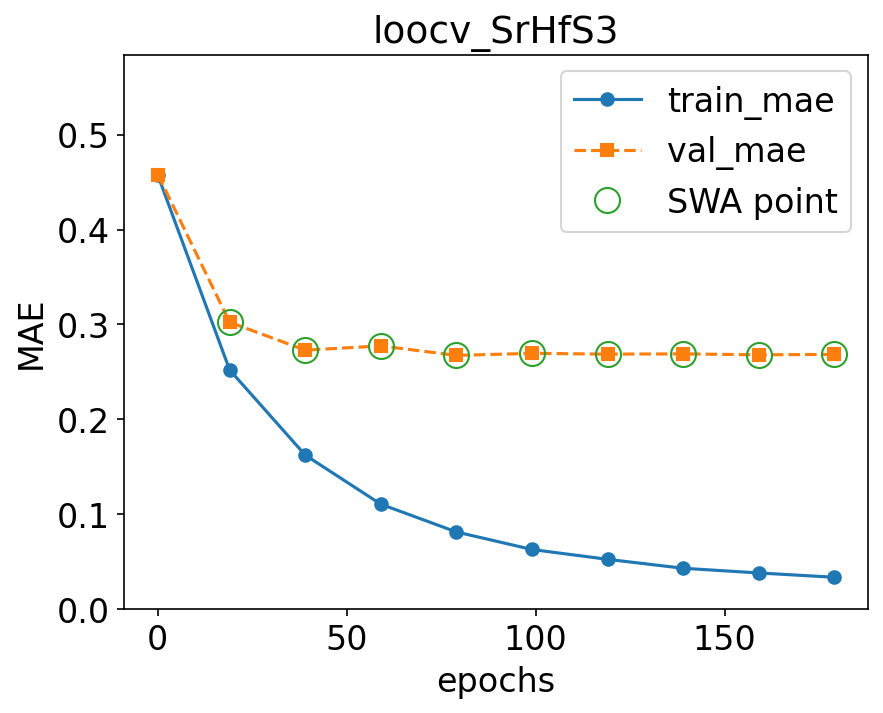

Epoch: 199/300 --- train mae: 0.0302 val mae: 0.266


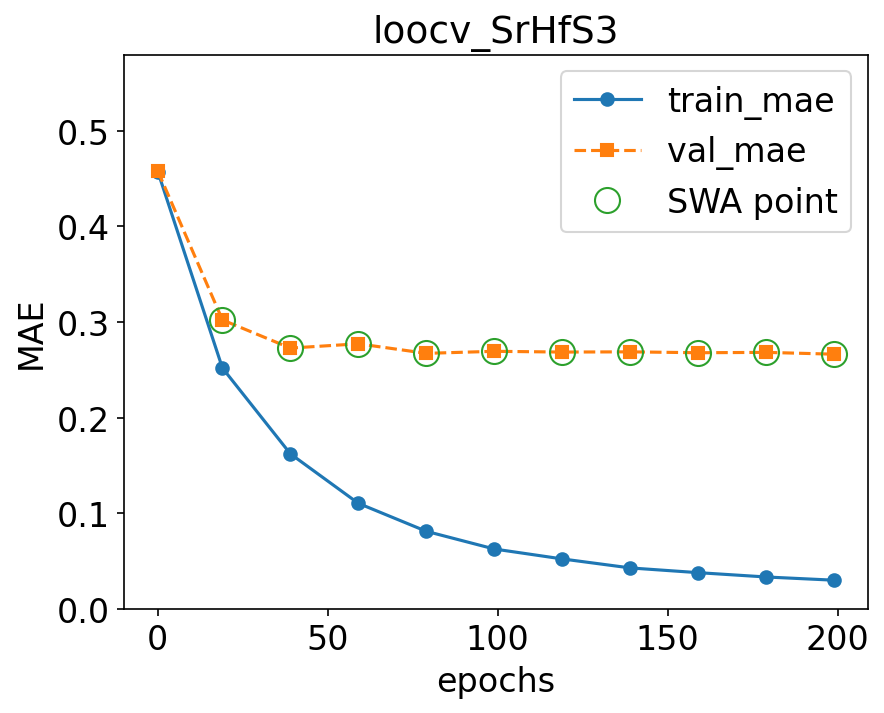

Epoch 219 failed to improve.
Discarded: 2/3 weight updates
Epoch: 219/300 --- train mae: 0.0286 val mae: 0.269


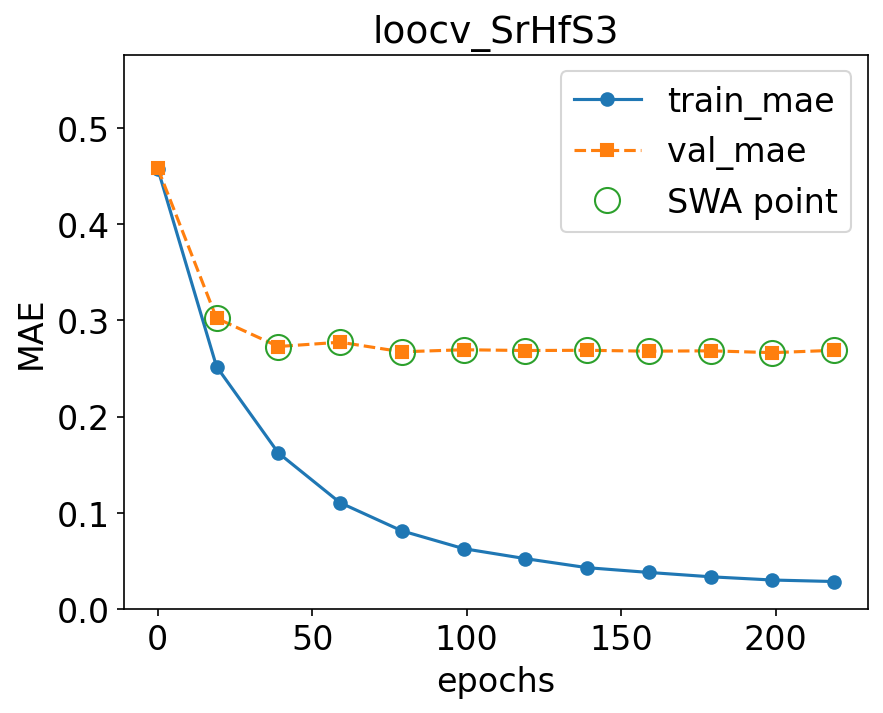

Epoch: 239/300 --- train mae: 0.0281 val mae: 0.262


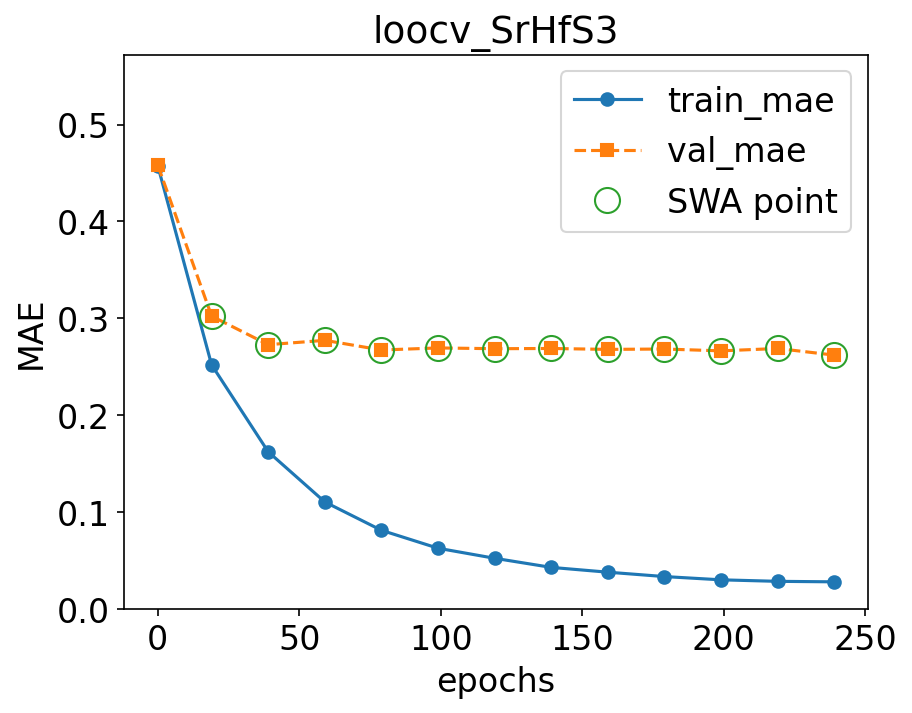

Epoch 259 failed to improve.
Discarded: 3/3 weight updates
Epoch: 259/300 --- train mae: 0.0272 val mae: 0.266


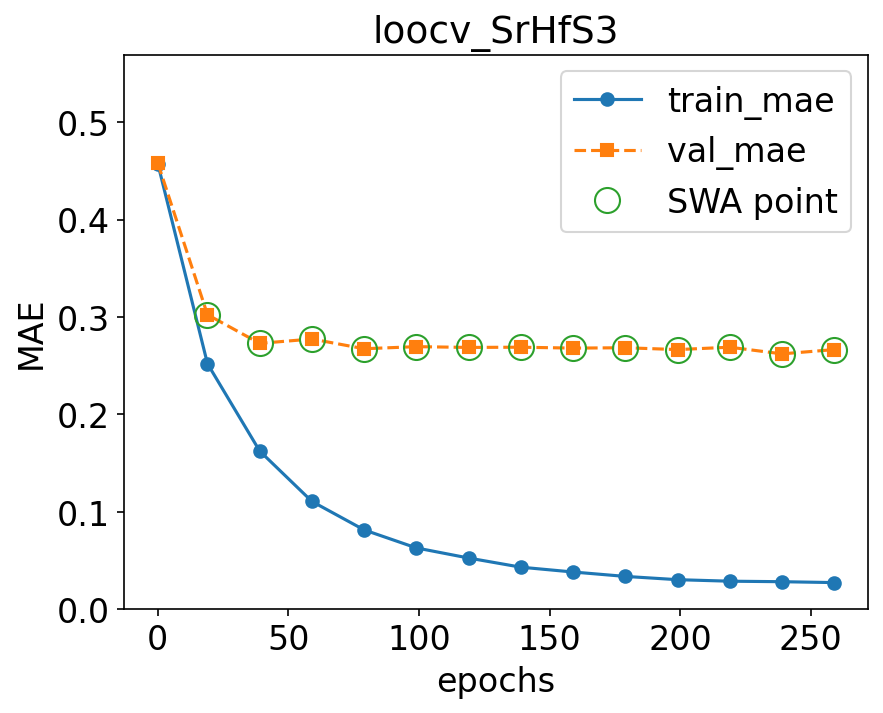

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_SrHfS3) to models/trained_models/loocv_SrHfS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9404.27formulae/s]

loading data with up to 9 elements in the formula
  Actual: 2.37 eV  |  Predicted: 1.96 ± 0.18 eV  |  Residual: -0.41 eV

--- LOOCV fold 9/9: holding out SrZrS3 ---



Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM:   0%|          | 0/2901 [00:00<?, ?formulae/s]

skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 3.0), ('Pb', 1.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1

Generating EDM: 100%|██████████| 2901/2901 [00:00<00:00, 136117.46formulae/s]


loading data with up to 9 elements in the formula
training with batchsize 256 (2**8.000)


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 145613.27formulae/s]


skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.46 val mae: 0.462


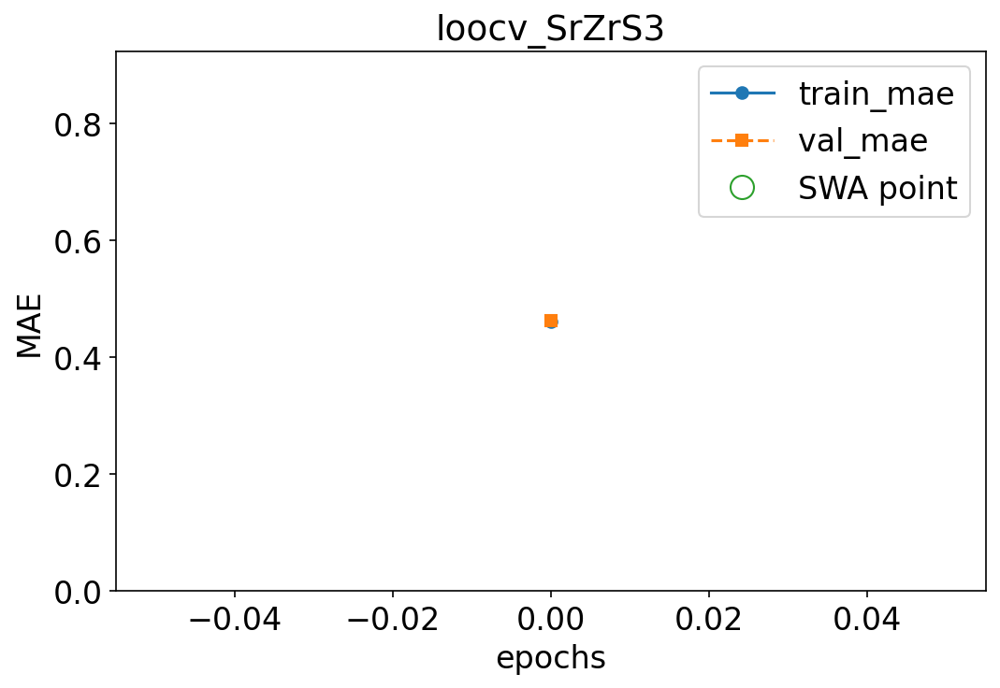

Epoch: 19/300 --- train mae: 0.245 val mae: 0.287


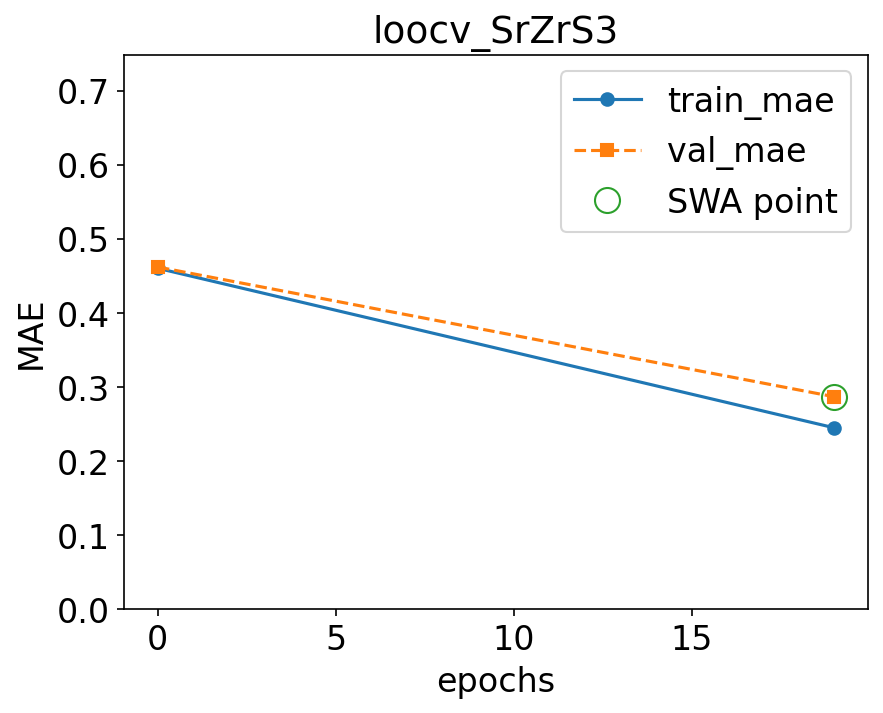

Epoch: 39/300 --- train mae: 0.161 val mae: 0.28


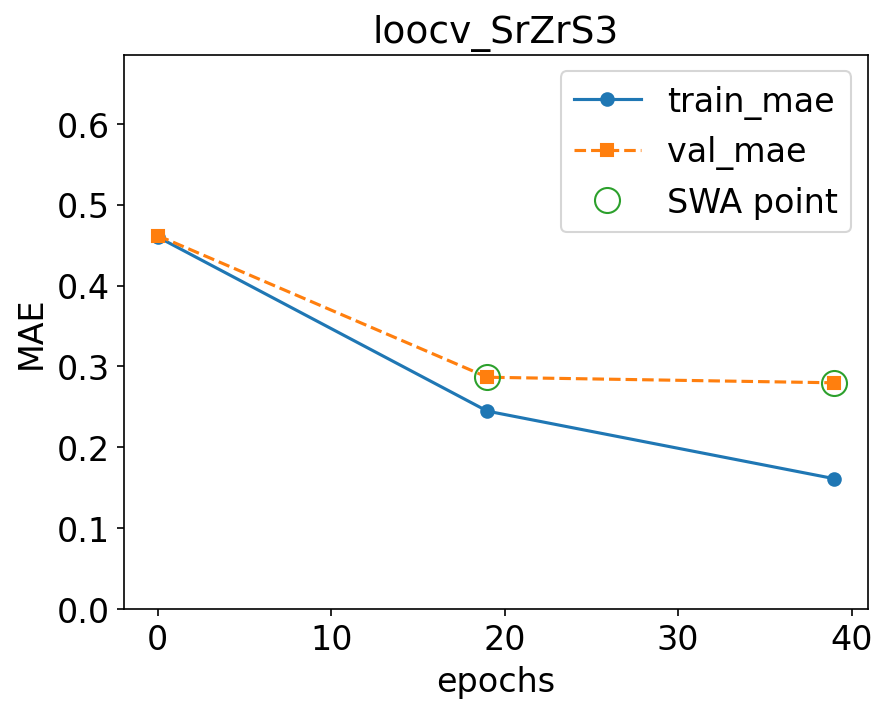

Epoch: 59/300 --- train mae: 0.109 val mae: 0.267


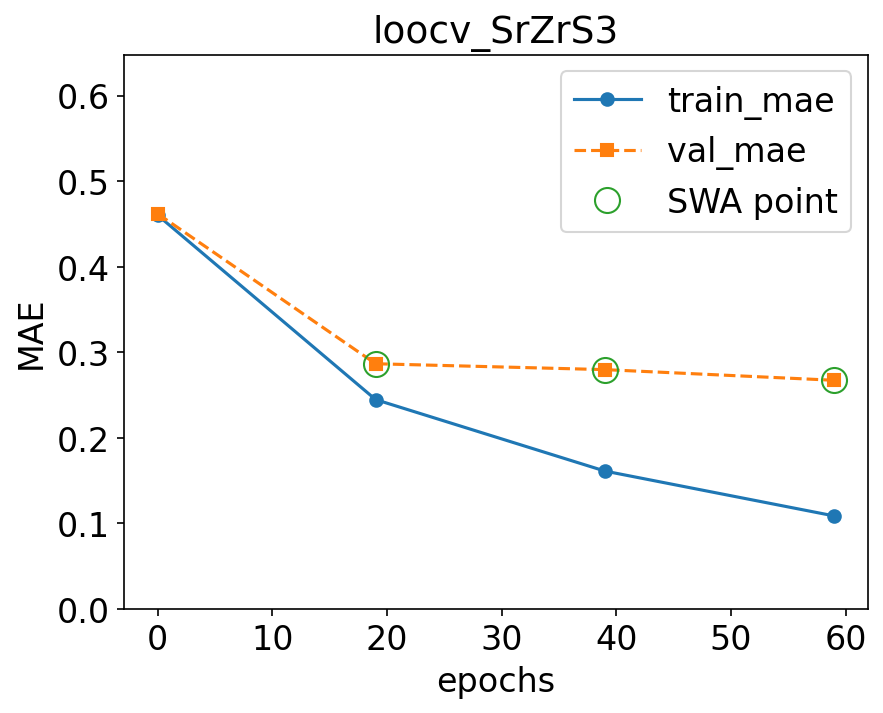

Epoch: 79/300 --- train mae: 0.0819 val mae: 0.267


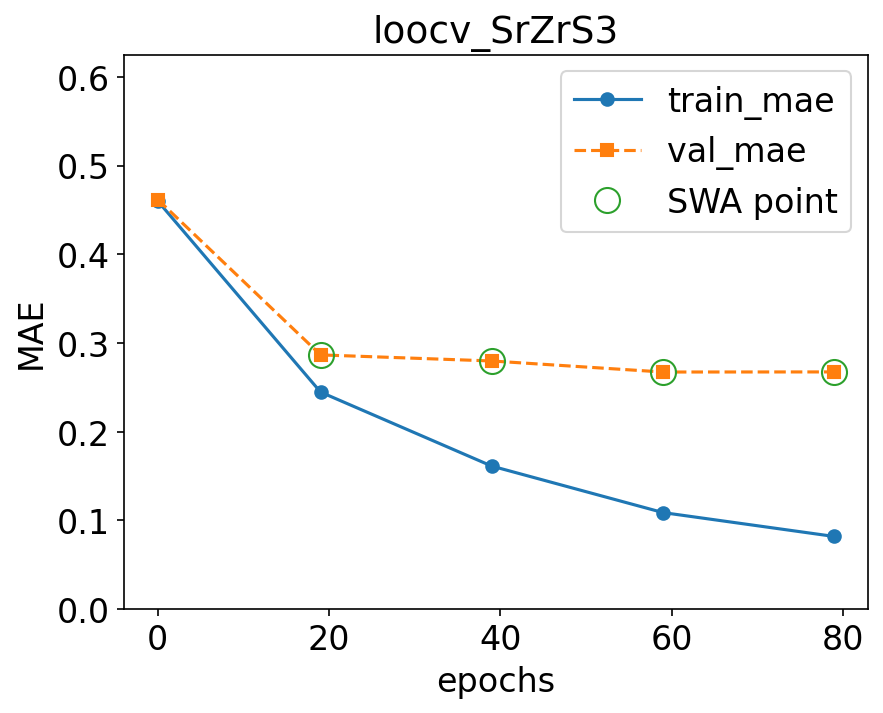

Epoch: 99/300 --- train mae: 0.0655 val mae: 0.26


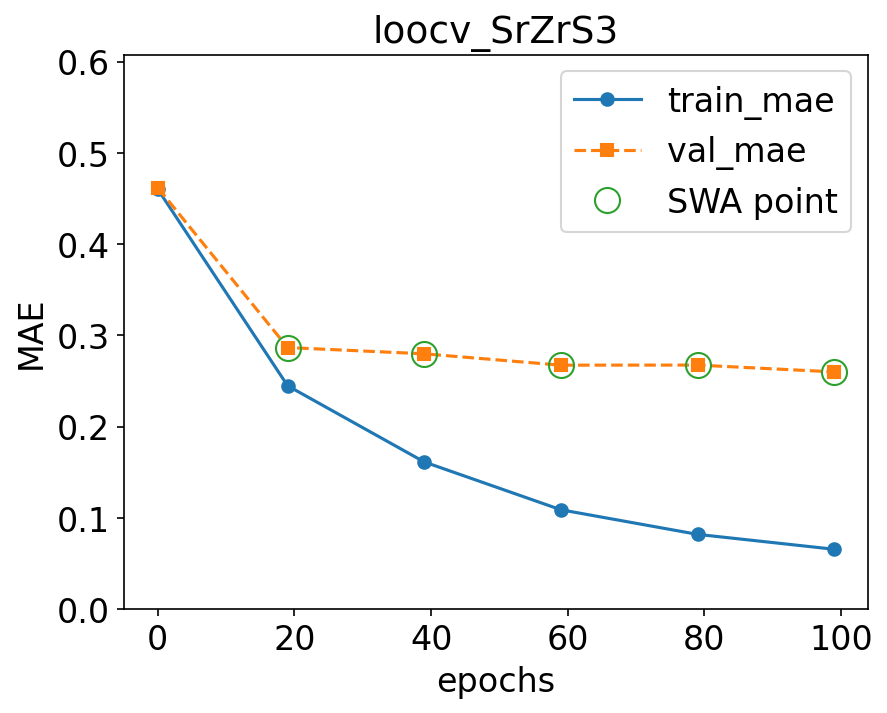

Epoch 119 failed to improve.
Discarded: 1/3 weight updates
Epoch: 119/300 --- train mae: 0.053 val mae: 0.263


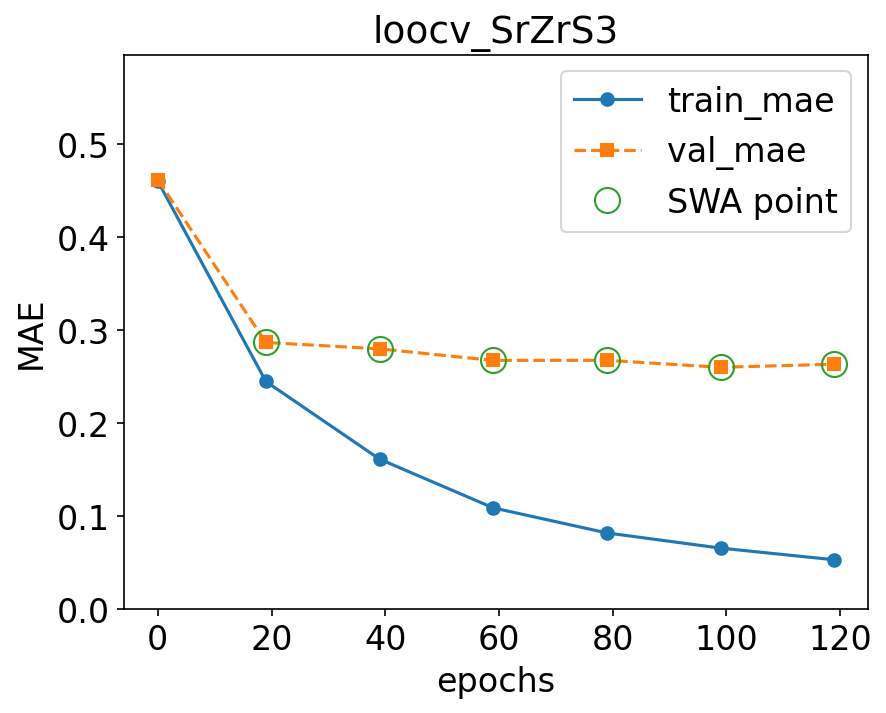

Epoch 139 failed to improve.
Discarded: 2/3 weight updates
Epoch: 139/300 --- train mae: 0.0453 val mae: 0.265


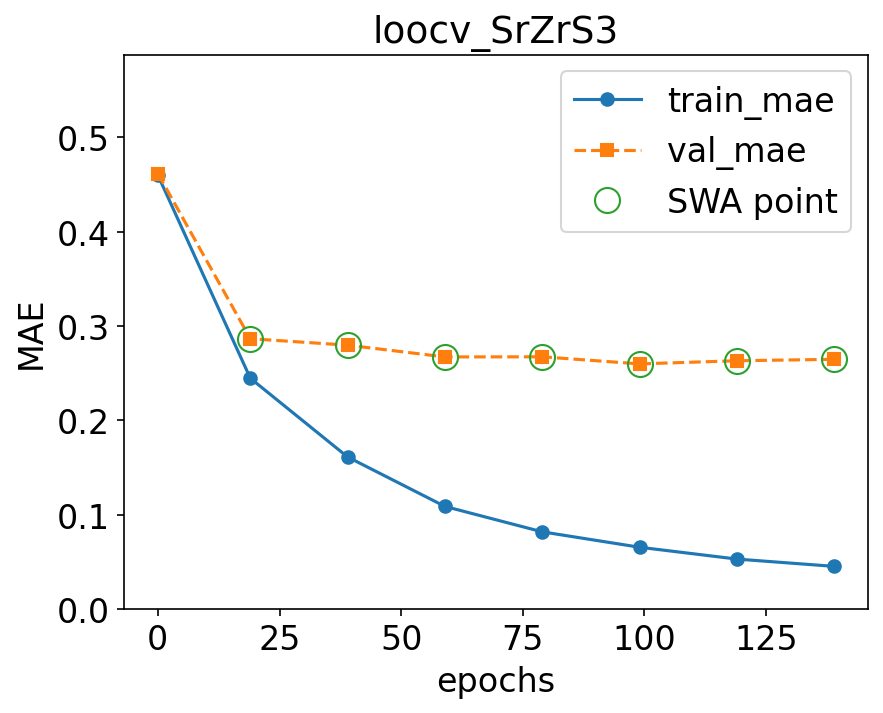

Epoch 159 failed to improve.
Discarded: 3/3 weight updates
Epoch: 159/300 --- train mae: 0.0397 val mae: 0.265


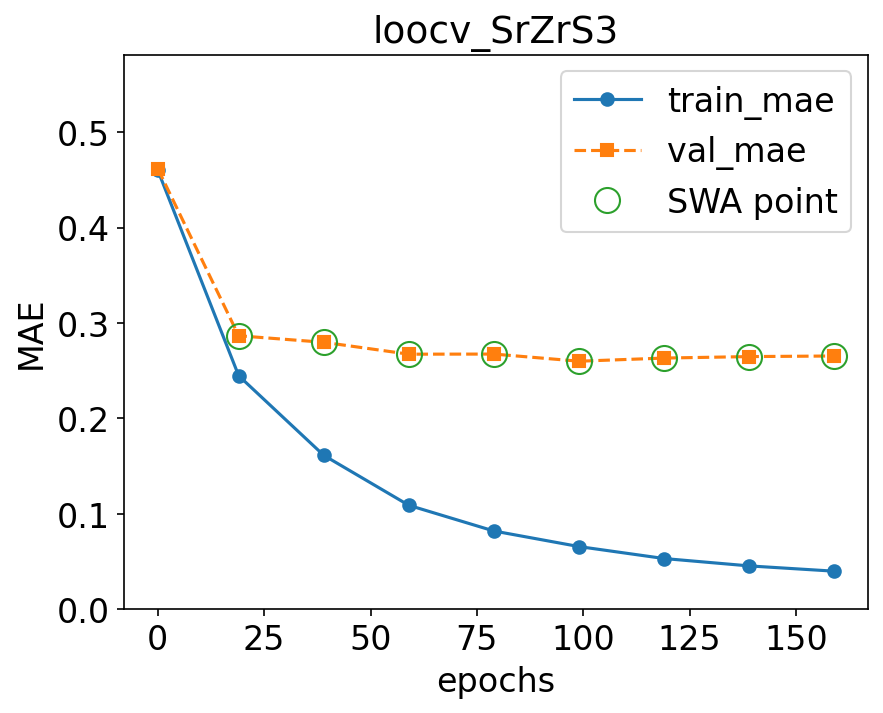

Discarded: 3/3weight updates, early-stopping now
Saving network (loocv_SrZrS3) to models/trained_models/loocv_SrZrS3.pth


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6069.90formulae/s]

loading data with up to 9 elements in the formula
  Actual: 2.09 eV  |  Predicted: 1.87 ± 0.10 eV  |  Residual: -0.23 eV

=== LOOCV complete ===
LOOCV MAE: 0.281 eV  |  R²: 0.014


,formula,actual,predicted,sigma,residual,expt_std
0,Ba(Zr0.95Ti0.05)S3,1.630,1.662004,0.061810,0.032004,0.000000
1,Ba(Zr0.96Ti0.04)S3,1.510,1.657855,0.017315,0.147855,0.000000
2,BaHfS3,2.115,1.667295,0.052854,-0.447705,0.077782
3,BaZr(S0.6Se0.4)3,1.760,1.747056,0.323452,-0.012944,0.000000
4,BaZrS3,1.855,1.777974,0.017036,-0.077026,0.082865
5,LaScS3,2.900,1.947282,0.230744,-0.952718,0.000000
6,LaYS3,2.150,1.923630,0.048117,-0.226370,0.212132
7,SrHfS3,2.365,1.957226,0.183327,-0.407774,0.063640
8,SrZrS3,2.095,1.866117,0.099051,-0.228883,0.063640


In [10]:
loocv_results = []

for i, (held_out_formula, held_out_target) in enumerate(zip(chalc_formulas, chalc_targets)):
    print(f'\n--- LOOCV fold {i+1}/{len(chalc_formulas)}: holding out {held_out_formula} ---')

    # 1. Remove the held-out compound from the grouped data
    df_fold = df_grouped[df_grouped['formula'] != held_out_formula].copy()
    df_fold_no_src = df_fold.drop(columns=['source'])

    # 2. Compute Pettifor features & split (80/10/10 on the remaining data)
    train_fold, val_fold, _, feat_names = get_petiffor_features(
        df_fold_no_src, original_df=df, train=True
    )

    # 3. Train a fresh CrabNet on this fold
    model_fold = CrabNet(
        mat_prop='bandgap',
        model_name=f'loocv_{held_out_formula.replace(" ", "_")}',
        elem_prop='mat2vec',
        learningcurve=False,
        extend_features=feat_names,
    )
    model_fold.fit(train_fold, val_fold)

    # 4. Predict the held-out compound
    pred, sigma = predict_bandgap(held_out_formula, crabnet_model=model_fold)
    pred_val  = float(pred[0])
    sigma_val = float(sigma[0])

    residual = pred_val - held_out_target
    print(f'  Actual: {held_out_target:.2f} eV  |  Predicted: {pred_val:.2f} ± {sigma_val:.2f} eV  |  Residual: {residual:+.2f} eV')

    loocv_results.append({
        'formula': held_out_formula,
        'actual': held_out_target,
        'predicted': pred_val,
        'sigma': sigma_val,
        'residual': residual,
        'expt_std': chalc_expt_std[i],
    })

loocv_df = pd.DataFrame(loocv_results)
loocv_mae = mean_absolute_error(loocv_df['actual'], loocv_df['predicted'])
loocv_r2  = r2_score(loocv_df['actual'], loocv_df['predicted'])
print(f'\n=== LOOCV complete ===')
print(f'LOOCV MAE: {loocv_mae:.3f} eV  |  R²: {loocv_r2:.3f}')
loocv_df

---
## 7. Publication Parity Plot

Combined parity plot showing:
- **Test-set** predictions (color-coded by source)
- **LOOCV** chalcogenide perovskite predictions (highlighted with error bars
  and formula labels)
  - **Vertical bars** — model prediction uncertainty (σ)
  - **Horizontal bars** — experimental measurement spread (std dev from literature)

This is the main figure for Section 3.3 of the manuscript.

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 141420.43formulae/s]


skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 295.0), ('I', 150.0), ('N', 98.0), ('Pb', 50.0), ('C', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.4226
MSE: 0.2497
MAE: 0.2477 eV


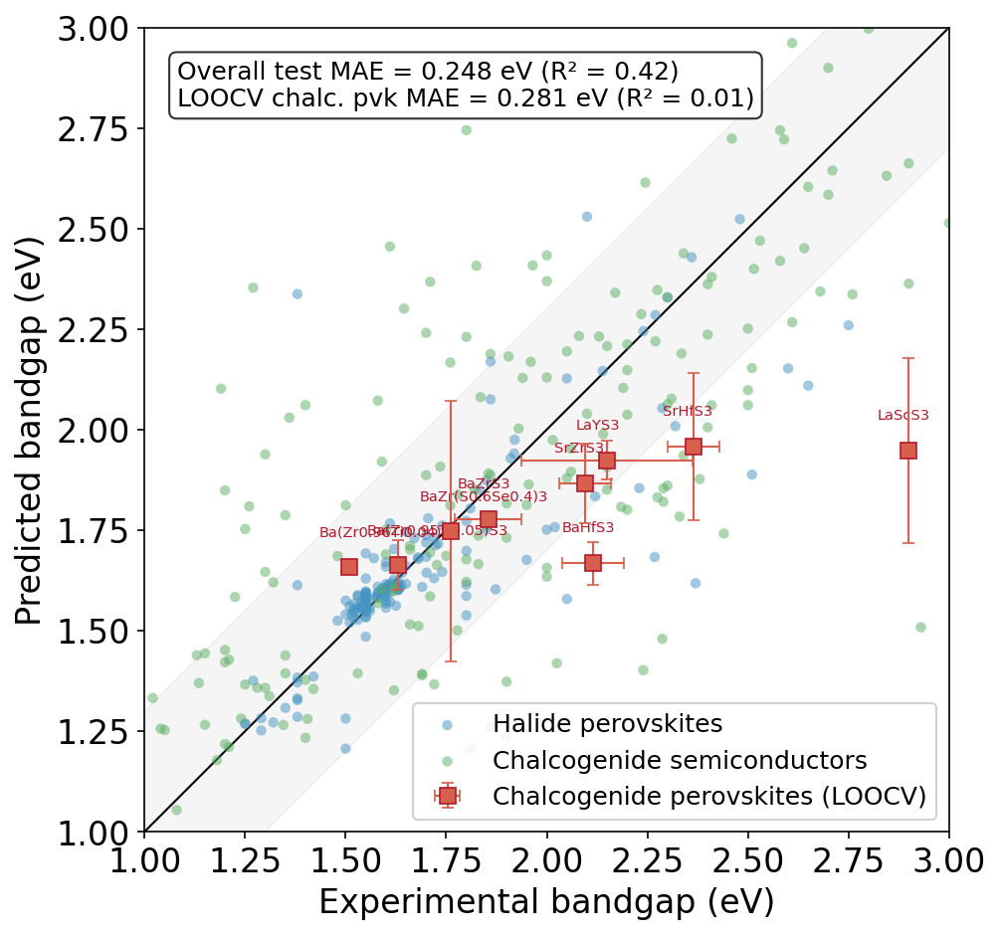

Saved to /home/dagar/TF-ChPVK-PV/reports/figures/parity_bandgap.pdf


In [11]:
# --- Gather test-set predictions by source ---
test_metrics = test_r2_score(test_df, feature_names, crabnet_bandgap=crabnet_bg, plot=False)

# Re-tag test-set entries with source
test_plot = test_df[['formula', 'target']].copy()
test_plot['predicted'] = test_metrics['predicted']
for formula in test_plot['formula']:
    test_plot.loc[test_plot['formula'] == formula, 'source'] = (
        df.loc[df['formula'] == formula, 'source'].values[0]
    )

# --- Build the plot ---
fig, ax = plt.subplots(figsize=(7, 7))

# Diagonal & ±0.3 eV band
lims = [1, 3.0]
ax.plot(lims, lims, 'k-', lw=1.0, zorder=1)
ax.fill_between(lims, [l - 0.3 for l in lims], [l + 0.3 for l in lims],
                alpha=0.08, color='grey', zorder=0)

# Color map for sources
source_style = {
    'pvk':          {'color': '#4393c3', 'label': 'Halide perovskites',       'marker': 'o', 's': 25, 'alpha': 0.5},
    'chalc_semicon': {'color': '#5aae61', 'label': 'Chalcogenide semiconductors', 'marker': 'o', 's': 25, 'alpha': 0.5},
}

for src, style in source_style.items():
    mask = test_plot['source'] == src
    ax.scatter(test_plot.loc[mask, 'target'], test_plot.loc[mask, 'predicted'],
               c=style['color'], marker=style['marker'], s=style['s'],
               alpha=style['alpha'], label=style['label'], edgecolors='none', zorder=2)

# LOOCV chalcogenide perovskites — larger, with both vertical (model σ) and
# horizontal (experimental std dev) error bars
ax.errorbar(
    loocv_df['actual'], loocv_df['predicted'],
    xerr=loocv_df['expt_std'],
    yerr=loocv_df['sigma'],
    fmt='s', color='#d6604d', markeredgecolor='#b2182b', markeredgewidth=0.8,
    markersize=8, elinewidth=1.0, capsize=3,
    label=f'Chalcogenide perovskites (LOOCV)', zorder=4,
)

# Formula labels for chalcogenide perovskites
for _, row in loocv_df.iterrows():
    ax.annotate(
        row['formula'], (row['actual'], row['predicted']),
        textcoords='offset points', xytext=(-15, 15),
        fontsize=7, color='#b2182b',
    )

# Annotations
test_mae = test_metrics['mae']
test_r2  = test_metrics['r2']
txt  = f'Overall test MAE = {test_mae:.3f} eV (R² = {test_r2:.2f})\n'
txt += f'LOOCV chalc. pvk MAE = {loocv_mae:.3f} eV (R² = {loocv_r2:.2f})'
ax.text(0.04, 0.96, txt, transform=ax.transAxes, va='top', fontsize=12,
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

ax.set_xlabel('Experimental bandgap (eV)')
ax.set_ylabel('Predicted bandgap (eV)')
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.set_aspect('equal')
ax.legend(loc='lower right', fontsize=12, framealpha=0.9)

fig.savefig(FIGURES_DIR / 'parity_bandgap.pdf')
fig.savefig(FIGURES_DIR / 'parity_bandgap.png')
plt.show()
print(f'Saved to {FIGURES_DIR / "parity_bandgap.pdf"}')

---
## 8. Null-Model Baselines

We compare the CrabNet predictions against trivial baselines (median and
mean predictor) to verify the model adds value beyond simple statistics.

In [12]:
from sklearn.metrics import mean_absolute_error as _mae

null_rows = []

# Test set
for strategy, fn in [('median', np.median), ('mean', np.mean)]:
    yhat = np.full(len(test_df), fn(test_df['target']))
    null_rows.append({'subset': 'test', 'strategy': strategy,
                      'MAE (eV)': _mae(test_df['target'], yhat)})
null_rows.append({'subset': 'test', 'strategy': 'CrabNet',
                  'MAE (eV)': test_metrics['mae']})

# Chalcogenide perovskites (LOOCV)
chalc_actual = loocv_df['actual'].values
for strategy, fn in [('median', np.median), ('mean', np.mean)]:
    yhat = np.full(len(chalc_actual), fn(chalc_actual))
    null_rows.append({'subset': 'chalc pvk (LOOCV)', 'strategy': strategy,
                      'MAE (eV)': _mae(chalc_actual, yhat)})
null_rows.append({'subset': 'chalc pvk (LOOCV)', 'strategy': 'CrabNet LOOCV',
                  'MAE (eV)': loocv_mae})

null_table = pd.DataFrame(null_rows)
null_table.style.format({'MAE (eV)': '{:.3f}'})

,subset,strategy,MAE (eV)
0,test,median,0.443
1,test,mean,0.472
2,test,CrabNet,0.248
3,chalc pvk (LOOCV),median,0.308
4,chalc pvk (LOOCV),mean,0.314
5,chalc pvk (LOOCV),CrabNet LOOCV,0.281


---
## 9. Ablation Studies — Data-Source Contribution

We train three ablation models to quantify the contribution of each data
source:

| Ablation | Training data |
|----------|---------------|
| `no_chalcogenides` | Halide perovskites + chalcogenide semiconductors |
| `halide_only` | Halide perovskites only |
| `chalc_semicon_only` | Chalcogenide semiconductors only |

After training each ablation model, we evaluate it on the **full set of 11
chalcogenide perovskite formulas** (not LOOCV — these are quick comparisons)
and on its own test split.


Ablation: no_chalcogenides
  Train: 2893  Val: 362  Test: 362

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM:   0%|          | 0/2893 [00:00<?, ?formulae/s]

skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 344.0), ('I', 150.0), ('B', 50.0), ('Pb', 50.0), ('C', 49.0), ('N', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 38.0), ('I', 15.0), ('C', 9.0), ('N', 5.0),

Generating EDM: 100%|██████████| 2893/2893 [00:00<00:00, 131181.11formulae/s]


loading data with up to 9 elements in the formula
training with batchsize 128 (2**7.000)


Generating EDM: 100%|██████████| 362/362 [00:00<00:00, 207991.51formulae/s]


skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 295.0), ('I', 150.0), ('N', 98.0), ('Pb', 50.0), ('C', 49.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 230 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.448 val mae: 0.419


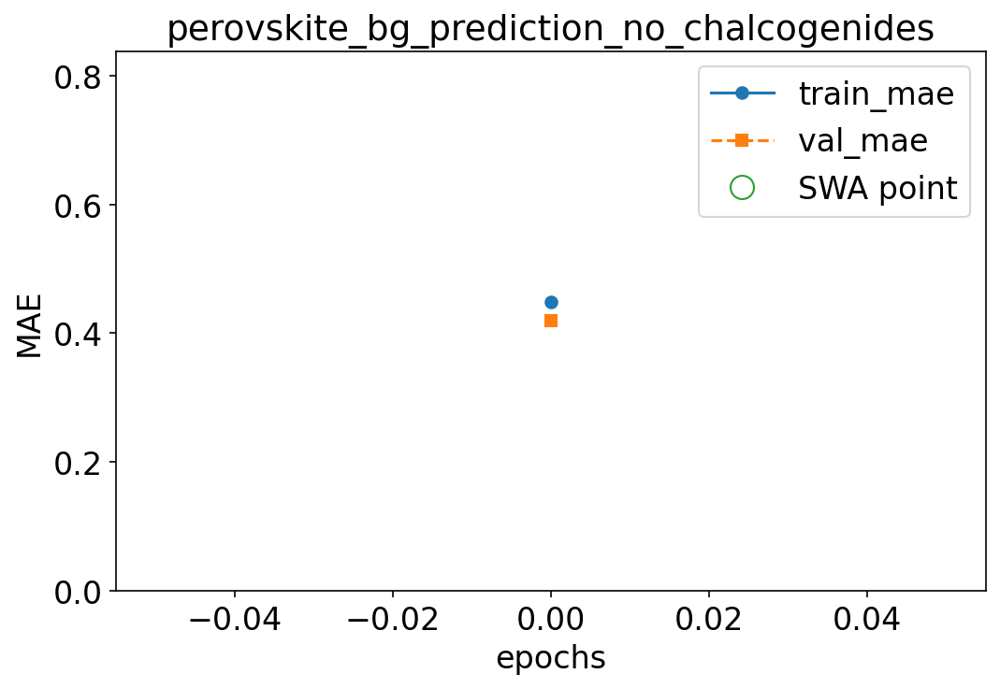

Epoch: 19/300 --- train mae: 0.193 val mae: 0.285


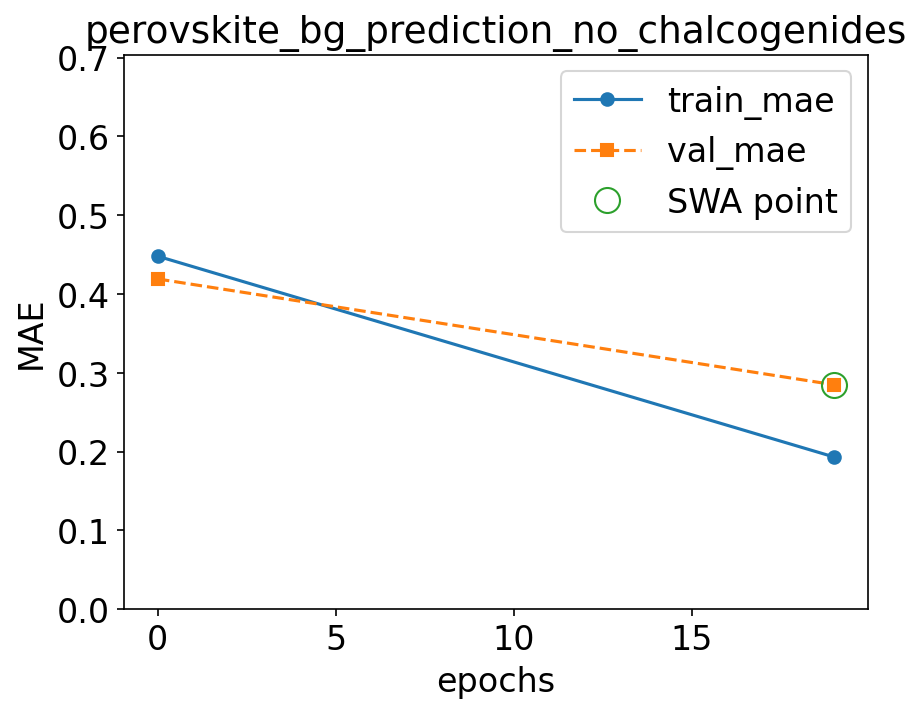

Epoch: 39/300 --- train mae: 0.117 val mae: 0.255


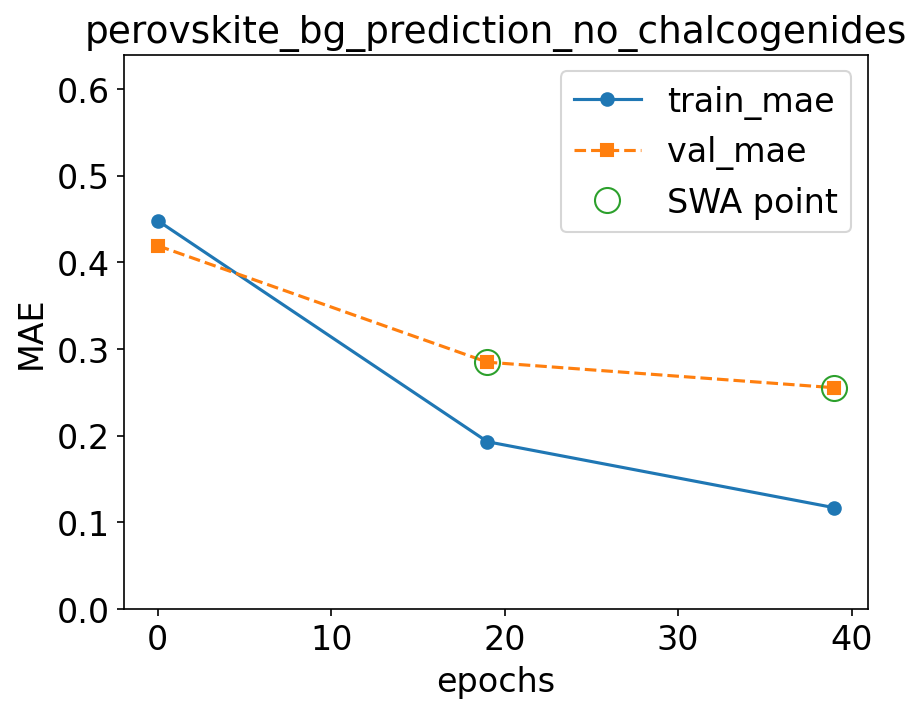

Epoch: 59/300 --- train mae: 0.0759 val mae: 0.252


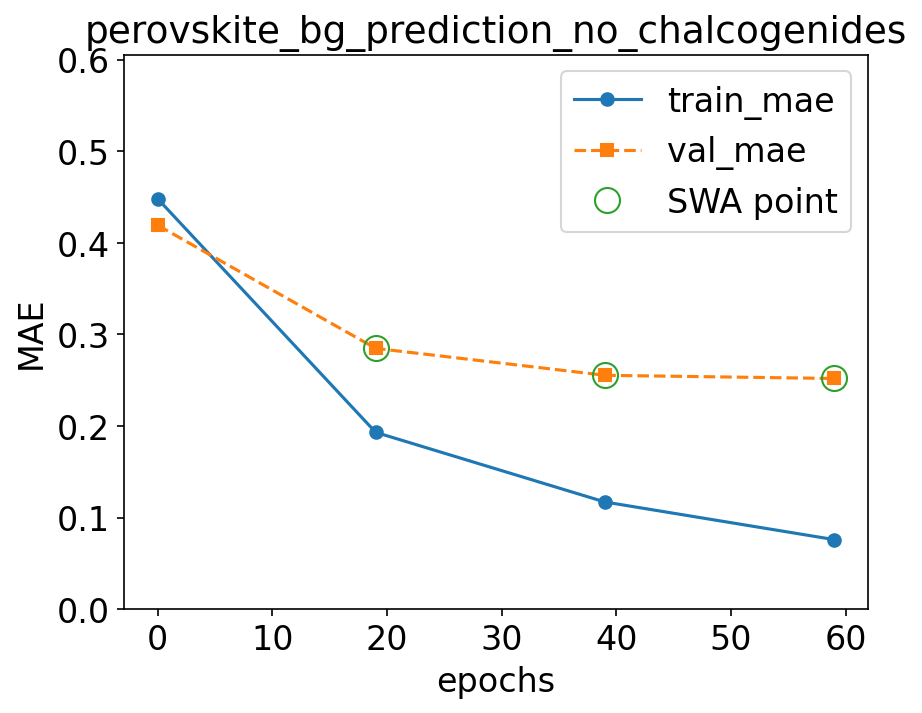

Epoch 79 failed to improve.
Discarded: 1/3 weight updates
Epoch: 79/300 --- train mae: 0.0542 val mae: 0.254


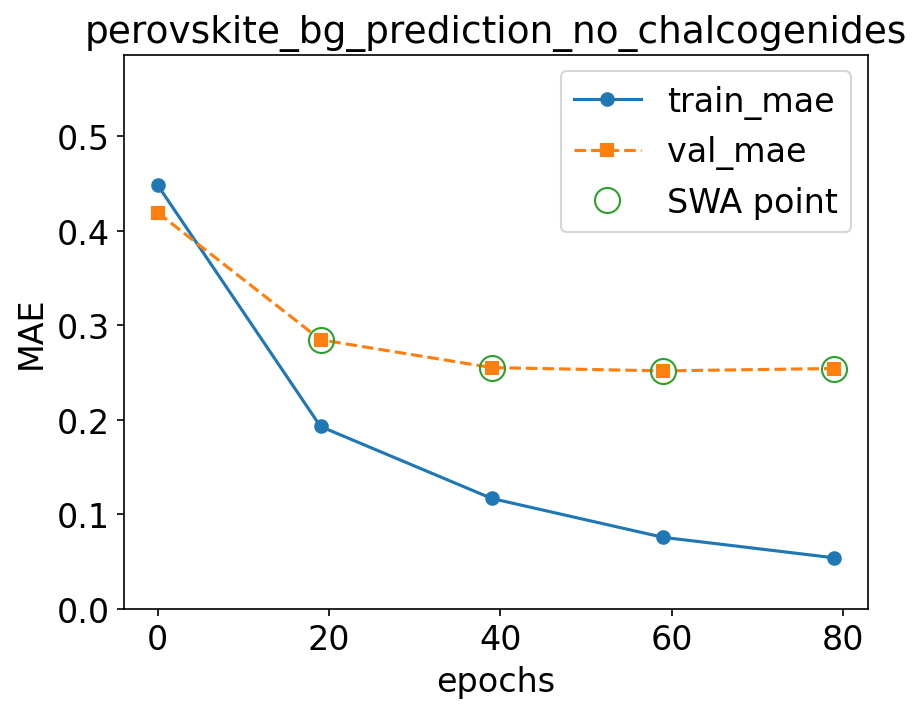

Epoch 99 failed to improve.
Discarded: 2/3 weight updates
Epoch: 99/300 --- train mae: 0.0429 val mae: 0.255


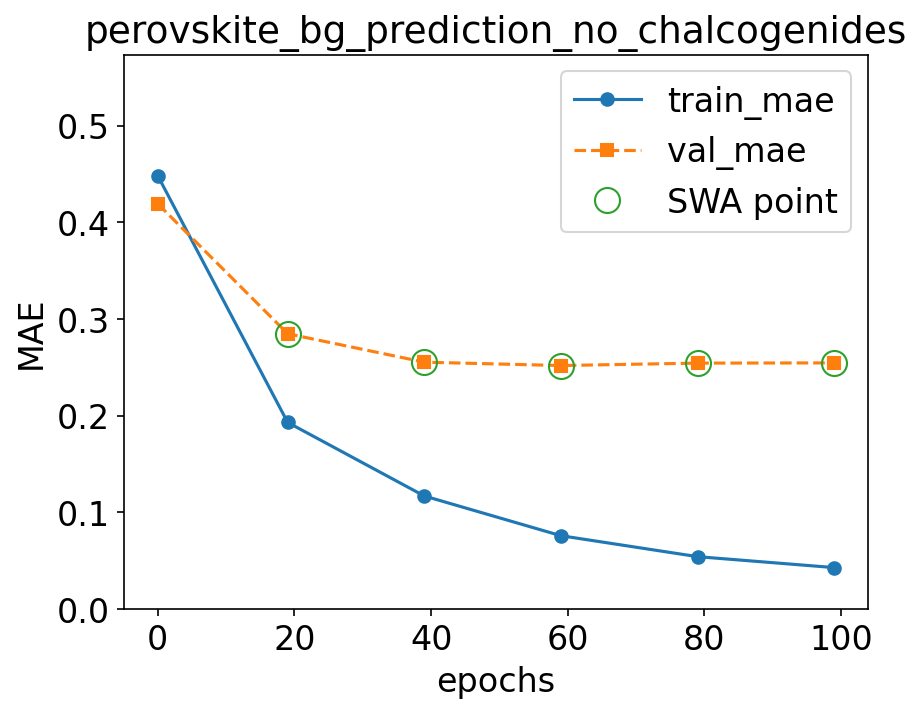

Epoch 119 failed to improve.
Discarded: 3/3 weight updates
Epoch: 119/300 --- train mae: 0.0369 val mae: 0.259


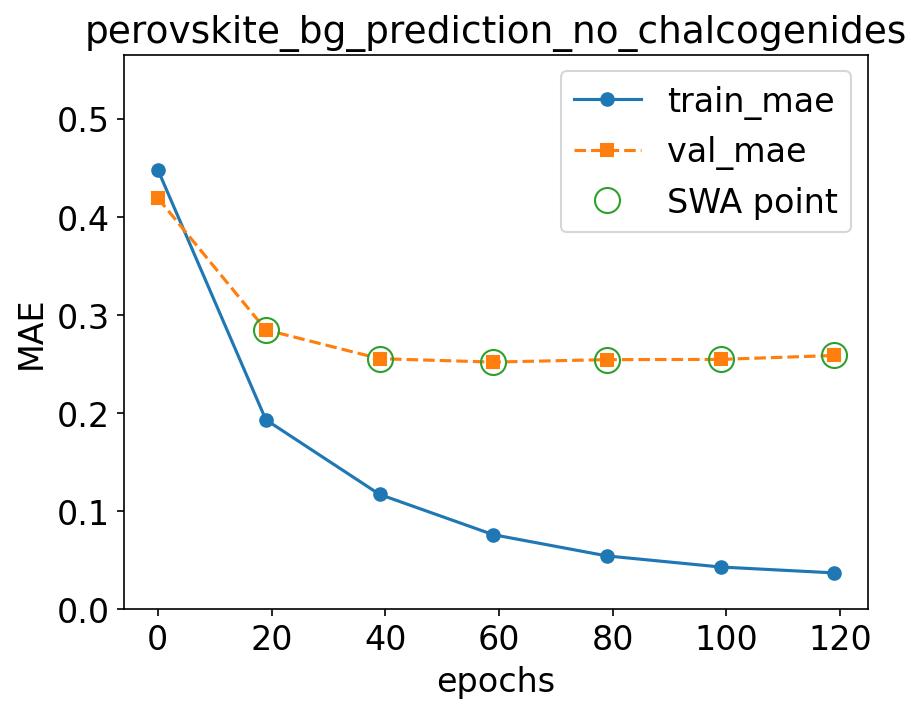

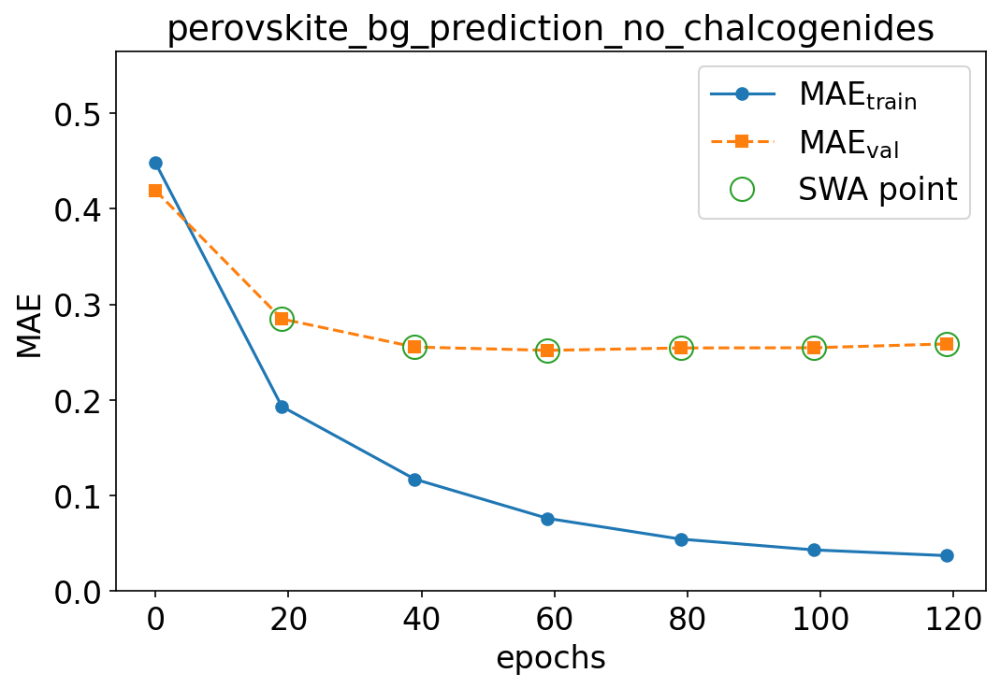

Discarded: 3/3weight updates, early-stopping now
Saving network (perovskite_bg_prediction_no_chalcogenides) to models/trained_models/perovskite_bg_prediction_no_chalcogenides.pth


Generating EDM: 100%|██████████| 362/362 [00:00<00:00, 183507.14formulae/s]


skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 6.0), ('I', 3.0), ('P', 2.0), ('C', 1.0), ('N', 1.0), ('Pb', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.5499
MSE: 0.2008
MAE: 0.2553 eV


Generating EDM: 100%|██████████| 11/11 [00:00<00:00, 97336.17formulae/s]

loading data with up to 9 elements in the formula
R2 score: -1.0072
MSE: 0.3517
MAE: 0.4664 eV

Ablation: halide_only


  Train: 1263  Val: 158  Test: 158

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 1263/1263 [00:00<00:00, 125352.72formulae/s]


skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 95.0), ('N', 38.0), ('C', 19.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 5.0), ('I', 3.0), ('N', 2.0), ('C', 1.0), ('Sn', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 10.0), ('C', 6.0), ('N', 3.0), ('Pb', 3.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 38.0), ('I', 15.0), ('C', 9.0), ('N', 5.0), ('Pb', 5.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 6.0), ('I', 3.0), ('P', 2.0)

Generating EDM: 100%|██████████| 158/158 [00:00<00:00, 118149.41formulae/s]

skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 100 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.198 val mae: 0.174


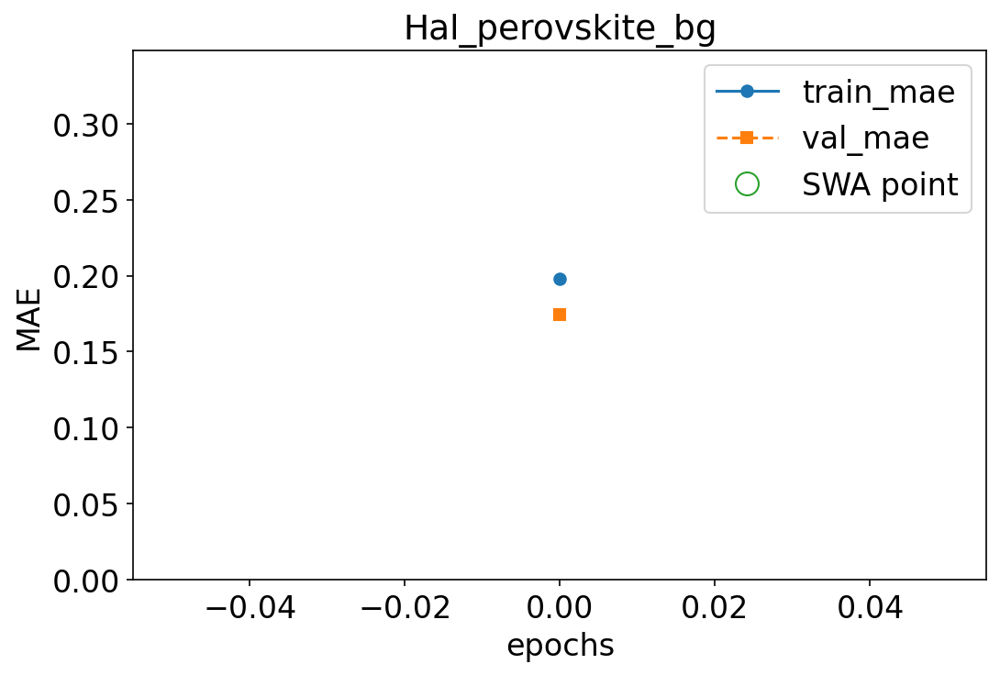

Epoch: 19/300 --- train mae: 0.0782 val mae: 0.08


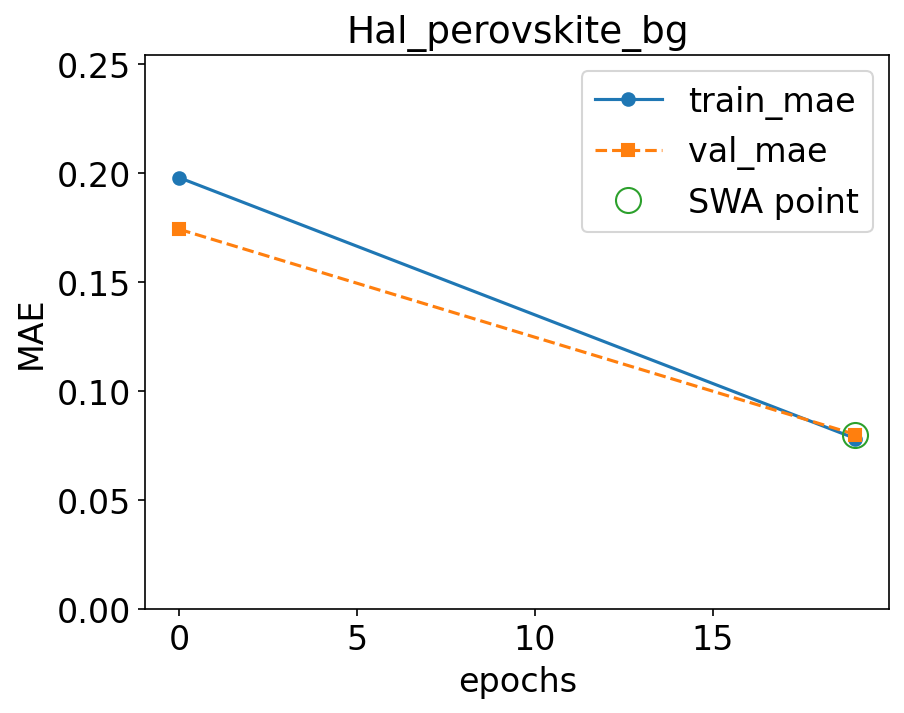

Epoch 39 failed to improve.
Discarded: 1/3 weight updates
Epoch: 39/300 --- train mae: 0.0425 val mae: 0.0819


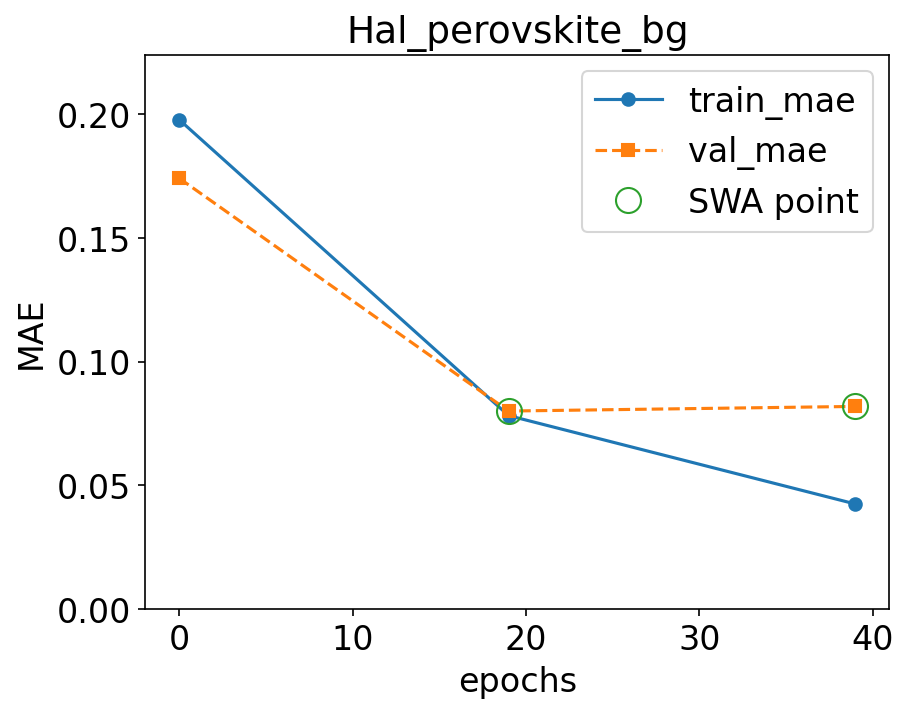

Epoch 59 failed to improve.
Discarded: 2/3 weight updates
Epoch: 59/300 --- train mae: 0.029 val mae: 0.0883


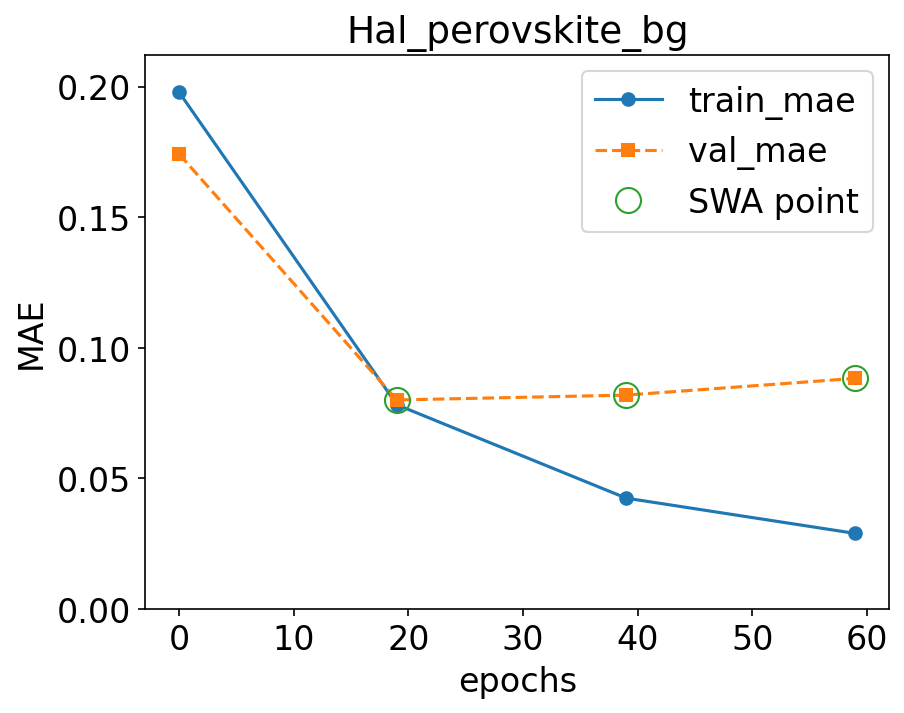

Epoch 79 failed to improve.
Discarded: 3/3 weight updates
Epoch: 79/300 --- train mae: 0.0235 val mae: 0.0876


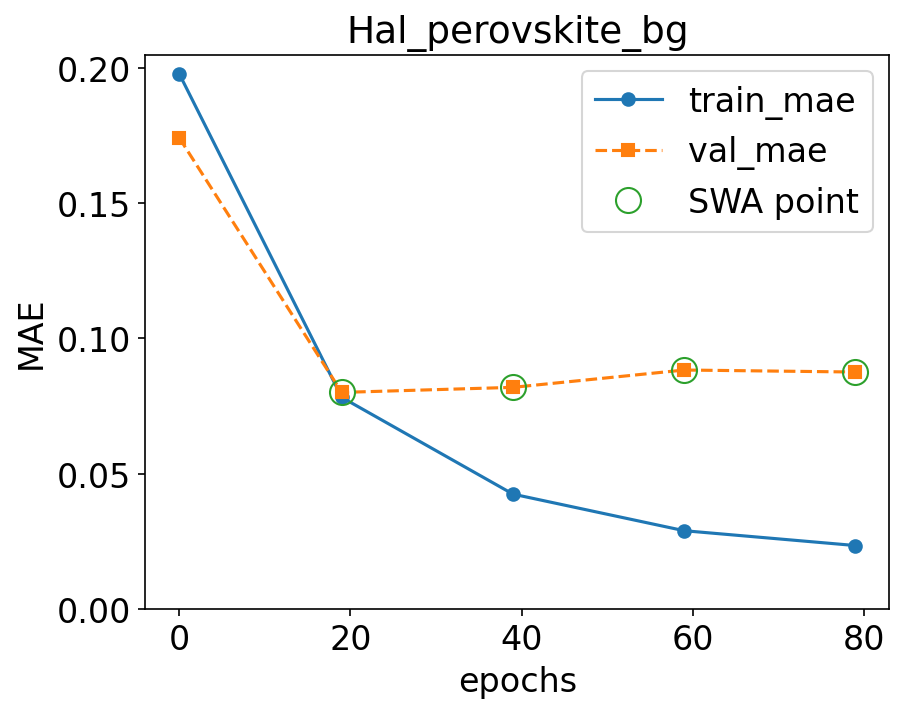

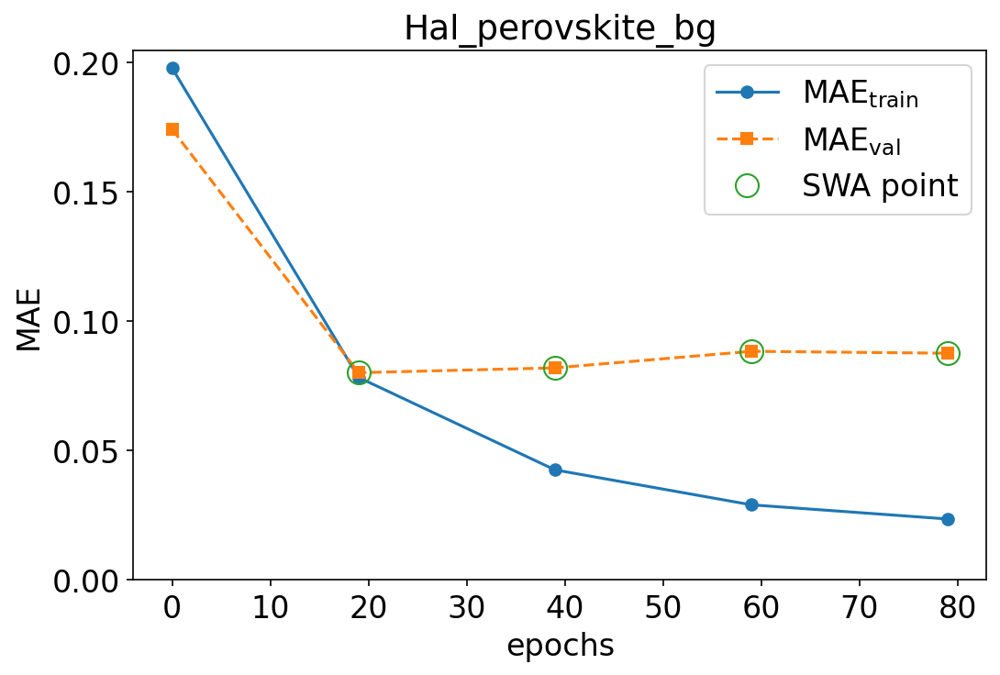

Discarded: 3/3weight updates, early-stopping now
Saving network (Hal_perovskite_bg) to models/trained_models/Hal_perovskite_bg.pth


Generating EDM: 100%|██████████| 158/158 [00:00<00:00, 161240.88formulae/s]


skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 344.0), ('I', 150.0), ('B', 50.0), ('Pb', 50.0), ('C', 49.0), ('N', 49.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.4057
MSE: 0.0445
MAE: 0.1029 eV


Generating EDM: 100%|██████████| 11/11 [00:00<00:00, 33775.51formulae/s]

loading data with up to 9 elements in the formula
R2 score: 0.0133
MSE: 0.1729
MAE: 0.3268 eV

Ablation: chalc_semicon_only


  Train: 1630  Val: 204  Test: 204

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 1630/1630 [00:00<00:00, 217778.34formulae/s]


loading data with up to 6 elements in the formula
training with batchsize 128 (2**7.000)


Generating EDM: 100%|██████████| 204/204 [00:00<00:00, 237677.23formulae/s]


loading data with up to 6 elements in the formula
stepping every 130 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler
Epoch: 0/300 --- train mae: 0.554 val mae: 0.533


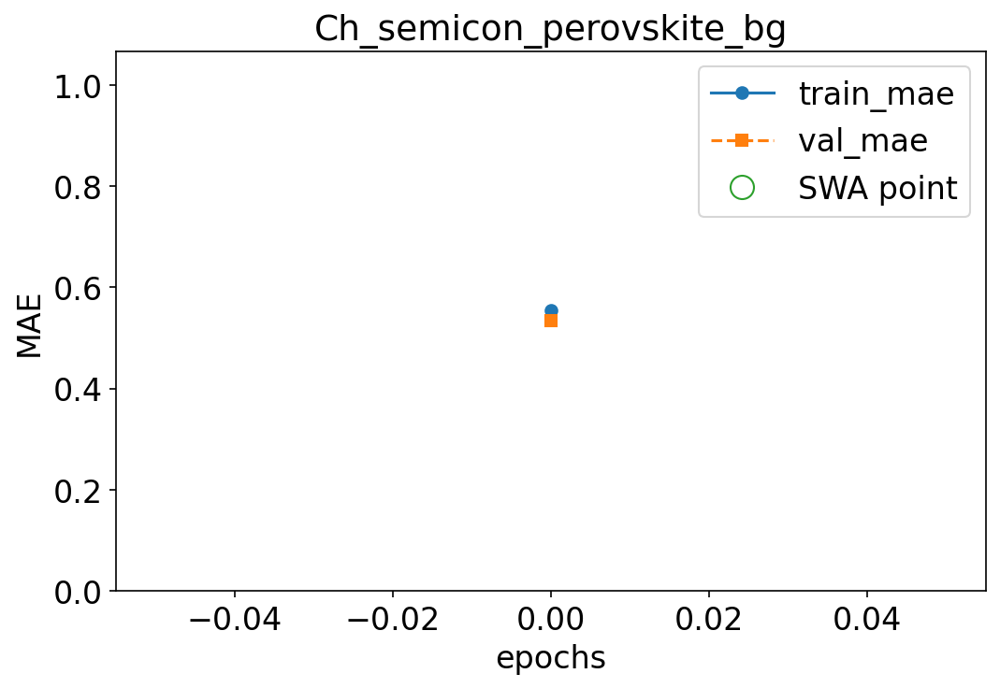

Epoch: 19/300 --- train mae: 0.293 val mae: 0.376


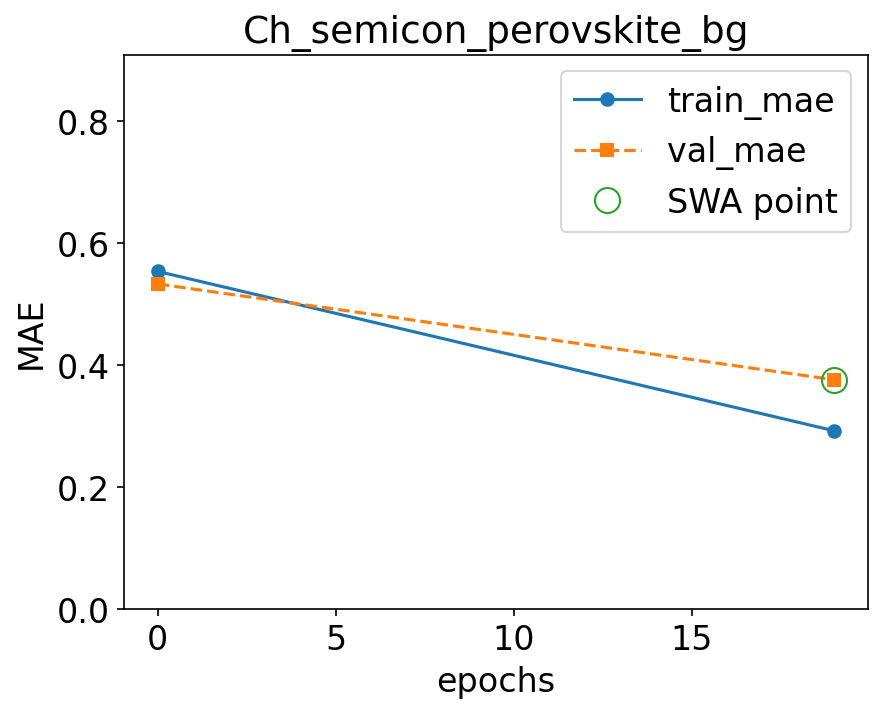

Epoch 39 failed to improve.
Discarded: 1/3 weight updates
Epoch: 39/300 --- train mae: 0.175 val mae: 0.393


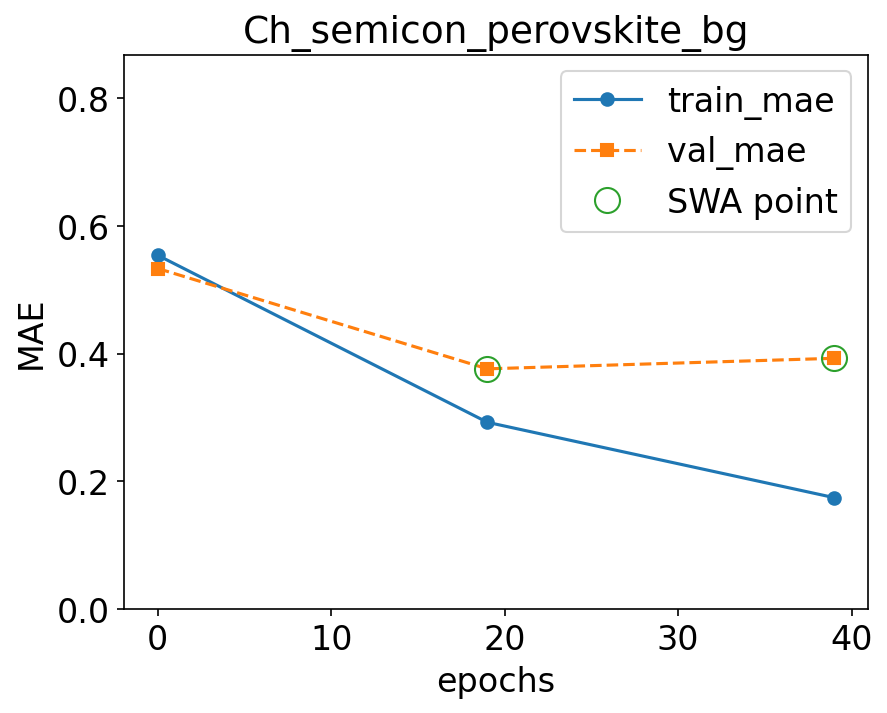

Epoch 59 failed to improve.
Discarded: 2/3 weight updates
Epoch: 59/300 --- train mae: 0.112 val mae: 0.392


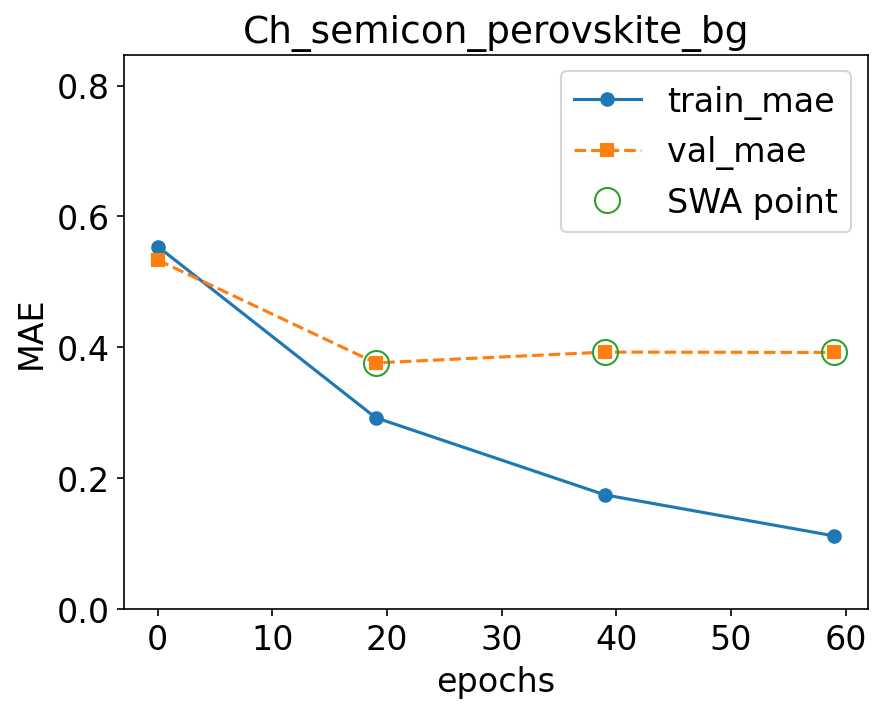

Epoch 79 failed to improve.
Discarded: 3/3 weight updates
Epoch: 79/300 --- train mae: 0.0801 val mae: 0.393


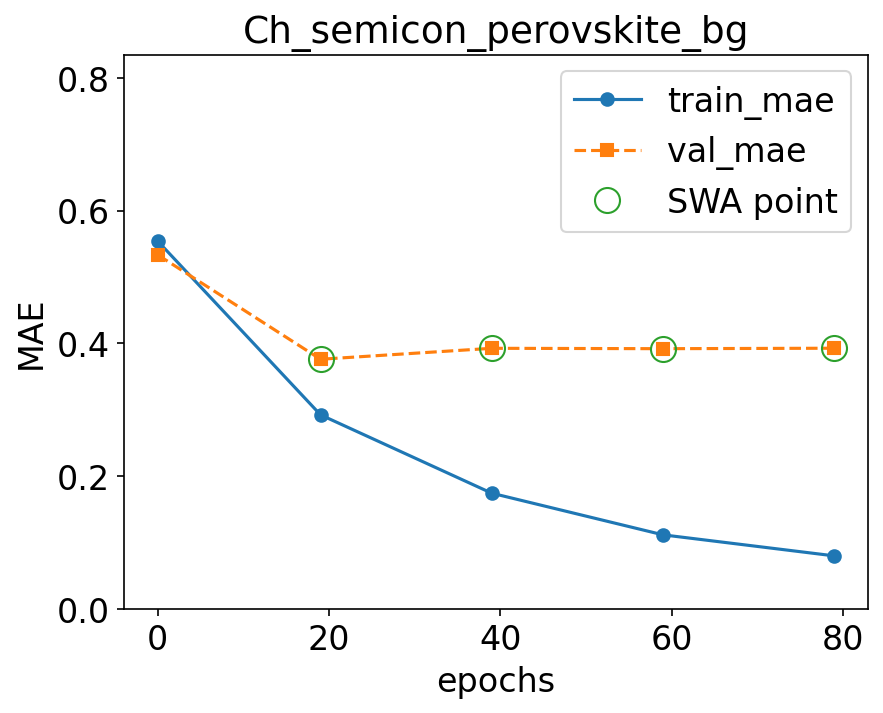

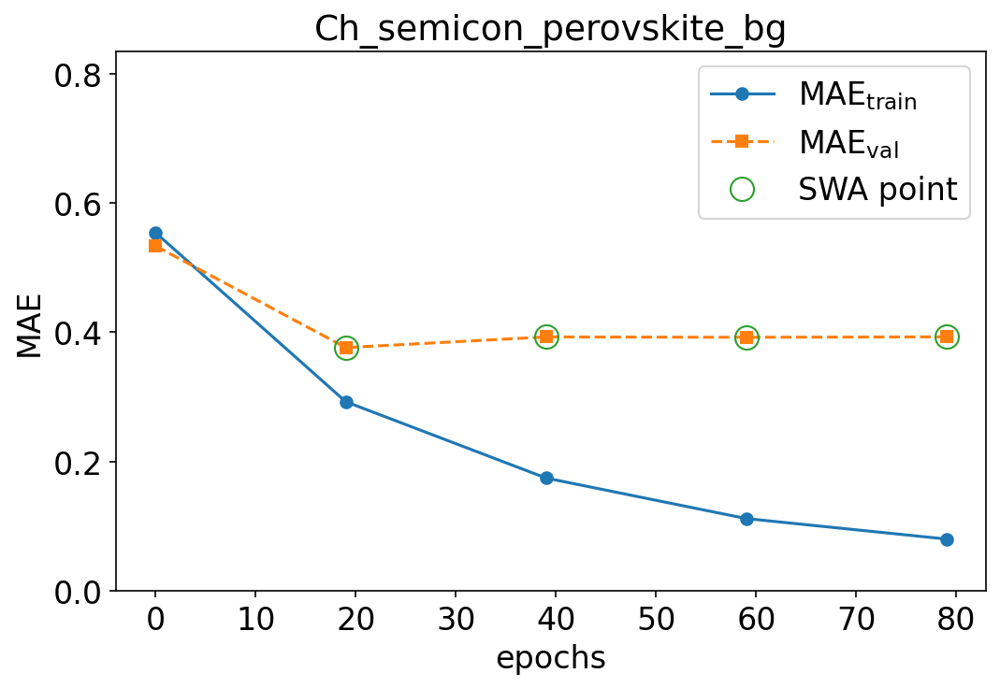

Discarded: 3/3weight updates, early-stopping now
Saving network (Ch_semicon_perovskite_bg) to models/trained_models/Ch_semicon_perovskite_bg.pth


Generating EDM: 100%|██████████| 204/204 [00:00<00:00, 283323.85formulae/s]


loading data with up to 6 elements in the formula
R2 score: 0.2901
MSE: 0.3853
MAE: 0.4304 eV


Generating EDM: 100%|██████████| 11/11 [00:00<00:00, 49186.93formulae/s]

loading data with up to 6 elements in the formula
R2 score: -0.2086
MSE: 0.2118
MAE: 0.3266 eV


,ablation,n_train,test MAE (eV),test R²,chalc pvk MAE (eV),chalc pvk R²
0,no_chalcogenides,2893,0.255,0.550,0.466,-1.007
1,halide_only,1263,0.103,0.406,0.327,0.013
2,chalc_semicon_only,1630,0.430,0.290,0.327,-0.209


In [13]:
# Prepare chalcogenide perovskite evaluation set (all 11 formulas, with Pettifor features)
df_chalc_all = df_grouped[df_grouped['source'] == 'chalcogenides'].copy()
df_chalc_all_no_src = df_chalc_all.drop(columns=['source'])
df_chalc_eval = get_petiffor_features(df_chalc_all_no_src, original_df=df, train=False)

ablations = {
    'no_chalcogenides':  {'filter': lambda d: d[d['source'] != 'chalcogenides'],
                          'model_name': 'perovskite_bg_prediction_no_chalcogenides'},
    'halide_only':       {'filter': lambda d: d[d['source'] == 'pvk'],
                          'model_name': 'Hal_perovskite_bg'},
    'chalc_semicon_only':{'filter': lambda d: d[d['source'] == 'chalc_semicon'],
                          'model_name': 'Ch_semicon_perovskite_bg'},
}

ablation_rows = []

for abl_name, cfg in ablations.items():
    print(f'\n{"="*60}')
    print(f'Ablation: {abl_name}')
    print(f'{"="*60}')

    df_abl = cfg['filter'](df_grouped).copy()
    df_abl_no_src = df_abl.drop(columns=['source'])

    train_abl, val_abl, test_abl, feat_abl = get_petiffor_features(
        df_abl_no_src, original_df=df, train=True
    )
    print(f'  Train: {len(train_abl)}  Val: {len(val_abl)}  Test: {len(test_abl)}')

    model_abl = CrabNet(
        mat_prop='bandgap',
        model_name=cfg['model_name'],
        elem_prop='mat2vec',
        learningcurve=True,
        extend_features=feat_abl,
    )
    model_abl.fit(train_abl, val_abl)

    # Evaluate on own test split
    m_test = test_r2_score(test_abl, feat_abl, crabnet_bandgap=model_abl, plot=False)

    # Evaluate on chalcogenide perovskites
    m_chalc = test_r2_score(df_chalc_eval, feat_abl, crabnet_bandgap=model_abl, plot=False)

    ablation_rows.append({
        'ablation': abl_name,
        'n_train': len(train_abl),
        'test MAE (eV)': m_test['mae'],
        'test R²': m_test['r2'],
        'chalc pvk MAE (eV)': m_chalc['mae'],
        'chalc pvk R²': m_chalc['r2'],
    })

ablation_table = pd.DataFrame(ablation_rows)
ablation_table.style.format({
    'test MAE (eV)': '{:.3f}', 'test R²': '{:.3f}',
    'chalc pvk MAE (eV)': '{:.3f}', 'chalc pvk R²': '{:.3f}',
})

---
## 10. Pettifor Feature Ablation

To quantify the contribution of the Pettifor composition fingerprint, we
retrain the full model **without** Pettifor features and compare.


Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
Model size: 11987206 parameters



Generating EDM: 100%|██████████| 2902/2902 [00:00<00:00, 118748.79formulae/s]


skipping composition OrderedDict([('H', 14.0), ('C', 5.0), ('N', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 595.0), ('I', 300.0), ('N', 198.0), ('Pb', 100.0), ('C', 99.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 271.0), ('C', 109.0), ('N', 20.0), ('F', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 13.0), ('C', 2.0), ('N', 2.0), ('P', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 30.0), ('I', 13.0), ('C', 7.0), ('N', 4.0), ('Pb', 4.0), ('B', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 558.0), ('I', 300.0), ('Pb', 100.0), ('C', 93.0), ('N', 93.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 24.0), ('I', 13.0), ('C', 4.0), ('N', 4.0), ('Pb', 4.0), ('Ac', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('I', 9.0), ('Ga', 1.0), ('In', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 5.0), ('I', 3.0), ('N', 2.0), ('C', 1.0), ('Sn

Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 112755.12formulae/s]

skipping composition OrderedDict([('H', 585.0), ('I', 300.0), ('N', 194.0), ('Pb', 100.0), ('C', 97.0), ('S', 3.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 145.0), ('I', 75.0), ('N', 48.0), ('Pb', 25.0), ('C', 24.0), ('S', 1.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
stepping every 120 training passes, cycling lr every 10 epochs
running for 300 epochs, unless early stopping occurs
checkin at 20 epochs to match lr scheduler


Epoch: 0/300 --- train mae: 0.457 val mae: 0.458


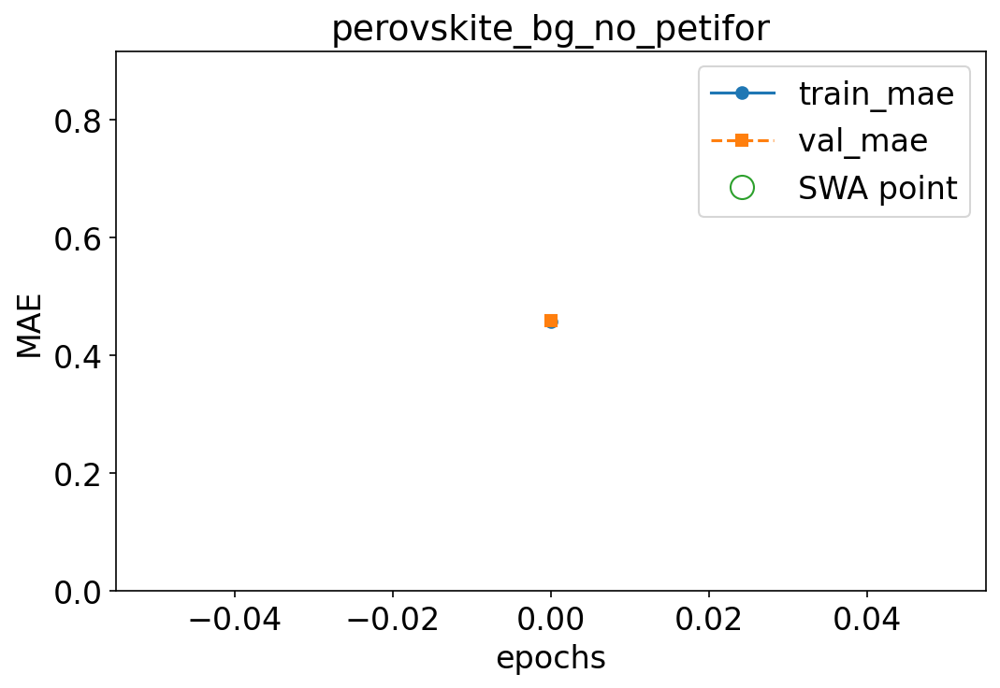

Epoch: 19/300 --- train mae: 0.241 val mae: 0.294


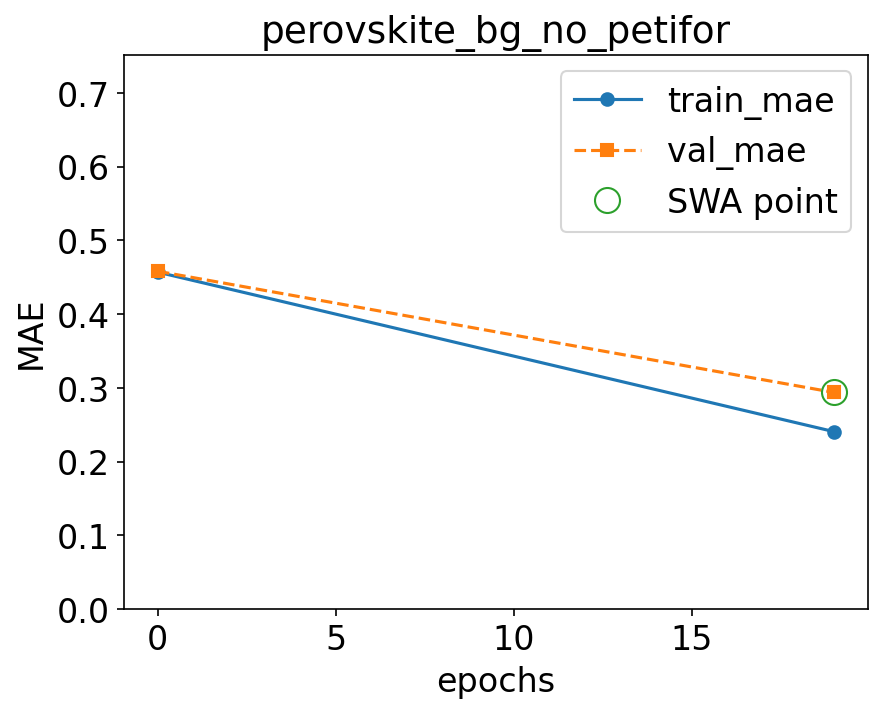

Epoch: 39/300 --- train mae: 0.158 val mae: 0.284


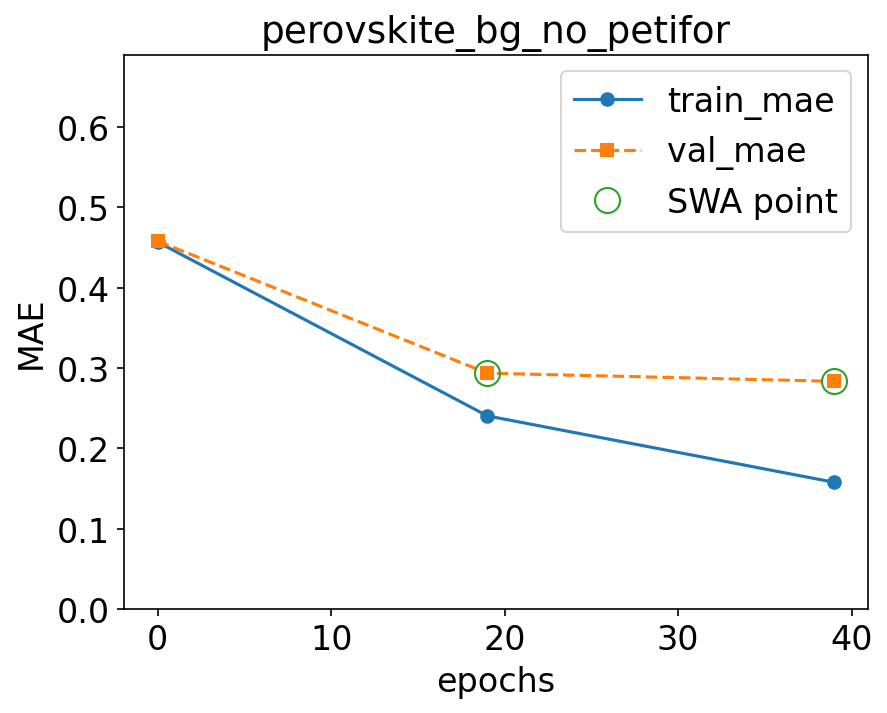

Epoch: 59/300 --- train mae: 0.11 val mae: 0.28


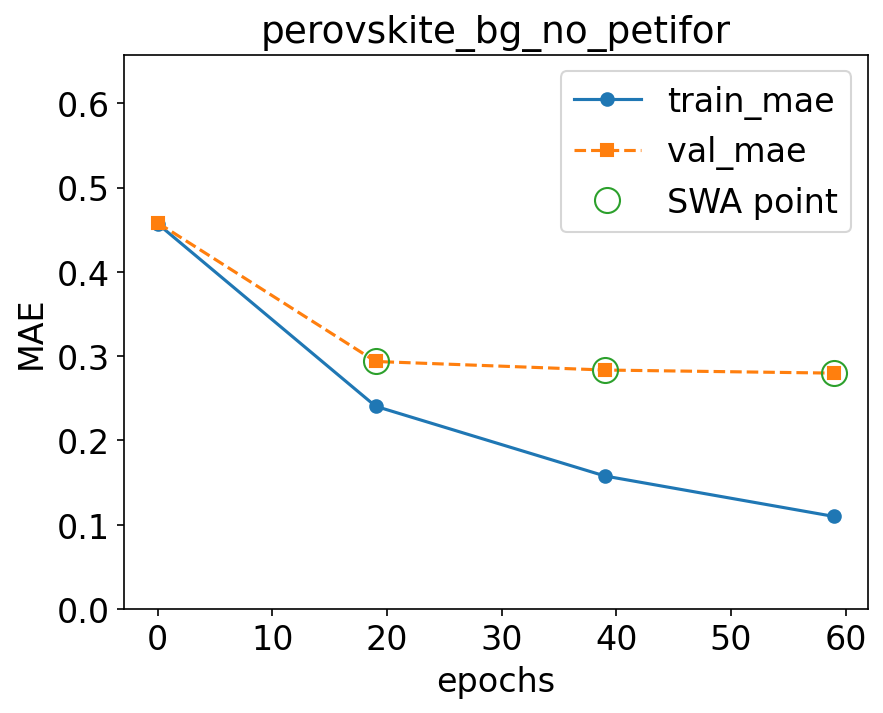

Epoch: 79/300 --- train mae: 0.0839 val mae: 0.268


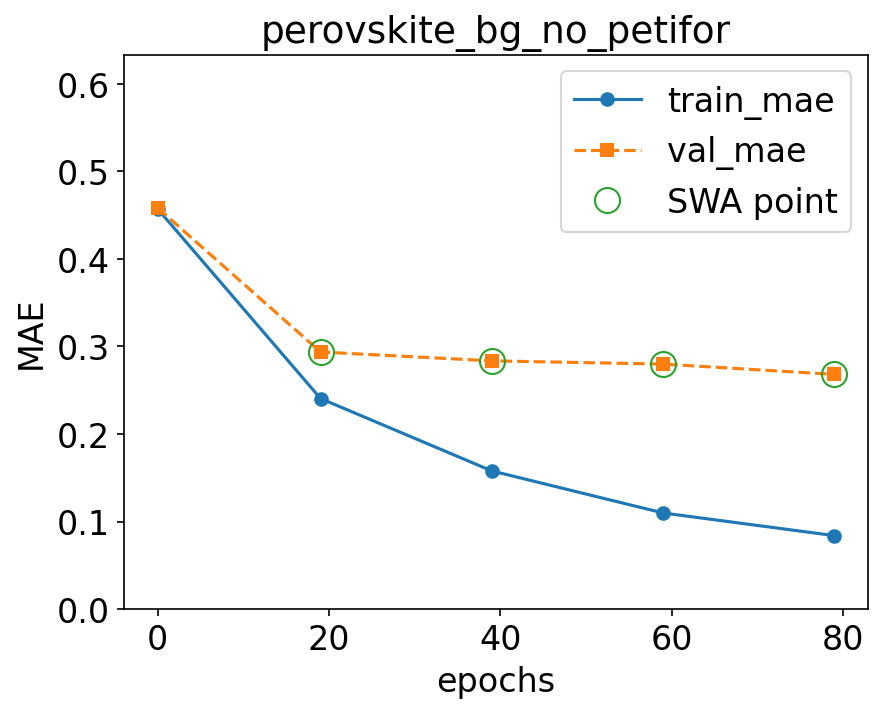

Epoch: 99/300 --- train mae: 0.0666 val mae: 0.269


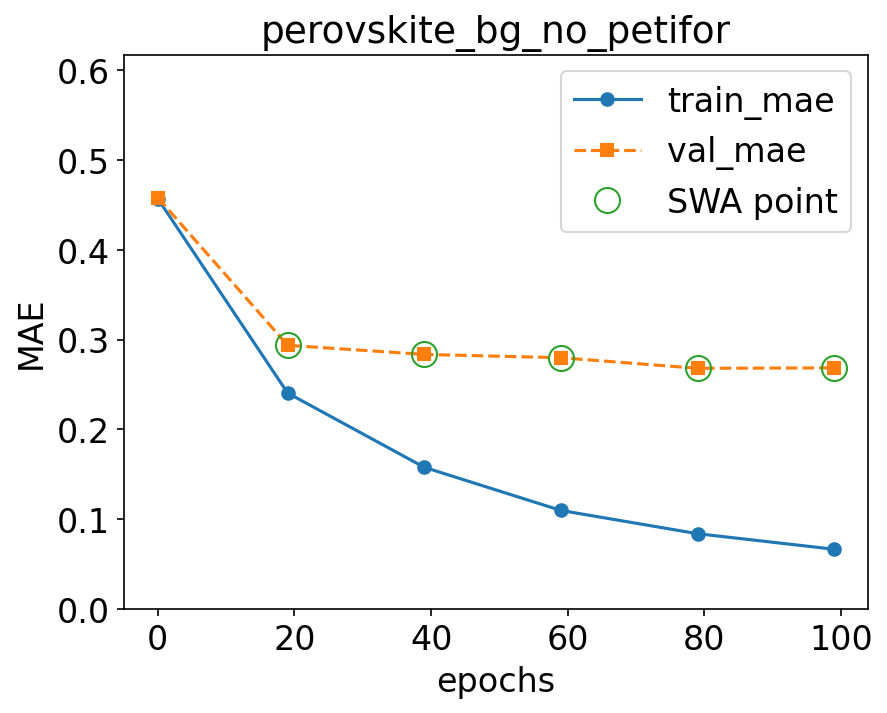

Epoch: 119/300 --- train mae: 0.0549 val mae: 0.267


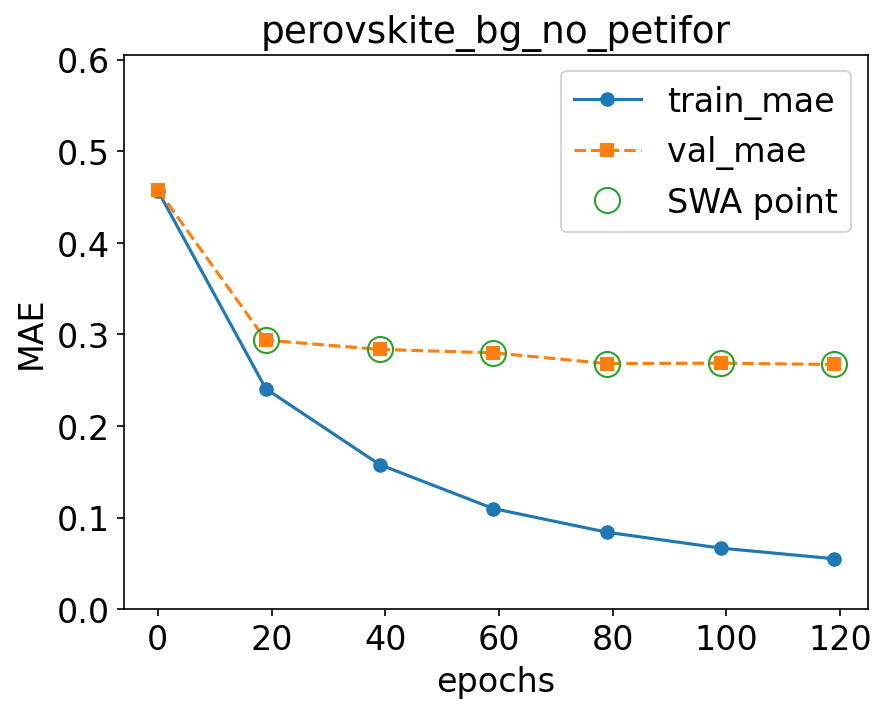

Epoch: 139/300 --- train mae: 0.0472 val mae: 0.261


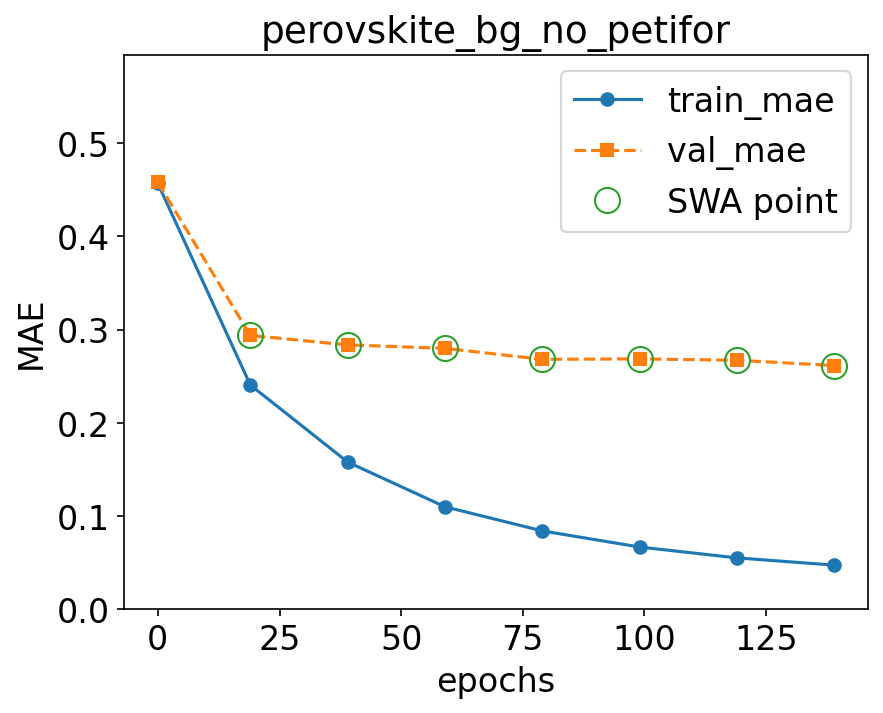

Epoch: 159/300 --- train mae: 0.0422 val mae: 0.258


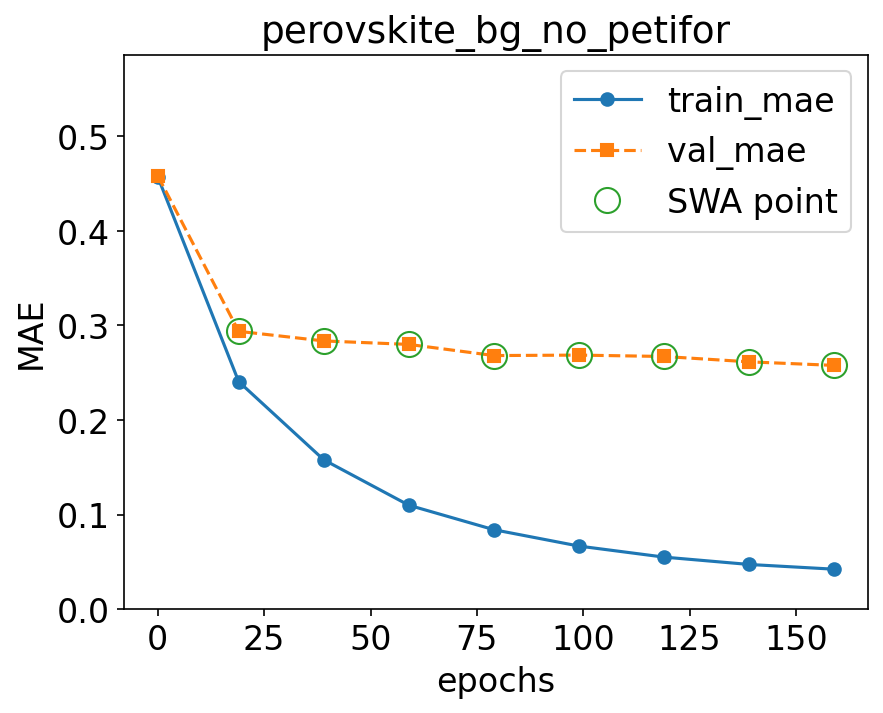

Epoch: 179/300 --- train mae: 0.0367 val mae: 0.258


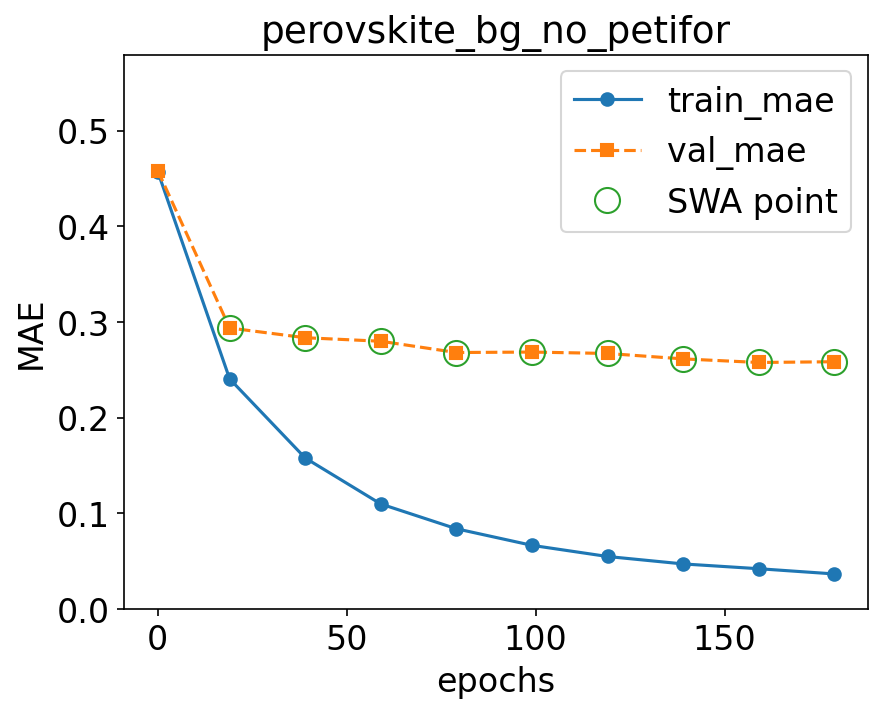

Epoch: 199/300 --- train mae: 0.0336 val mae: 0.26


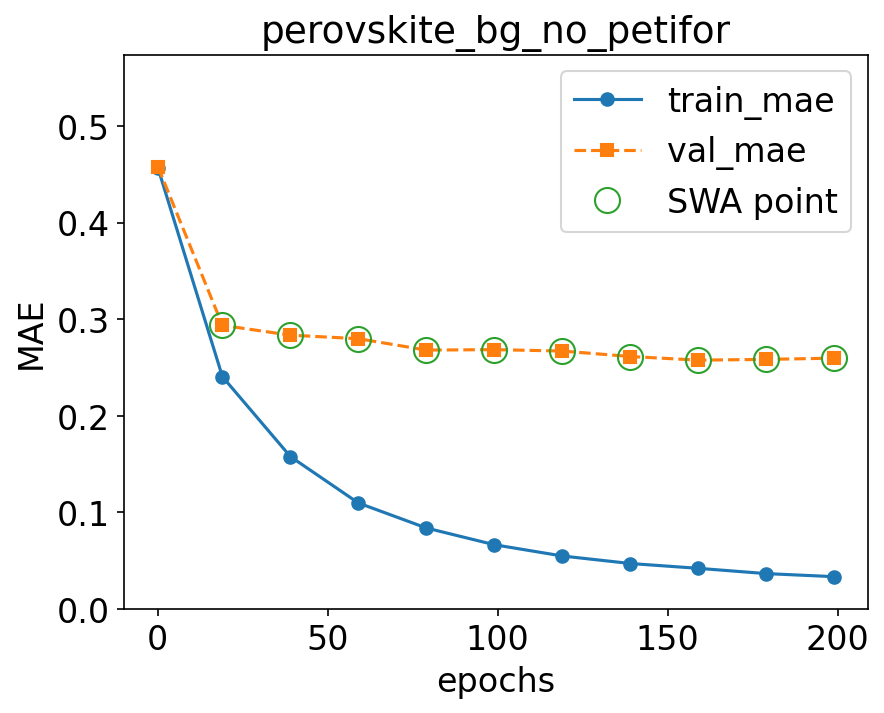

Epoch 219 failed to improve.
Discarded: 1/3 weight updates
Epoch: 219/300 --- train mae: 0.0321 val mae: 0.266


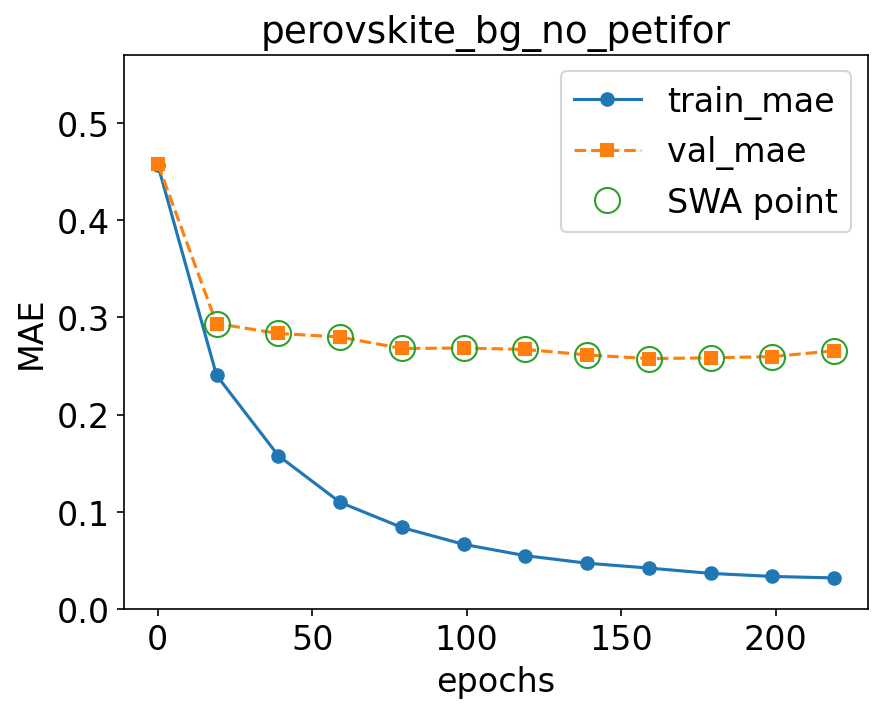

Epoch: 239/300 --- train mae: 0.0288 val mae: 0.257


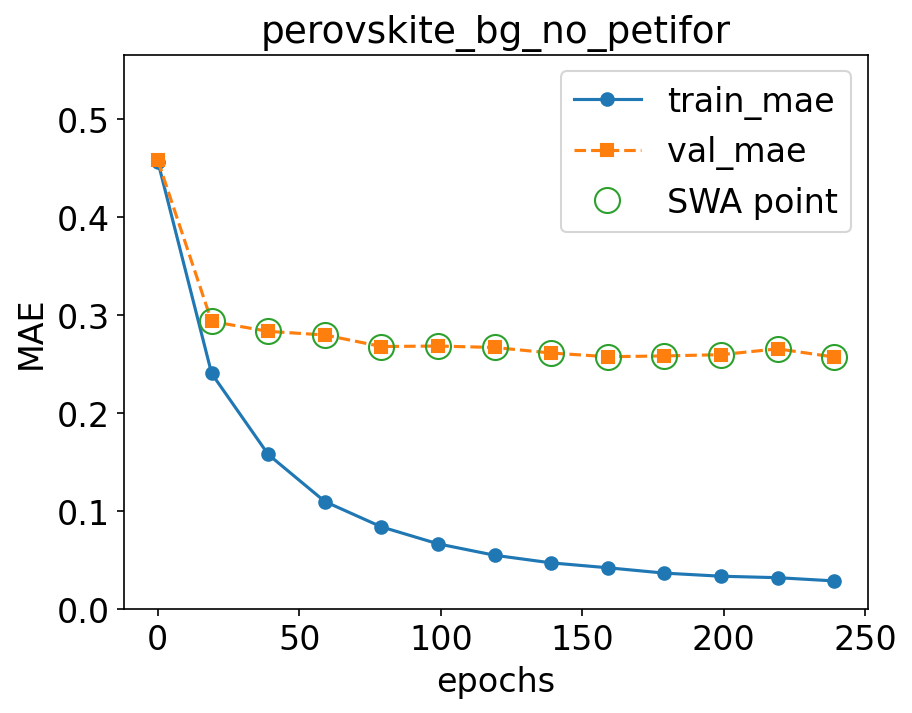

Epoch: 259/300 --- train mae: 0.0275 val mae: 0.258


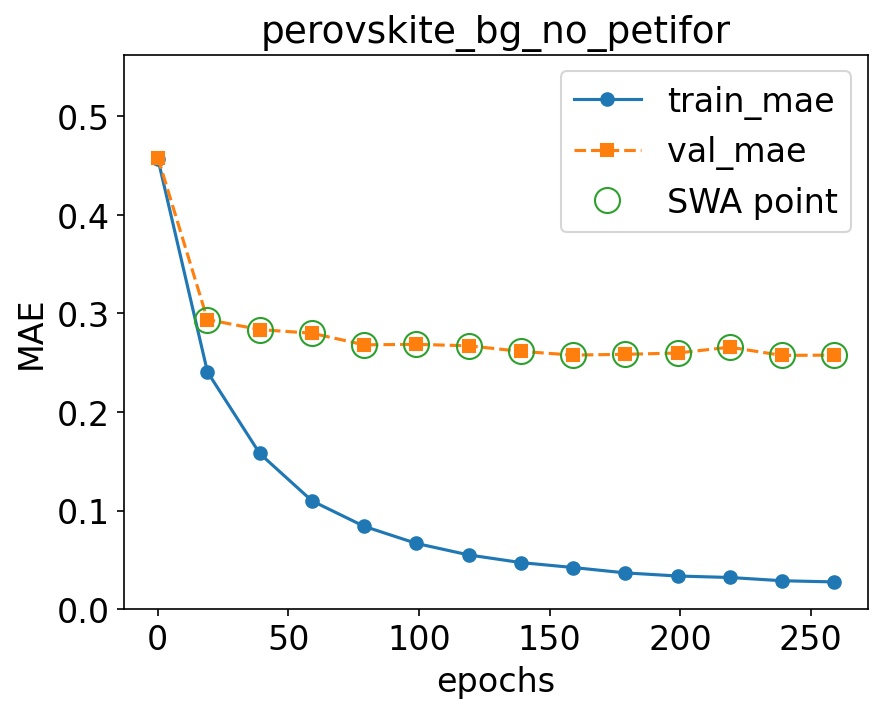

Epoch: 279/300 --- train mae: 0.0264 val mae: 0.258


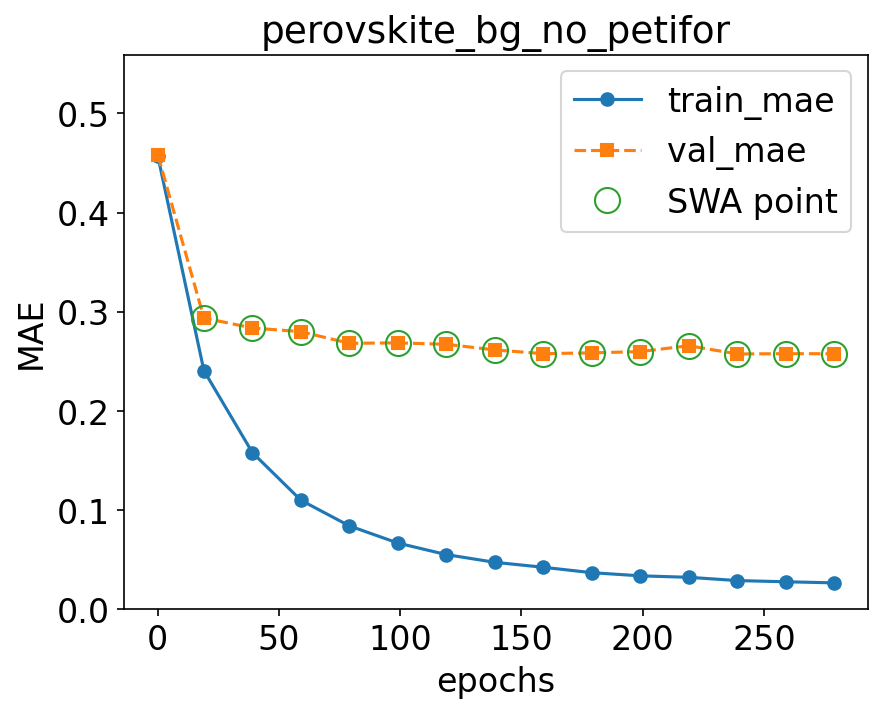

Epoch 299 failed to improve.
Discarded: 2/3 weight updates
Epoch: 299/300 --- train mae: 0.0257 val mae: 0.267


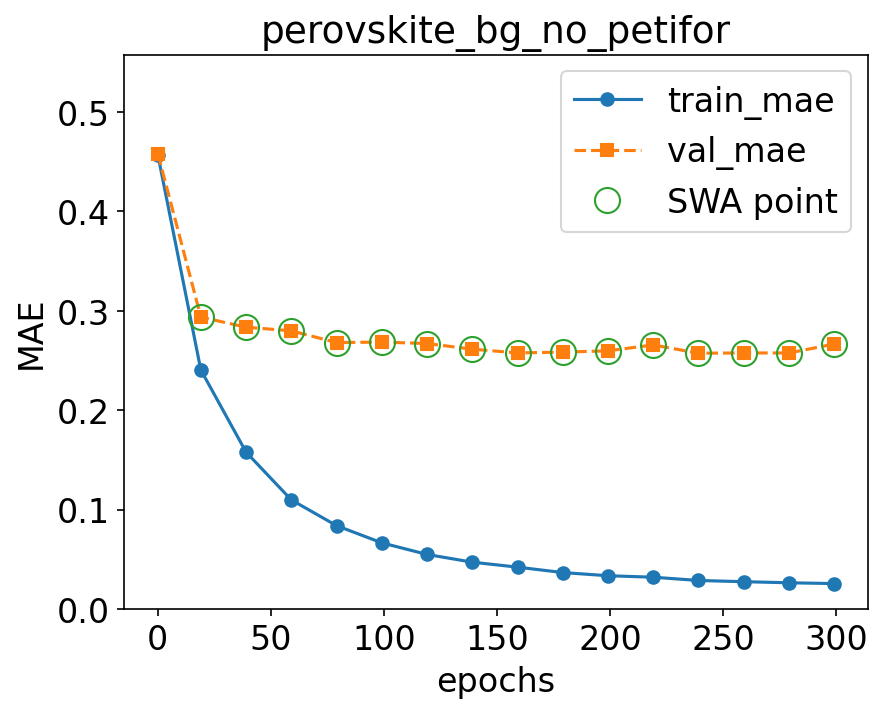

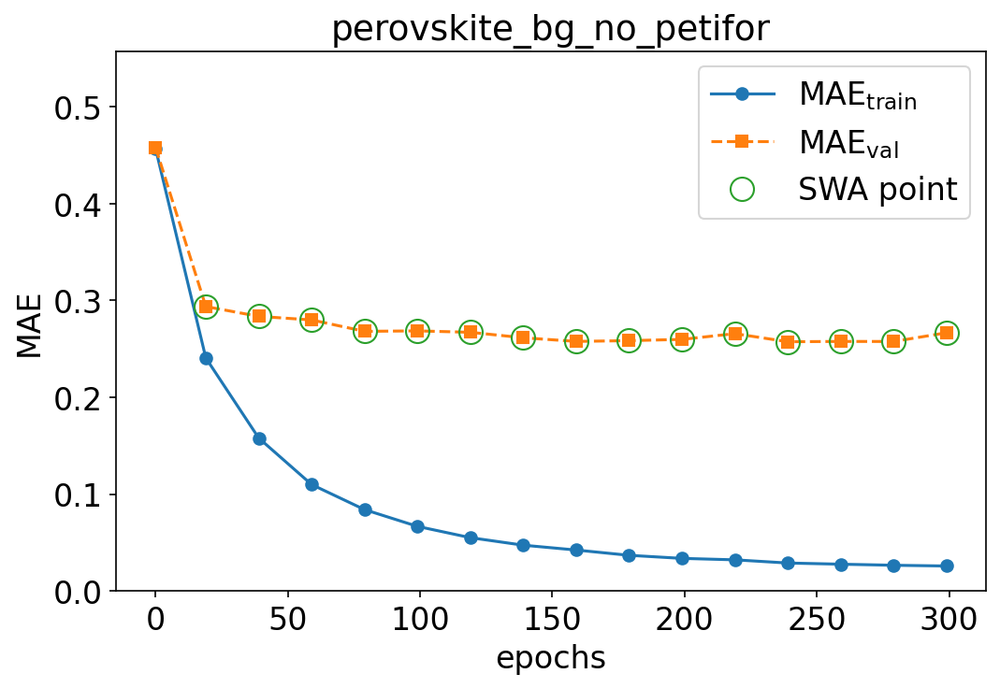

Saving network (perovskite_bg_no_petifor) to models/trained_models/perovskite_bg_no_petifor.pth


Generating EDM: 100%|██████████| 363/363 [00:00<00:00, 190721.83formulae/s]

skipping composition OrderedDict([('H', 115.0), ('I', 60.0), ('N', 38.0), ('Pb', 20.0), ('C', 19.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 295.0), ('I', 150.0), ('N', 98.0), ('Pb', 50.0), ('C', 49.0), ('S', 1.0), ('X', 1.0)])
skipping composition OrderedDict([('H', 102.0), ('I', 60.0), ('Pb', 20.0), ('C', 17.0), ('N', 17.0), ('X', 1.0)])
loading data with up to 9 elements in the formula
R2 score: 0.3832
MSE: 0.2667
MAE: 0.2557 eV

       With Pettifor:  MAE = 0.248 eV,  R² = 0.423
    Without Pettifor:  MAE = 0.256 eV,  R² = 0.383
                       ΔMAE = +0.008 eV


In [14]:
# Drop Pettifor columns from train/val/test
train_no_pf = train_df.drop(columns=feature_names)
val_no_pf   = val_df.drop(columns=feature_names)
test_no_pf  = test_df.drop(columns=feature_names)

model_no_pf = CrabNet(
    mat_prop='bandgap',
    model_name='perovskite_bg_no_petifor',
    elem_prop='mat2vec',
    learningcurve=True,
)
model_no_pf.fit(train_no_pf, val_no_pf)

m_no_pf = test_r2_score(test_no_pf, feature_names=None, crabnet_bandgap=model_no_pf, plot=False)

print(f'\n{"With Pettifor":>20s}:  MAE = {test_metrics["mae"]:.3f} eV,  R² = {test_metrics["r2"]:.3f}')
print(f'{"Without Pettifor":>20s}:  MAE = {m_no_pf["mae"]:.3f} eV,  R² = {m_no_pf["r2"]:.3f}')
delta_mae = m_no_pf['mae'] - test_metrics['mae']
print(f'{"":>20s}   ΔMAE = {delta_mae:+.3f} eV')

---
## 11. Predict Bandgap for Candidate Materials

We apply the main trained model to predict bandgaps for:
1. **CrystaLLM-generated** compositions (Section 3.2 of the manuscript)
2. **SISSO-screened** stable compositions (Section 3.1)
3. **Experimentally reported** chalcogenide perovskites (validation)

In [16]:
# Load main model for predictions
crabnet_main = load_model()

print('--- CrystaLLM candidates ---')
df_crystallm = get_CrystaLLM_predictions(crabnet_model=crabnet_main)
print(f'Predicted {len(df_crystallm)} compositions\n')

print('--- SISSO candidates ---')
df_sisso = get_SISSO_predictions(crabnet_model=crabnet_main)
print(f'Predicted {len(df_sisso)} compositions\n')

print('--- Experimental chalcogenide perovskites ---')
df_expt = get_experimental_predictions(crabnet_model=crabnet_main)


Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0
--- CrystaLLM candidates ---


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9177.91formulae/s]

loading data with up to 3 elements in the formula



Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10699.76formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8648.05formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8272.79formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6260.16formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9467.95formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6512.89formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10407.70formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13357.66formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8525.01formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11305.40formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5882.61formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8144.28formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6615.62formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12300.01formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6132.02formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4771.68formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3833.92formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3778.65formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5426.01formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5140.08formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7002.18formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5518.82formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 2548.18formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3682.44formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12264.05formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8371.86formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3563.55formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5974.79formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9915.61formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9137.92formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8176.03formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5178.15formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5737.76formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 14563.56formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5949.37formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9642.08formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 15650.39formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5683.34formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 2985.27formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6069.90formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 1712.66formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5146.39formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4946.11formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4206.92formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12865.96formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9446.63formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11522.81formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6026.30formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13443.28formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5336.26formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 85.88formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3938.31formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5461.33formulae/s]


loading data with up to 3 elements in the formula
Predicted 54 compositions

--- SISSO candidates ---


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11008.67formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 257.11formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4415.06formulae/s]

loading data with up to 3 elements in the formula



Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3979.42formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5874.38formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6393.76formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10979.85formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6533.18formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3675.99formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7073.03formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10010.27formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7182.03formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11522.81formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5349.88formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5454.23formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10082.46formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5197.40formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6636.56formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10381.94formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9939.11formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10951.19formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10010.27formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5011.12formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 525.87formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5714.31formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9754.20formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4804.47formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8388.61formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8542.37formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8683.86formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 1642.25formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 2169.84formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 1972.86formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5924.16formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12157.40formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3379.78formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8439.24formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4223.87formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12787.51formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 1588.15formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7269.16formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10082.46formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8867.45formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6909.89formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 14563.56formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7256.58formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13573.80formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11748.75formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6123.07formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6297.75formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 1804.78formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6442.86formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6808.94formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9137.92formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13189.64formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6250.83formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5011.12formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11650.84formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4036.87formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11983.73formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12945.38formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3530.56formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4804.47formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10106.76formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8738.13formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6204.59formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3744.91formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13025.79formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5533.38formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 1345.19formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11244.78formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4481.09formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12945.38formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9341.43formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8665.92formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5691.05formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 184.54formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10538.45formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5691.05formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9383.23formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9597.95formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4173.44formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7767.23formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 2699.04formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4899.89formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5017.11formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11366.68formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9157.87formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6721.64formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9000.65formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7854.50formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9467.95formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7598.38formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7626.01formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10082.46formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11814.94formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6626.07formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7738.57formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11275.01formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4573.94formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11491.24formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3093.14formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10837.99formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7371.36formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7810.62formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4860.14formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3975.64formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4975.45formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7767.23formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6241.52formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5637.51formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5171.77formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6096.37formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13066.37formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6678.83formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13486.51formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4104.02formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10727.12formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5242.88formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4559.03formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4387.35formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6909.89formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12865.96formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5405.03formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11618.57formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12446.01formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4391.94formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13315.25formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5229.81formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13189.64formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11715.93formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11748.75formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4744.69formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7108.99formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7989.15formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 954.77formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6921.29formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6831.11formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4877.10formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4495.50formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10106.76formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6269.51formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6462.72formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5262.61formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5991.86formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6043.67formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5526.09formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8886.24formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3211.57formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9709.04formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4029.11formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5249.44formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10230.01formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9799.78formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5577.53formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 3880.02formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12985.46formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5275.85formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6944.21formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11335.96formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9098.27formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4854.52formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6887.20formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7244.05formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9039.45formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7157.52formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9822.73formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7084.97formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6584.46formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7449.92formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6241.52formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7436.71formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 12446.01formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6096.37formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 7169.75formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 4240.95formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 8371.86formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 6326.25formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 5599.87formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10645.44formulae/s]


loading data with up to 3 elements in the formula


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9892.23formulae/s]


loading data with up to 3 elements in the formula
Predicted 181 compositions

--- Experimental chalcogenide perovskites ---

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11397.57formulae/s]


loading data with up to 3 elements in the formula
Experimental bandgap for BaZrS3: 1.75 eV
Bandgap prediction for BaZrS3: 1.83 ± 0.46 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9383.23formulae/s]


loading data with up to 3 elements in the formula
Experimental bandgap for BaTiS3: 1.3 eV
Bandgap prediction for BaTiS3: 2.33 ± 2.43 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 14614.30formulae/s]


loading data with up to 3 elements in the formula
Experimental bandgap for LaYS3: 2.3 eV
Bandgap prediction for LaYS3: 2.01 ± 0.24 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 11586.48formulae/s]


loading data with up to 3 elements in the formula
Experimental bandgap for LaScS3: 2.9 eV
Bandgap prediction for LaScS3: 1.97 ± 0.51 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 15363.75formulae/s]


loading data with up to 3 elements in the formula
Experimental bandgap for CaZrS3: 1.9 eV
Bandgap prediction for CaZrS3: 1.78 ± 0.37 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 9532.51formulae/s]


loading data with up to 3 elements in the formula
Experimental bandgap for BaHfS3: 2.17 eV
Bandgap prediction for BaHfS3: 2.08 ± 0.51 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 17331.83formulae/s]


loading data with up to 3 elements in the formula
Experimental bandgap for SrZrS3: 2.05 eV
Bandgap prediction for SrZrS3: 1.89 ± 0.53 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 10951.19formulae/s]


loading data with up to 3 elements in the formula
Experimental bandgap for SrHfS3: 2.32 eV
Bandgap prediction for SrHfS3: 2.12 ± 0.6 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 14027.77formulae/s]


loading data with up to 4 elements in the formula
Experimental bandgap for BaZr(S0.6Se0.4)3: 1.76 eV
Bandgap prediction for BaZr(S0.6Se0.4)3: 1.75 ± 0.23 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 15768.06formulae/s]


loading data with up to 4 elements in the formula
Experimental bandgap for Ba(Zr0.95Ti0.05)S3: 1.63 eV
Bandgap prediction for Ba(Zr0.95Ti0.05)S3: 1.65 ± 0.18 eV

Model architecture: out_dims, d_model, N, heads
3, 512, 3, 4
Running on compute device: cuda:0


Generating EDM: 100%|██████████| 1/1 [00:00<00:00, 13573.80formulae/s]

loading data with up to 4 elements in the formula
Experimental bandgap for Ba(Zr0.96Ti0.04)S3: 1.51 eV
Bandgap prediction for Ba(Zr0.96Ti0.04)S3: 1.53 ± 0.08 eV


---
## 12. Summary

| Metric | Value |
|--------|-------|
| Overall test MAE | *see table in §5* |
| LOOCV chalc. pvk MAE | *see table in §6* |
| Pettifor ablation ΔMAE | *see §10* |

**Key findings:**
- The combined three-source training set enables CrabNet to generalize across
  halide and chalcogenide chemistry domains.
- LOOCV on chalcogenide perovskites provides a per-compound error that
  is more meaningful than the single test-set point available in a random split.
- The Pettifor composition fingerprint (**extend_features**) improves the MAE;
  the ablation quantifies this contribution.
- Encoder comparison is available in notebook **4.1**.